In [83]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np

In [84]:
concentrado1920 = pd.read_excel('./19-20CONCENTRADO_V_PRE_P_C.xlsx',skiprows=3)
concentrado1920 = concentrado1920.drop(concentrado1920.index[-5:])
concentrado1920.columns = ["Etiqueta", "Origen", "Tratamiento", "X_vivero", "y_vivero", "Fusarium_V", 
    "Neopestalotiopsis_V", "Oomicetes_V", "Cylindrocarpon_V", "Alternaria_V", "Macrophomina_V",
    "X_pre_trasplante", "Y_pre_trasplante", "Fusarium_P", "Neopestalotiopsis_P", "Oomicetes_P", "Cylindrocarpon_P", "Alternaria_P",
    "X_parcela_comercial", "Y_parcela_comercial", "Fusarium_C", "Neopestalotiopsis_C", "Cylindrocarpon_C"]
vivero = concentrado1920[['Etiqueta', 'Origen', 'Tratamiento', 'X_vivero', 'y_vivero',
                          'Fusarium_V', 'Neopestalotiopsis_V', 'Oomicetes_V', 'Cylindrocarpon_V', 'Alternaria_V', 'Macrophomina_V']].copy()
vivero['Etapa'] = 'Vivero'
vivero.rename(columns={'X_vivero': 'X',
                       'y_vivero': 'Y',
                       'Fusarium_V': 'Fusarium',
                       'Neopestalotiopsis_V': 'Neopestalotiopsis',
                       'Oomicetes_V': 'Oomicetes',
                       'Cylindrocarpon_V': 'Cylindrocarpon',
                       'Alternaria_V': 'Alternaria',
                       'Macrophomina_V': 'Macrophomina'}, inplace=True)
pretrasplante = concentrado1920[['Etiqueta', 'Origen', 'Tratamiento', 'X_pre_trasplante', 'Y_pre_trasplante',
                                 'Fusarium_P', 'Neopestalotiopsis_P', 'Oomicetes_P', 'Cylindrocarpon_P', 'Alternaria_P']].copy()
pretrasplante['Etapa'] = 'Pre_trasplante'
pretrasplante['Macrophomina'] = None 
pretrasplante.rename(columns={'X_pre_trasplante': 'X',
                              'Y_pre_trasplante': 'Y',
                              'Fusarium_P': 'Fusarium',
                              'Neopestalotiopsis_P': 'Neopestalotiopsis',
                              'Oomicetes_P': 'Oomicetes',
                              'Cylindrocarpon_P': 'Cylindrocarpon',
                              'Alternaria_P': 'Alternaria'}, inplace=True)
comercial = concentrado1920[['Etiqueta', 'Origen', 'Tratamiento', 'X_parcela_comercial', 'Y_parcela_comercial',
                             'Fusarium_C', 'Neopestalotiopsis_C', 'Cylindrocarpon_C']].copy()
comercial['Etapa'] = 'Parcela_comercial'
comercial['Oomicetes'] = None
comercial['Alternaria'] = None
comercial['Macrophomina'] = None
comercial.rename(columns={'X_parcela_comercial': 'X',
                          'Y_parcela_comercial': 'Y',
                          'Fusarium_C': 'Fusarium',
                          'Neopestalotiopsis_C': 'Neopestalotiopsis',
                          'Cylindrocarpon_C': 'Cylindrocarpon'}, inplace=True)

pretrasplante = pretrasplante.dropna(subset=['X', 'Y'])
comercial = comercial.dropna(subset=['X', 'Y'])

concentrado1920 = pd.concat([vivero, pretrasplante, comercial], ignore_index=True)
concentrado1920 = concentrado1920[['Etiqueta', 'Origen', 'Tratamiento', 'Etapa', 'X', 'Y', 'Fusarium', 'Neopestalotiopsis', 
                                   'Oomicetes', 'Cylindrocarpon', 'Alternaria', 'Macrophomina']]
concentrado1920[['Fusarium', 'Neopestalotiopsis', 'Oomicetes', 'Cylindrocarpon', 'Alternaria', 'Macrophomina']] = concentrado1920[['Fusarium', 'Neopestalotiopsis', 'Oomicetes', 'Cylindrocarpon', 'Alternaria', 'Macrophomina']].applymap(lambda x: 1 if str(x).strip() in ['F', 'O', 'N', 'M', 'A'] else 0)
concentrado1920.head()

/var/folders/g1/6fhcms6n0px1d6b5mxmlwwcw0000gn/T/ipykernel_57832/2722207637.py:47: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  concentrado1920[['Fusarium', 'Neopestalotiopsis', 'Oomicetes', 'Cylindrocarpon', 'Alternaria', 'Macrophomina']] = concentrado1920[['Fusarium', 'Neopestalotiopsis', 'Oomicetes', 'Cylindrocarpon', 'Alternaria', 'Macrophomina']].applymap(lambda x: 1 if str(x).strip() in ['F', 'O', 'N', 'M', 'A'] else 0)


,Etiqueta,Origen,Tratamiento,Etapa,X,Y,Fusarium,Neopestalotiopsis,Oomicetes,Cylindrocarpon,Alternaria,Macrophomina
0,A1,Crown nursery,RAIZ DESNUDA,Vivero,20°05'01.27'' N,101°34'14.21'' W,1,0,0,0,0,0
1,A2,Crown nursery,RAIZ DESNUDA,Vivero,20°10'21'' N,101°41'36'' W,1,1,1,0,0,0
2,A3,Crown nursery,RAIZ DESNUDA,Vivero,20°10'48'' N,101°41'39'' W,1,0,0,0,0,0
3,A4,NaN,NaN,Vivero,20°9'4'' N,101°41'17'' W,1,0,1,0,1,0
4,A5,Crown nursery,RAIZ DESNUDA,Vivero,20°08'5'' N,101°42'4'' W,1,0,1,0,0,0


In [85]:
Data21_22 = pd.read_excel('./21-22.xlsx',skiprows=2)
Data21_22.columns = ['No. De Ranchos', 'Zonas muestreadas', 'No. Etiquetado', 'Cultivo',
       'Municipio', 'Propietario', 'Variedad', 'Nombre del rancho',
       'N', 'W', 'Este (x)', 'Norte (y)', 'Zona UTM',
       'INCIDENCIA %', 'MORTALIDAD% ']
Data21_22.head()

,No. De Ranchos,Zonas muestreadas,No. Etiquetado,Cultivo,Municipio,Propietario,Variedad,Nombre del rancho,N,W,Este (x),Norte (y),Zona UTM,INCIDENCIA %,MORTALIDAD%
0,7,Maravatio,10,Fresa,Tarandacuao,Eduardo Hernandez,Cabrillo,Cooler,20.014750,-100.530111,339942.625247,2.213845e+06,14,31.0,16.8
1,8,Maravatio,11,Fresa,Tarandacuao,Eduardo Hernandez,Albion,Las Carreteras,20.018611,-100.528611,340103.465486,2.214271e+06,14,42.4,7.6
2,9,Maravatio,12,Fresa,Tarandacuao,Eduardo Hernandez,Monterrey,Buena Vista,20.030833,-100.522222,340784.191458,2.215618e+06,14,46.4,17.2
3,10,Maravatio,13,Fresa,Tarandacuao,Eduardo Hernandez,Albion,Las Cabañitas,20.020167,-100.535833,339349.444307,2.214450e+06,14,37.0,3.8
4,11,Maravatio,14,Fresa,Tarandacuao,Eduardo Hernandez,Albion,La Nuez,20.024417,-100.533333,339615.307934,2.214918e+06,14,2.4,0.2


In [86]:
Data21_22['Variedad'].unique()

array(['Cabrillo', 'Albion', 'Monterrey', 'Fortuna', 'Sayulita',
       'Camino Real', '13-20', 'Sensation', 'Oceola', 'Liliana',
       'Veronica', 'Irene', 'Palmeritas', 'Codigo', 'Frontera', 'Shyra',
       'Rociera'], dtype=object)

In [87]:
Data21_22['Variedad'] = Data21_22['Variedad'].replace({'13-20':'NO DOCUMENTADO',
                                                       'Oceola':'Osceola',
                                                       'Liliana':'Elyana',
                                                       'Veronica':'NO DOCUMENTADO',
                                                       'Irene':'NO DOCUMENTADO',
                                                       'Codigo':'NO DOCUMENTADO',
                                                       'Shyra':'NO DOCUMENTADO'})

In [88]:
Data22_23 = pd.read_excel('./22-23.xlsx',skiprows=2)
Data22_23.columns = ['No. De Ranchos', 'Zonas muestreadas', 'No. Etiquetado', 'Cultivo',
       'Municipio', 'Variedad', 'Nombre del rancho',
       'N', 'W', 'Este (x)', 'Norte (y)', 'Zona UTM',
       'INCIDENCIA %', 'SEVERIDAD %' ,'MORTALIDAD% ']
Data22_23.head()

,No. De Ranchos,Zonas muestreadas,No. Etiquetado,Cultivo,Municipio,Variedad,Nombre del rancho,N,W,Este (x),Norte (y),Zona UTM,INCIDENCIA %,SEVERIDAD %,MORTALIDAD%
0,1,Zona Maravatio,74.1,Fresa,Maravatio,Frontera,El Cerezo 1,20.044974,-100.765252,315375.414017,2.217433e+06,14,99.0,89.08,65.6
1,2,Zona Maravatio,61.0,Fresa,Maravatio,Frontera,La Arena,20.054318,-100.547369,338177.558967,2.218242e+06,14,72.0,45.08,18.4
2,3,Zona Maravatio,72.0,Fresa,Maravatio,Frontera,La Loma,19.933778,-100.458675,347338.518502,2.204816e+06,14,70.4,58.16,43.8
3,4,Zona Maravatio,67.0,Fresa,Maravatio,Frontera,Hermanos Rubio,19.938984,-100.508040,342176.359784,2.205438e+06,14,61.4,53.08,41.8
4,5,Zona Maravatio,69.0,Fresa,Maravatio,San Andreas,Encinillas,19.962547,-100.471812,345991.312152,2.208012e+06,14,56.2,37.68,15.4


In [89]:
Data22_23['Variedad'].unique() 

array(['Frontera', 'San Andreas', 'Royal', 'Camino Real', 'Sensation',
       'Albion', 'NO DOCUMENTADO', 'Sayula', 'Festival', 'Fortuna',
       'Codigo', 'Palmeritas', 'Santa Maria', 'Veronica', 'Victor',
       'Niña', 'Giddings', 'Adelanto', 'Warrior', 'Cabrillo', 'Monterrey'],
      dtype=object)

In [90]:
Data22_23['Variedad'] = Data22_23['Variedad'].replace({'Sayula':'Sayulita',
                                                       'Codigo':'NO DOCUMENTADO',
                                                       'Veronica':'NO DOCUMENTADO',
                                                       'Giddings':'NO DOCUMENTADO'})

In [91]:
Dcrudos_19_20 = pd.read_excel('./Dcrudos-Survey19-20.xlsx')
Dcrudos_19_20['No- Parcela'] = Dcrudos_19_20['No- Parcela'].ffill()
dfs_rellenados = []
for parcela in Dcrudos_19_20['No- Parcela'].dropna().unique():
    df_parcela = Dcrudos_19_20[Dcrudos_19_20['No- Parcela'] == parcela].copy()
    df_parcela = df_parcela.ffill()
    dfs_rellenados.append(df_parcela)

Dcrudos_19_20 = pd.concat(dfs_rellenados, ignore_index=True)
Dcrudos_19_20.head()

/var/folders/g1/6fhcms6n0px1d6b5mxmlwwcw0000gn/T/ipykernel_57832/3176390307.py:6: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df_parcela = df_parcela.ffill()


,No- Parcela,ETIQUETA,COORDENADAS,Latitud,Longitud,MUNICIPIO,SUPERFICIE,VARIEDAD,Variety,CEP-R.D.,...,4.1,5.1,%SEVERIDAD(PLANTA),1.2,2.2,3.2,4.2,5.2,SEVERIDAD EN HOJA \nPROMEDIO,%SEVERIDAD HOJA BASADO EN ESCALA De PHOMOPSIS)
0,1.0,1T,"19°54'19.22''N, \n102°10'19.11''w",NaN,NaN,TANGANCICUARO,2 HA,ALBION,Albion,R.D.,...,1,0,56.0,2,3,3,4,4,3,50.5
1,1.0,1T,"19°54'19.22''N, \n102°10'19.11''w",NaN,NaN,TANGANCICUARO,2 HA,ALBION,Albion,R.D.,...,0,0,48.0,1,4,3,1,4,3,50.5
2,1.0,1T,"19°54'19.22''N, \n102°10'19.11''w",NaN,NaN,TANGANCICUARO,2 HA,ALBION,Albion,R.D.,...,2,1,76.0,3,5,2,4,4,3,50.5
3,1.0,1T,"19°54'19.22''N, \n102°10'19.11''w",NaN,NaN,TANGANCICUARO,2 HA,ALBION,Albion,R.D.,...,1,0,36.0,4,1,2,1,2,4,70.5
4,1.0,1T,"19°54'19.22''N, \n102°10'19.11''w",NaN,NaN,TANGANCICUARO,2 HA,ALBION,Albion,R.D.,...,4,0,72.0,4,4,4,3,4,2,30.5


In [92]:
Dcrudos_19_20['Variety'].unique()

array(['Albion', 'Sayulita', 'Frontera', 'Oseola', 'Fortuna', 'Camino'],
      dtype=object)

In [93]:
Dcrudos_19_20['Variety'] = Dcrudos_19_20['Variety'].replace({'Oseola':'Osceola',
                                                             'Camino':'Camino Real'})

In [94]:
entrevistas23 = pd.read_excel('./BASE DE DATOS_NEOPEST_2023xlsx.xlsx',sheet_name='ENTREVISTAS',skiprows=1).drop('Unnamed: 0',axis=1)
entrevistas23 = entrevistas23.drop(entrevistas23.index[-4:])
var_epi23 = pd.read_excel('./BASE DE DATOS_NEOPEST_2023xlsx.xlsx',sheet_name='VARIABLES_EPI',skiprows=1).drop(['Unnamed: 0','Unnamed: 1'],axis=1)
var_epi23 = var_epi23.drop(var_epi23.index[-8:])
var_epi23 = var_epi23[['Y', 'X', 'Columna1', 'UNIDAD DE MUESTREO', 'NUMERO DE PARCELA',
       'NOMBRE DE PARCELA', 'VARIEDAD', 'TIPO DE PLANTACION', 'INCIDENCIA ',
       'SEVERIDAD', 'MORTALIDAD']]
eval_campo23 = pd.read_excel('./BASE DE DATOS_NEOPEST_2023xlsx.xlsx',sheet_name='EVALUACIONES_campo',skiprows=1).drop('Unnamed: 0',axis=1)
eval_campo23 = eval_campo23[['PARCELA, VARIEDAD', 'PUNTO', 0, 1, 2, 3, 4, 5, 'INCI', 'SEV', 'MORT']]
aislamientos23 = pd.read_excel('./BASE DE DATOS_NEOPEST_2023xlsx.xlsx',sheet_name='AISLAMIENTOS',skiprows=3)
aislamientos23 = aislamientos23[['Num. Parcela', 'Nom. Parcela', 'Variedad', 'Organo',
       'Neopestalotiopsis', 'Fusarium', 'Cylindrocarpon', 'Macrophomina',
       'Rhizoctonia', 'Phytophthora', 'Alternaria', 'Botrytis', 'Colletotrichum',
       'Aspergillus', 'NO ID', 'Trichoderma', 'Rizophus', 'FALTANTES']]
aislamientos23 = aislamientos23.iloc[0:282]
aislamientos23.head()

,Num. Parcela,Nom. Parcela,Variedad,Organo,Neopestalotiopsis,Fusarium,Cylindrocarpon,Macrophomina,Rhizoctonia,Phytophthora,Alternaria,Botrytis,Colletotrichum,Aspergillus,NO ID,Trichoderma,Rizophus,FALTANTES
0,1.1,EL PEJO 1,SENSATION,CORONA,5,1,0,0,0,0,0,0,0,0,0,0,0,0
1,1.1,EL PEJO 1,SENSATION,RAIZ,3,6,0,0,0,0,0,2,0,0,0,0,0,0
2,1.2,EL PEJO 2,VICTOR,CORONA,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1.2,EL PEJO 2,VICTOR,RAIZ,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1.3,EL PEJO 3,SANTA MARIA,CORONA,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [95]:
entrevistas23.columns

Index(['Y', 'X', 'UNIDAD DE MUESTREO', 'NUMERO DE PARCELA',
       'NOMBRE DE PARCELA', 'VARIEDAD', 'TIPO DE PLANTACION', 'INCIDENCIA ',
       'SEVERIDAD', 'MORTALIDAD', 'FECHA DE MUESTREO', 'PRODUCTOR', 'CONTACTO',
       'CODIGO HOJA', 'SUPERFICIE', 'DENSIDAD', 'FECHA DE SIEMBRA', 'Columna1',
       'MODALIDAD', 'TEMPORADA', 'ORIGEN DE LA PLANTA', 'PUESTA DE TUNEL',
       'TIPO DE RIEGO', 'FERTILIZACION', 'ASESORIA TECNICA', 'EMPRESA',
       'ANTECEDENTES FITOPAT', 'TRATAMIENTO PRE', 'productos utilizados PRE',
       'Ingrediente pre', 'TRATAMIENTO POST', 'productos utilizados POST',
       'Ingrediente pos', 'fungus', 'Duponchelia', 'Replante', 'Perdida',
       'COSTOS EN P&E', 'CULTIVO ANTERIOR', 'TEXTURA',
       'HUMEDAD AL MUESTREO (1-5)'],
      dtype='object')

In [96]:
entrevistas23['VARIEDAD'].unique()

array(['FRONTERA', 'VICTOR', 'ROYAL', 'MONTERREY', 'CABRILLO',
       'NO DOCUMENTADO', 'FESTIVAL', 'CAMINO REAL', 'SAN ANDREAS',
       'ALBION', 'SAYULA', 'SENSATION', 'NIÑA', 'SANTA MARIA', 'WARRIOR',
       'FORTUNA', 'ADELANTO', 'CAMINO', 'CODIGO', 'GIDDINGS',
       'PALMERITAS', 'VERONICA'], dtype=object)

In [97]:
entrevistas23['VARIEDAD'] = entrevistas23['VARIEDAD'].replace({'SAYULA':'Sayulita',
                                                               'NIÑA':'Niña',
                                                               'CAMINO':'Camino Real',
                                                               'CODIGO':'NO DOCUMENTADO',
                                                               'GIDDINGS':'NO DOCUMENTADO',
                                                               'VERONICA':'NO DOCUMENTADO',})

In [98]:
entrevistas23['VARIEDAD'].unique()

array(['FRONTERA', 'VICTOR', 'ROYAL', 'MONTERREY', 'CABRILLO',
       'NO DOCUMENTADO', 'FESTIVAL', 'CAMINO REAL', 'SAN ANDREAS',
       'ALBION', 'Sayulita', 'SENSATION', 'Niña', 'SANTA MARIA',
       'WARRIOR', 'FORTUNA', 'ADELANTO', 'Camino Real', 'PALMERITAS'],
      dtype=object)

Year data

2019-2020

In [99]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 20

Disease dynamic in Propagation fields

In [100]:
vivero = concentrado1920[concentrado1920['Etapa']=='Vivero']
data19_mor = Dcrudos_19_20[['ETIQUETA','mortalidad']].groupby('ETIQUETA').mean().reset_index()
data19_mor.columns = ['Etiqueta','Mortality (%)']
vivero = pd.merge(vivero,data19_mor,on='Etiqueta')

In [101]:
data_viveros = concentrado1920.copy()
data_viveros.columns = ['Etiqueta', 'Origen', 'Tratamiento', 'Etapa', 'X', 'Y', 'Fusarium',
       'Neopestalotiopsis', 'Phytophthora', 'Cylindrocarpon', 'Alternaria',
       'Macrophomina']

In [102]:
vivero.columns = ['Etiqueta', 'Origen', 'Tratamiento', 'Etapa', 'X', 'Y', 'Fusarium',
       'Neopestalotiopsis', 'Phytophthora', 'Cylindrocarpon', 'Alternaria',
       'Macrophomina', 'Mortality (%)']

In [103]:
data_viveros['Etapa'].unique()

array(['Vivero', 'Pre_trasplante', 'Parcela_comercial'], dtype=object)

/Users/user/Library/Python/3.9/lib/python/site-packages/upsetplot/data.py:303: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.fillna(False, inplace=True)
/Users/user/Library/Python/3.9/lib/python/site-packages/upsetplot/plotting.py:795: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  styles["linewidth"].fillna(

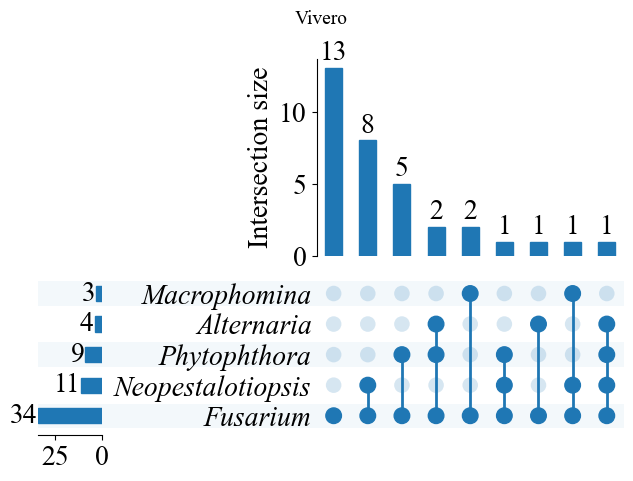

/Users/user/Library/Python/3.9/lib/python/site-packages/upsetplot/data.py:303: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.fillna(False, inplace=True)
/Users/user/Library/Python/3.9/lib/python/site-packages/upsetplot/plotting.py:795: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  styles["linewidth"].fillna(

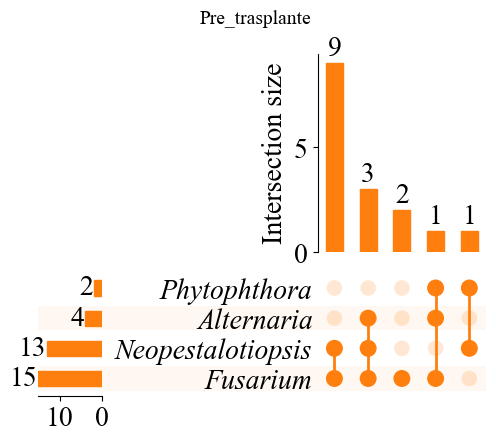

/Users/user/Library/Python/3.9/lib/python/site-packages/upsetplot/data.py:303: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df.fillna(False, inplace=True)
/Users/user/Library/Python/3.9/lib/python/site-packages/upsetplot/plotting.py:795: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  styles["linewidth"].fillna(

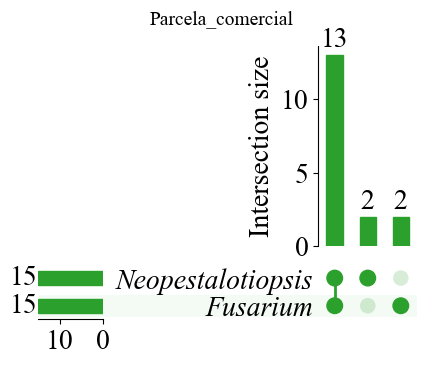

In [104]:
from upsetplot import UpSet, from_memberships
import matplotlib.pyplot as plt
from matplotlib.text import Text

fungi = [
    'Fusarium',
    'Neopestalotiopsis',
    'Phytophthora',
    'Cylindrocarpon',
    'Alternaria',
    'Macrophomina'
]

stage_colors = {
    'Vivero': '#1f77b4',
    'Pre_trasplante': '#ff7f0e',
    'Parcela_comercial': '#2ca02c'
}

for etapa in data_viveros['Etapa'].unique():

    df_stage = data_viveros[data_viveros['Etapa'] == etapa]

    memberships = [
        tuple(sorted([g for g in fungi if row[g] == 1]))
        for _, row in df_stage.iterrows()
    ]
    memberships = [m for m in memberships if len(m) > 0]

    up_data = from_memberships(memberships)

    fig = plt.figure(figsize=(8, 6))
    up = UpSet(
        up_data,
        subset_size='count',
        sort_by='cardinality',
        min_degree=1,
        show_counts=True,
        facecolor=stage_colors[etapa]
    )
    up.plot(fig=fig)

    for ax in fig.axes:
        ax.grid(False)
        ax.set_title("")

    for t in fig.findobj(Text):
        if t.get_text() in fungi:
            t.set_fontstyle('italic')

    fig.suptitle(f"{etapa}", fontsize=14)
    plt.show()


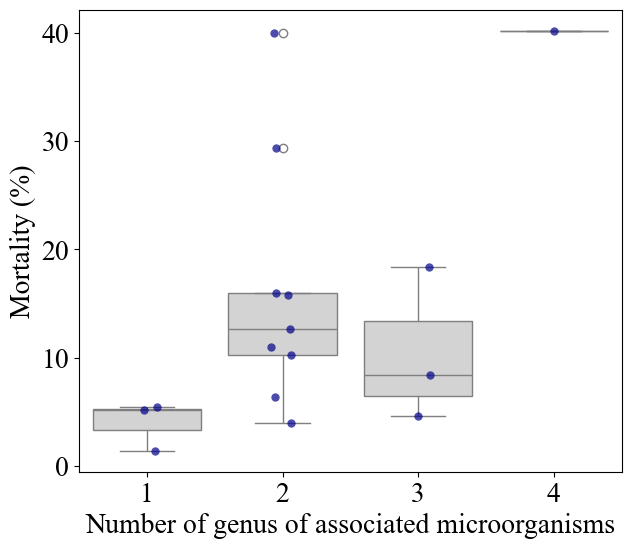

In [105]:
vivero["Fungal_load"] = vivero[fungi].sum(axis=1)

plt.figure(figsize=(7, 6))

sns.boxplot(
    data=vivero,
    x="Fungal_load",
    y="Mortality (%)",
    color="lightgrey"
)

sns.stripplot(
    data=vivero,
    x="Fungal_load",
    y="Mortality (%)",
    color="darkblue",
    size=6,
    alpha=0.7
)

plt.xlabel("Number of genus of associated microorganisms")
plt.ylabel("Mortality (%)")

plt.show()


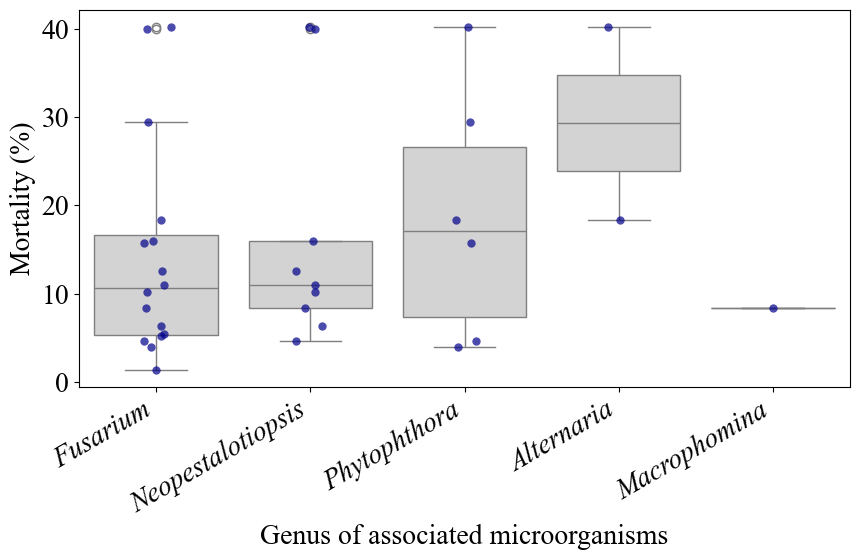

In [106]:
long_df = vivero.melt(
    id_vars=['Etiqueta', 'Mortality (%)'],
    value_vars=fungi,
    var_name='Genus',
    value_name='Presence'
)

long_df = long_df[long_df['Presence'] == 1]

plt.figure(figsize=(9, 6))

sns.boxplot(
    data=long_df,
    x='Genus',
    y='Mortality (%)',
    color='lightgrey'
)

sns.stripplot(
    data=long_df,
    x='Genus',
    y='Mortality (%)',
    color='darkblue',
    alpha=0.7,
    size=6
)

plt.xlabel("Genus of associated microorganisms")
plt.ylabel("Mortality (%)")
plt.xticks(rotation=30, ha="right")

ax = plt.gca()
for label in ax.get_xticklabels():
    label.set_fontstyle('italic')

plt.tight_layout()
plt.show()


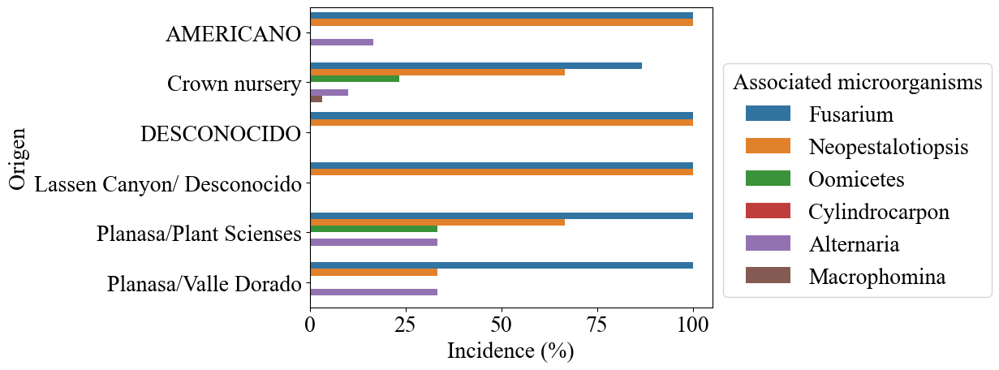

In [107]:
origen1920 = concentrado1920.groupby('Origen')[['Fusarium','Neopestalotiopsis', 'Oomicetes', 'Cylindrocarpon', 'Alternaria','Macrophomina']].mean().reset_index()
origen1920 = origen1920.melt(id_vars='Origen')
origen1920.columns = ['Origen','Disease','Incidence (%)']
origen1920['Incidence (%)'] = origen1920['Incidence (%)'] * 100
sns.barplot(data=origen1920,y='Origen',x='Incidence (%)',hue='Disease')
plt.legend(bbox_to_anchor=(1,0.85),title='Associated microorganisms')

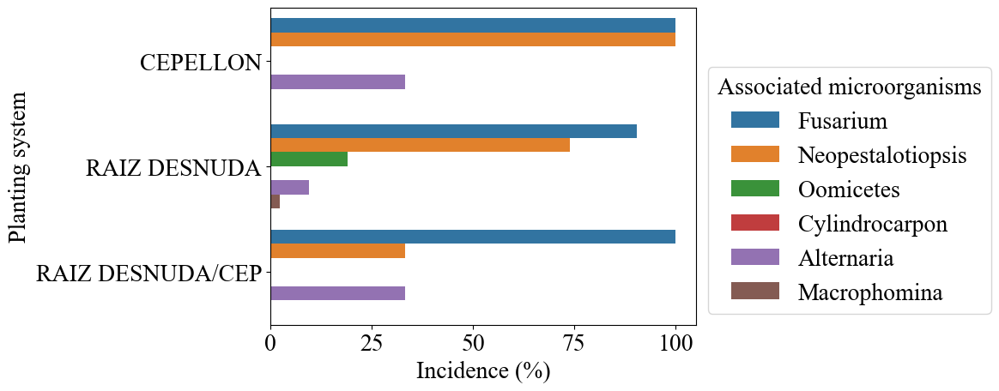

In [108]:
trat1920 = concentrado1920.groupby('Tratamiento')[['Fusarium','Neopestalotiopsis', 'Oomicetes', 'Cylindrocarpon', 'Alternaria','Macrophomina']].mean().reset_index()
trat1920 = trat1920.melt(id_vars='Tratamiento')
trat1920.columns = ['Treatment','Disease','Incidence (%)']
trat1920['Incidence (%)'] = trat1920['Incidence (%)'] * 100
sns.barplot(data=trat1920,y='Treatment',x='Incidence (%)',hue='Disease')
plt.ylabel('Planting system')
plt.legend(bbox_to_anchor=(1,0.85),title='Associated microorganisms')

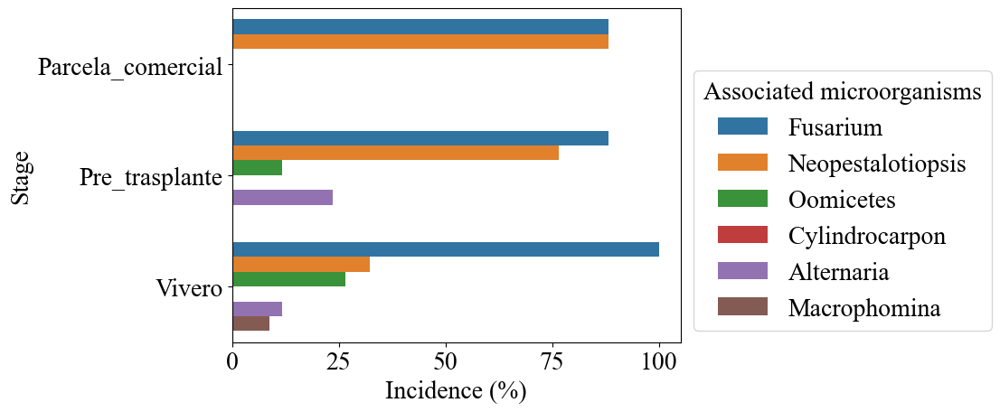

In [109]:
etap1920 = concentrado1920.groupby('Etapa')[['Fusarium','Neopestalotiopsis', 'Oomicetes', 'Cylindrocarpon', 'Alternaria','Macrophomina']].mean().reset_index()
etap1920 = etap1920.melt(id_vars='Etapa')
etap1920.columns = ['Stage','Disease','Incidence (%)']
etap1920['Incidence (%)'] = etap1920['Incidence (%)'] * 100
sns.barplot(data=etap1920,y='Stage',x='Incidence (%)',hue='Disease')
plt.legend(bbox_to_anchor=(1,0.85),title='Associated microorganisms')

In [110]:
concentrado1920.columns = ['Etiqueta', 'Origen', 'Tratamiento', 'Etapa', 'X', 'Y', 'Fusarium',
                           'Neopestalotiopsis', 'Phytophthora', 'Cylindrocarpon', 'Alternaria',
                           'Macrophomina']

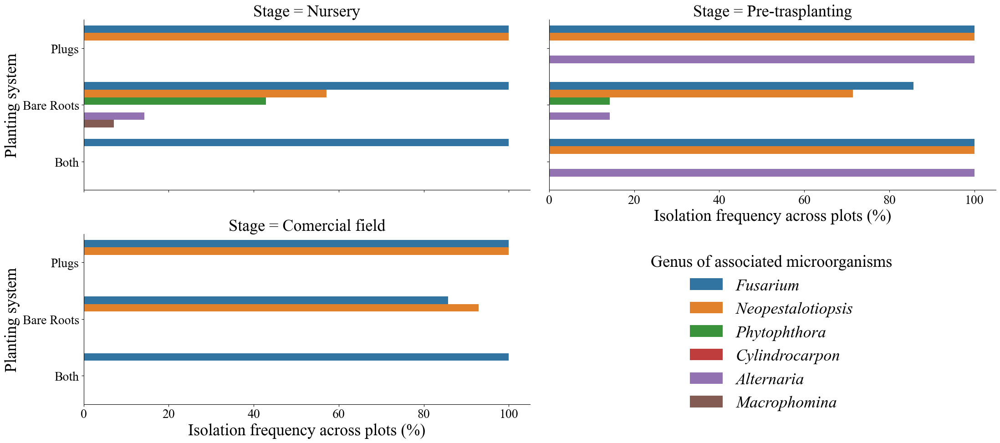

In [111]:
etap_trat1920 = concentrado1920.groupby(['Tratamiento','Etapa'])[['Fusarium','Neopestalotiopsis', 'Phytophthora', 'Cylindrocarpon', 'Alternaria','Macrophomina']].mean().reset_index()
etap_trat1920 = etap_trat1920.melt(id_vars=['Tratamiento','Etapa'])
etap_trat1920.columns = ['Planting system','Stage','Disease','Isolation frequency across plots (%)']
etap_trat1920['Stage'] = etap_trat1920['Stage'].replace({'Parcela_comercial':'Comercial field', 
                                                        'Pre_trasplante':'Pre-trasplanting', 
                                                        'Vivero':'Nursery'})
etap_trat1920['Planting system'] = etap_trat1920['Planting system'].replace({'CEPELLON':'Plugs', 
                                                                           'RAIZ DESNUDA':'Bare Roots', 
                                                                           'RAIZ DESNUDA/CEP':'Both'})
etap_trat1920['Isolation frequency across plots (%)'] = etap_trat1920['Isolation frequency across plots (%)'] * 100
etap_trat1920['Stage'] = pd.Categorical(etap_trat1920['Stage'], 
                                       categories=['Nursery', 'Pre-trasplanting', 'Comercial field'], 
                                       ordered=True)

plot = sns.catplot(data=etap_trat1920, y='Planting system', x='Isolation frequency across plots (%)', 
                   hue='Disease', col='Stage', kind='bar', col_wrap=2, height=5, aspect=2)

plot._legend.remove()
plot.add_legend(title='Genus of associated microorganisms', loc='lower center', 
                bbox_to_anchor=(0.65, 0.05), fontsize=26, title_fontsize=26)

legend = plot._legend
for text in legend.get_texts():
    text.set_fontstyle('italic')
for ax in plot.axes.flat:
    ax.set_xlabel(ax.get_xlabel(), fontsize=26)
    ax.set_ylabel(ax.get_ylabel(), fontsize=26)
    ax.set_title(ax.get_title(), fontsize=26)
legend.get_title().set_fontsize(26)
plt.show()

In [112]:
etiqueta1920 = Dcrudos_19_20.groupby(['ETIQUETA'])[['mortalidad','%SEVERIDAD(PLANTA)','SEVERIDAD EN HOJA \nPROMEDIO','%SEVERIDAD HOJA  BASADO EN ESCALA De PHOMOPSIS)']].mean().reset_index()
Dcrudos_19_20 = pd.merge(Dcrudos_19_20[['No- Parcela','ETIQUETA','COORDENADAS','Latitud','Longitud',
                       'MUNICIPIO','SUPERFICIE','Variety','CEP-R.D.','LUGAR DE ORIGEN/EMPRESA',
                       'FECHA DE TRANSPLANTE','FECHA CUBIERTACON  (PLASTICO)','DIAS transplante-CUBIERTA',
                       'FECHA DE REPLANTE ','Ingrediente pre','Ingrediente pos','Ingrediente desinfección',
                       'CONDICIONES DE PARCELA','Plagas-FUNGUS Gnat/DUPONCHELIA','CULTIVO DE ROTACION ']],etiqueta1920,on='ETIQUETA')
Dcrudos_19_20 = Dcrudos_19_20.drop_duplicates()
Dcrudos_19_20.head()

,No- Parcela,ETIQUETA,COORDENADAS,Latitud,Longitud,MUNICIPIO,SUPERFICIE,Variety,CEP-R.D.,LUGAR DE ORIGEN/EMPRESA,...,Ingrediente pre,Ingrediente pos,Ingrediente desinfección,CONDICIONES DE PARCELA,Plagas-FUNGUS Gnat/DUPONCHELIA,CULTIVO DE ROTACION,mortalidad,%SEVERIDAD(PLANTA),SEVERIDAD EN HOJA \nPROMEDIO,%SEVERIDAD HOJA BASADO EN ESCALA De PHOMOPSIS)
0,1.0,1T,"19°54'19.22''N, \n102°10'19.11''w",NaN,NaN,TANGANCICUARO,2 HA,Albion,R.D.,CHILE,...,NaN,NaN,NaN,INUNDADO,FUNGUS,MAIZ,2.0,57.6,3.0,50.5
5,2.0,2T,19°53''59.2 ''N\n102°09'07'',NaN,NaN,TANGANCICUARO,2.5 HA,Sayulita,CEPELLON,PLANASA,...,Metalaxil-M,Tiofanato-metilo,NaN,NaN,NO,NO,0.0,19.2,1.4,20.1
10,3.0,3T,19°53'45.49'' N\n102°11'15.49''W,NaN,NaN,TANGANCICUARO,ND,Sayulita,CEPELLON,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.2,11.2,0.6,6.0
15,4.0,4T,19°52'42.11'' N\n102°11'50.68'' W,NaN,NaN,TANGANCICUARO,4HA,Frontera,R.D.,JACONA,...,Azoxystrobin,Tiofanato-metilo and Captan,NaN,RESIDUOS DE COSECHA,NO,NO,14.4,68.8,3.2,54.4
20,5.0,5T,19°52'15.64''N\n102°09'58.21''W,NaN,NaN,CHILCHOTA,2 HA,Albion,R.D.,CHILE,...,Metalaxil-M and Fluoxastrobin,Captan,Isotiocianato de metilo,NaN,FUNGUS,NO,30.2,68.8,3.2,54.5


In [113]:
Dcrudos_19_20['CEP-R.D.'] = Dcrudos_19_20['CEP-R.D.'].replace({'R.D.\nCEPELLON':'R.D. CEPELLON', 'R.D':'R.D.',
                                                               'CEPELLON\nR.D.\nR.D.':'R.D. CEPELLON', 'CEPELLON\nR.D':'R.D. CEPELLON', 
                                                               'CEPEPELLON':'CEPELLON','R.D.\nCEPELLON\nR.D\nR.D':'R.D. CEPELLON', 
                                                               'CEPELLON\nR.D.\nCEPELLON':'R.D. CEPELLON'})

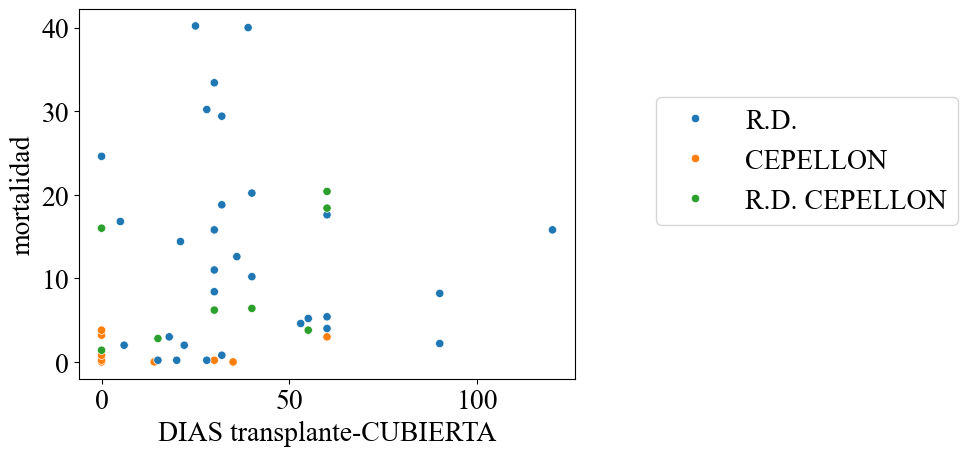

In [114]:
sns.scatterplot(data=Dcrudos_19_20,x='DIAS transplante-CUBIERTA',y='mortalidad',hue='CEP-R.D.')
plt.legend(bbox_to_anchor=(1.8,0.8))

<Axes: xlabel='mortalidad', ylabel='Ingrediente pre'>

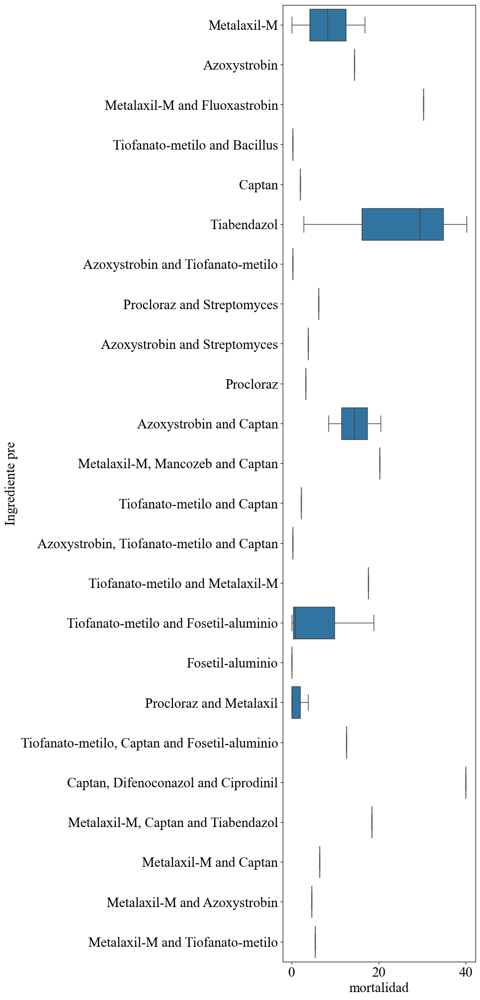

In [115]:
plt.figure(figsize=(5,25))
sns.boxplot(data=Dcrudos_19_20,y='Ingrediente pre',x='mortalidad')

In [116]:
Dcrudos_19_20['CEP-R.D.'].unique()

array(['R.D.', 'CEPELLON', 'R.D. CEPELLON'], dtype=object)

In [117]:
Dcrudos_19_20.columns

Index(['No- Parcela', 'ETIQUETA', 'COORDENADAS', 'Latitud', 'Longitud',
       'MUNICIPIO', 'SUPERFICIE', 'Variety', 'CEP-R.D.',
       'LUGAR DE ORIGEN/EMPRESA', 'FECHA DE TRANSPLANTE',
       'FECHA CUBIERTACON  (PLASTICO)', 'DIAS transplante-CUBIERTA',
       'FECHA DE REPLANTE ', 'Ingrediente pre', 'Ingrediente pos',
       'Ingrediente desinfección', 'CONDICIONES DE PARCELA',
       'Plagas-FUNGUS Gnat/DUPONCHELIA', 'CULTIVO DE ROTACION ', 'mortalidad',
       '%SEVERIDAD(PLANTA)', 'SEVERIDAD EN HOJA \nPROMEDIO',
       '%SEVERIDAD HOJA  BASADO EN ESCALA De PHOMOPSIS)'],
      dtype='object')

/var/folders/g1/6fhcms6n0px1d6b5mxmlwwcw0000gn/T/ipykernel_57832/1620961901.py:12: UserWarning: The palette list has more values (9) than needed (2), which may not be intended.
  sns.boxplot(data=data1,x='Value',y='Planting system',hue='Variable',hue_order=hue_order,palette=deep[1:] )


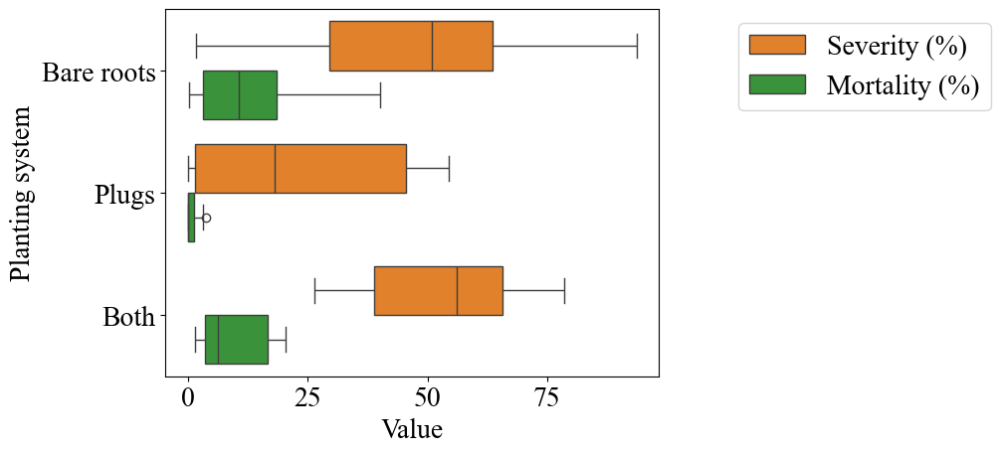

In [118]:
data1 = Dcrudos_19_20.copy()
data1['CEP-R.D.'] = Dcrudos_19_20['CEP-R.D.'].replace({'R.D.':'Bare roots', 'CEPELLON':'Plugs', 'R.D. CEPELLON':'Both'})

data1 = data1[['CEP-R.D.','mortalidad','%SEVERIDAD(PLANTA)']]
data1.columns = ['CEP-R.D.','Mortality (%)','Severity (%)']
data1 = data1.melt(id_vars='CEP-R.D.')
data1.columns = ['Planting system','Variable','Value']

hue_order = ['Severity (%)', 'Mortality (%)']
deep = sns.color_palette("tab10")

sns.boxplot(data=data1,x='Value',y='Planting system',hue='Variable',hue_order=hue_order,palette=deep[1:] )

plt.ylabel('Planting system')
plt.xlabel('Value')
plt.legend(bbox_to_anchor=(1.7, 1))
plt.show()

2021-2022

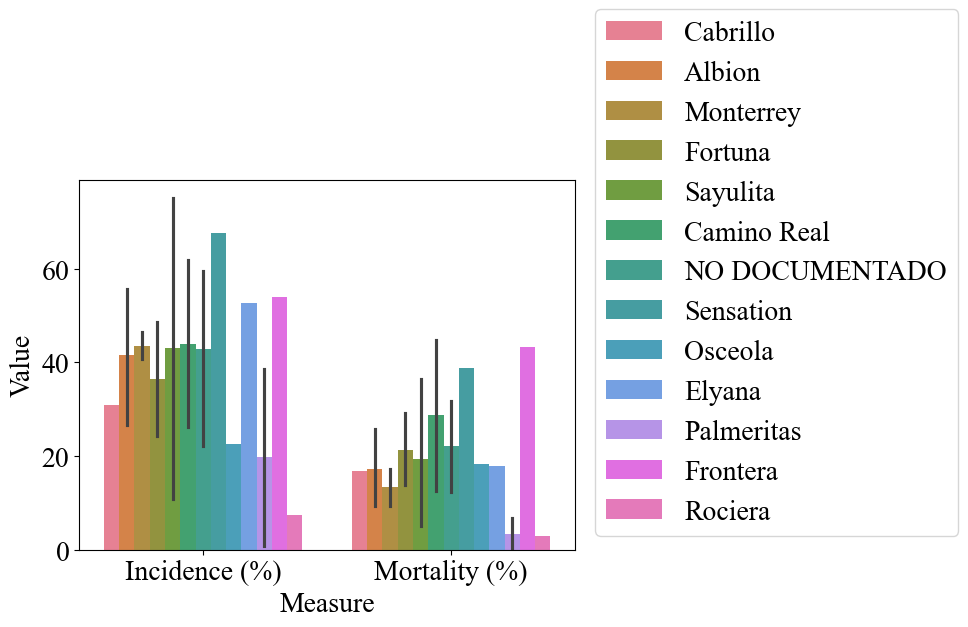

In [119]:
INC_MOR2122 = Data21_22[['Variedad','INCIDENCIA %','MORTALIDAD% ']]
INC_MOR2122.columns = ['Variety','Incidence (%)','Mortality (%)']
INC_MOR2122 = INC_MOR2122.melt(id_vars='Variety')
INC_MOR2122.columns = ['Variety','Measure','Value']
sns.barplot(data=INC_MOR2122, x='Measure', y='Value',hue='Variety')
plt.legend(bbox_to_anchor=(1.8,1.5))

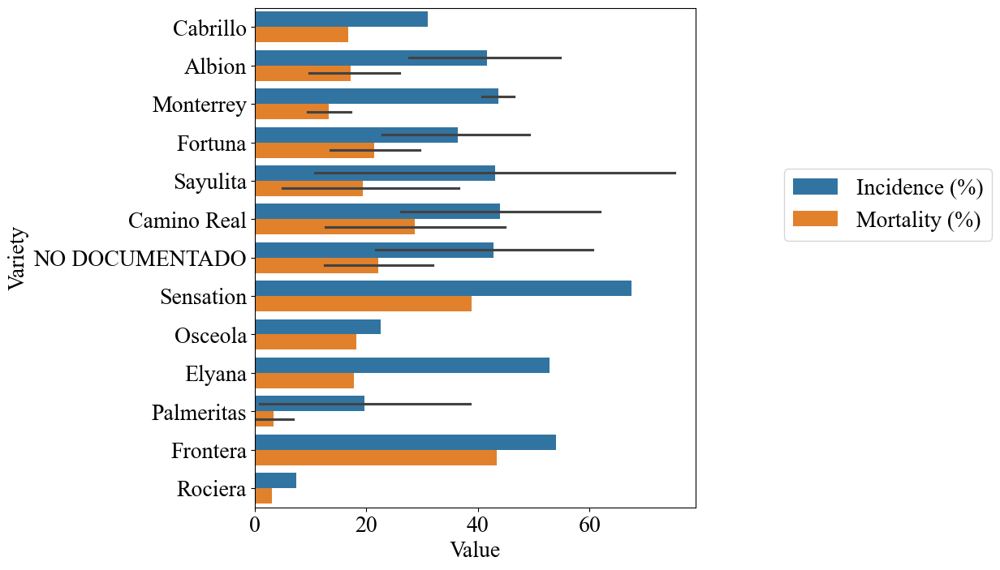

In [120]:
plt.figure(figsize=(7,8))
sns.barplot(data=INC_MOR2122, hue='Measure', x='Value',y='Variety')
plt.legend(bbox_to_anchor=(1.7,0.7))

In [121]:
INC_MOR_MUN2122 = Data21_22[['Zonas muestreadas','Variedad','INCIDENCIA %','MORTALIDAD% ']]
INC_MOR_MUN2122.columns = ['Municipality','Variety','Incidence (%)','Mortality (%)']
INC_MOR_MUN2122 = INC_MOR_MUN2122.melt(id_vars=['Municipality','Variety'])
INC_MOR_MUN2122.columns = ['Municipality','Variety','Measure','Value']

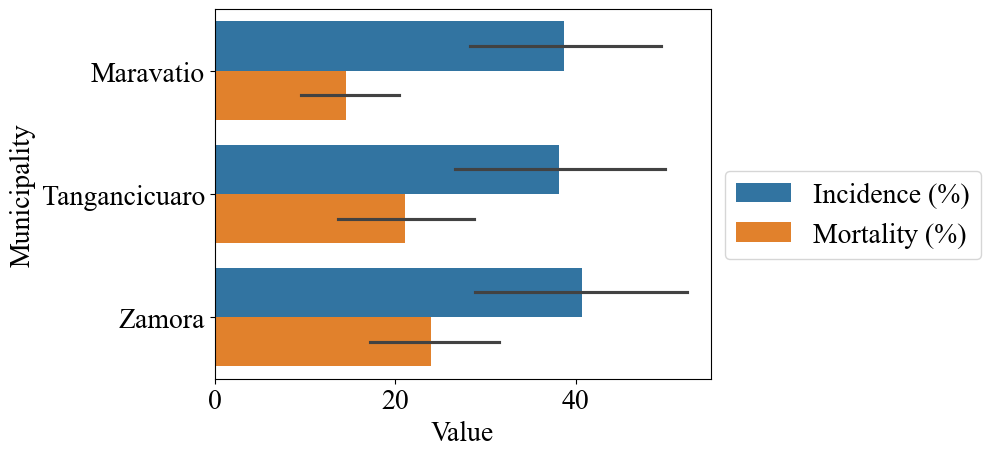

In [122]:
sns.barplot(data=INC_MOR_MUN2122, x='Value',y='Municipality',hue='Measure')
plt.legend(bbox_to_anchor=(1,0.6))

<Figure size 700x800 with 0 Axes>

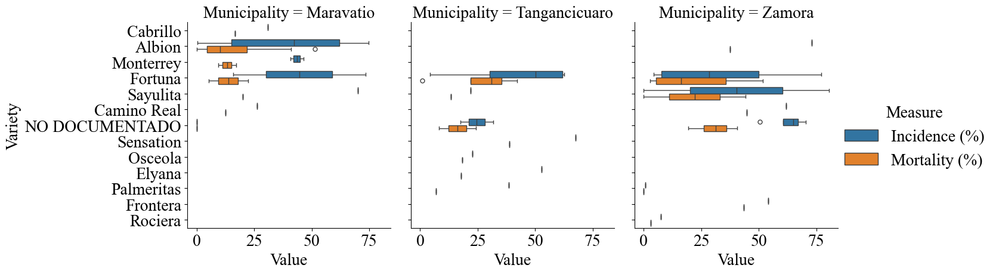

In [123]:
plt.figure(figsize=(7,8))
sns.catplot(data=INC_MOR_MUN2122, hue='Measure', x='Value',y='Variety',col='Municipality',kind='box',col_wrap=3)

2022-2023

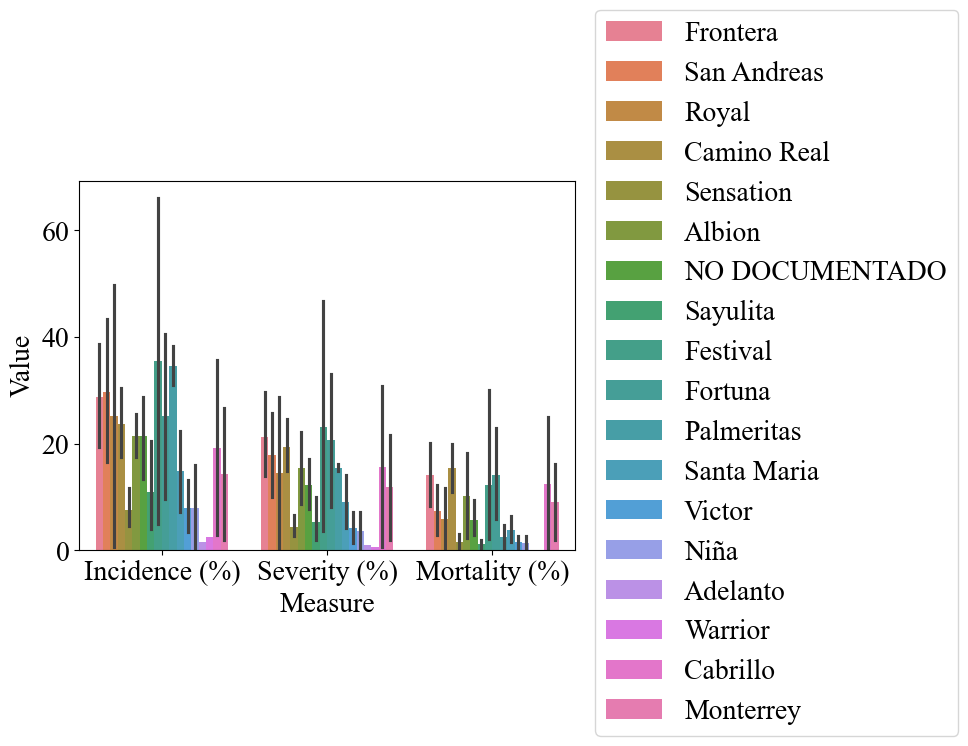

In [124]:
INC_MOR2223 = Data22_23[['Variedad','INCIDENCIA %', 'SEVERIDAD %', 'MORTALIDAD% ']]
INC_MOR2223.columns = ['Variety','Incidence (%)','Severity (%)','Mortality (%)']
INC_MOR2223 = INC_MOR2223.melt(id_vars='Variety')
INC_MOR2223.columns = ['Variety','Measure','Value']
sns.barplot(data=INC_MOR2223, x='Measure', y='Value',hue='Variety')
plt.legend(bbox_to_anchor=(1.8,1.5))

In [125]:
INC_MOR2223['Variety'] = INC_MOR2223['Variety'].replace({'NO DOCUMENTADO':'Others'})

In [126]:
INC_MOR_MUN2223 = Data22_23[['Municipio','Variedad','INCIDENCIA %', 'SEVERIDAD %', 'MORTALIDAD% ']]
INC_MOR_MUN2223.columns = ['Municipality','Variety','Incidence (%)','Severity (%)','Mortality (%)']
INC_MOR_MUN2223 = INC_MOR_MUN2223.melt(id_vars=['Municipality','Variety'])
INC_MOR_MUN2223.columns = ['Municipality','Variety','Measure','Value']

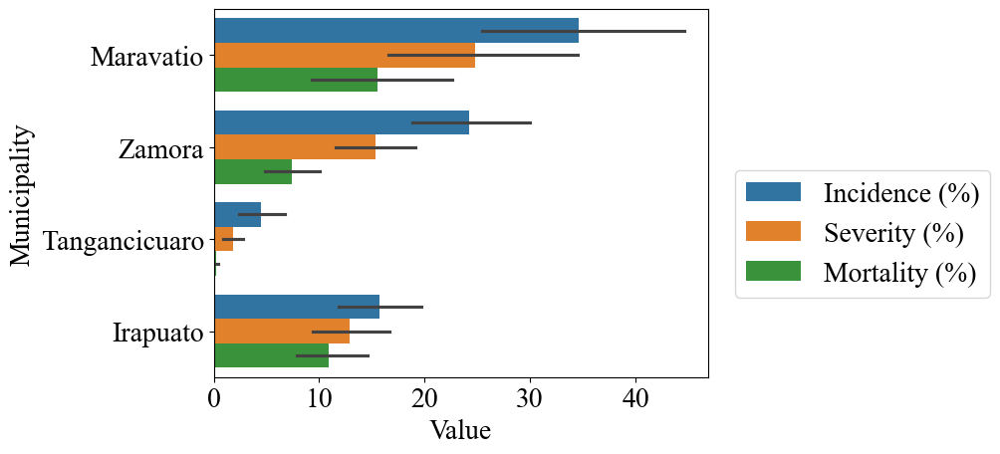

In [127]:
sns.barplot(data=INC_MOR_MUN2223, x='Value',y='Municipality',hue='Measure')
plt.legend(bbox_to_anchor=(1.6,0.6))

<Figure size 1500x3000 with 0 Axes>

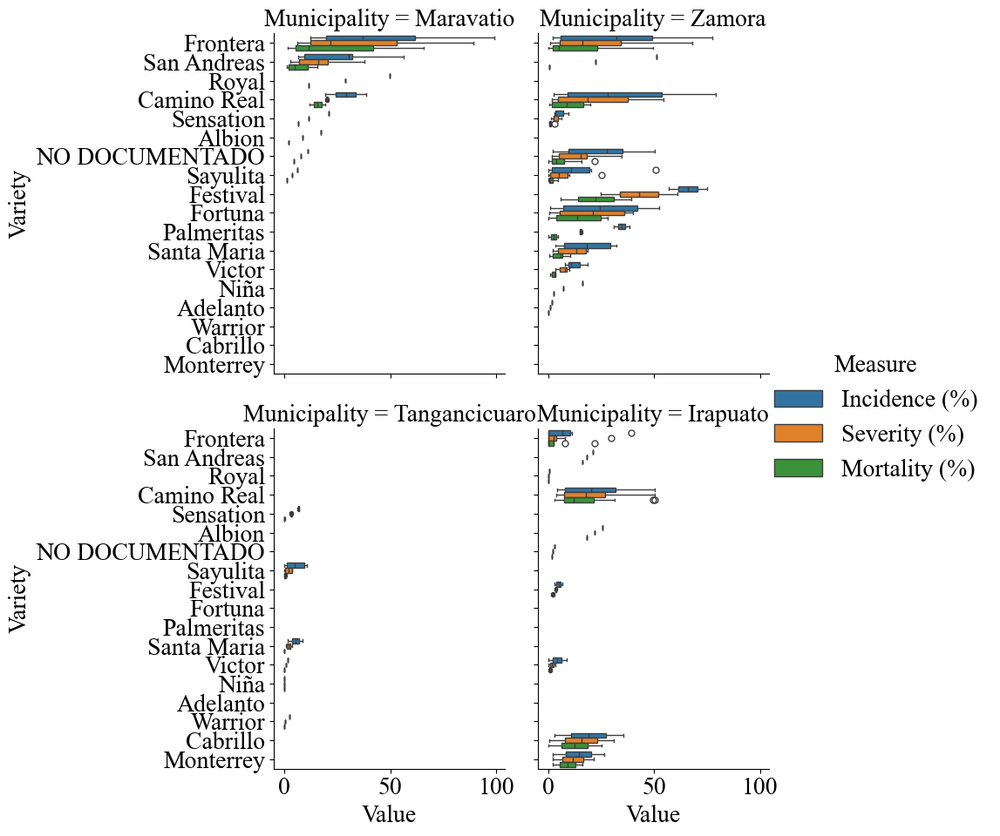

In [128]:
plt.figure(figsize=(15,30))
sns.catplot(data=INC_MOR_MUN2223, hue='Measure', x='Value',y='Variety',col='Municipality',kind='box',col_wrap=2)

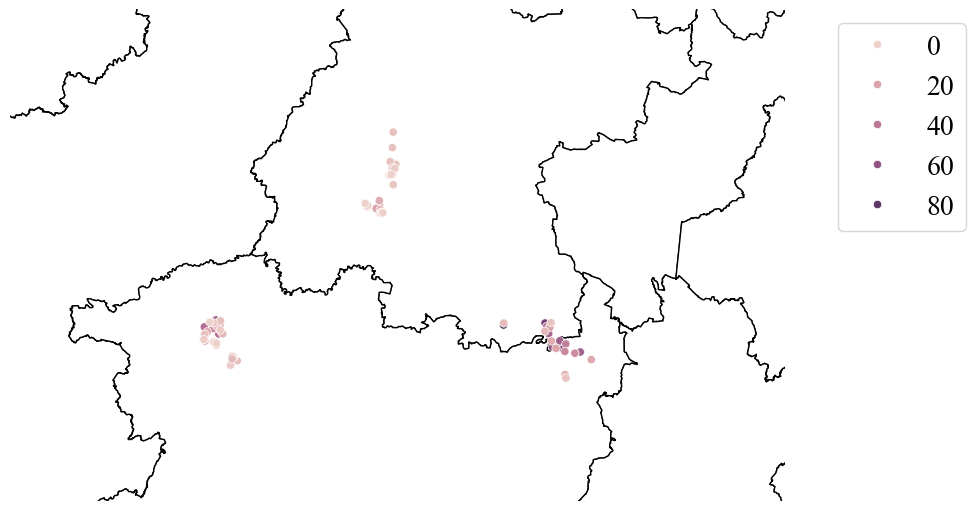

In [47]:
mexico = gpd.read_file('./estados_mexico/dest_2010gw.shp')
fig, ax = plt.subplots(figsize=(10, 8))
mexico.plot(ax=ax, facecolor='white', edgecolor='black', zorder=0)
sns.scatterplot(data=Data22_23, x='W', y='N', hue='INCIDENCIA %', ax=ax, zorder=1) #'INCIDENCIA %', 'SEVERIDAD %', 'MORTALIDAD% '
x_min, x_max = Data22_23['W'].min(), Data22_23['W'].max()
y_min, y_max = Data22_23['N'].min(), Data22_23['N'].max()
margen_x = (x_max - x_min) * 0.5
margen_y = (y_max - y_min) * 0.5
ax.set_xlim(x_min - margen_x, x_max + margen_x)
ax.set_ylim(y_min - margen_y, y_max + margen_y)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_axis_off()
plt.show()

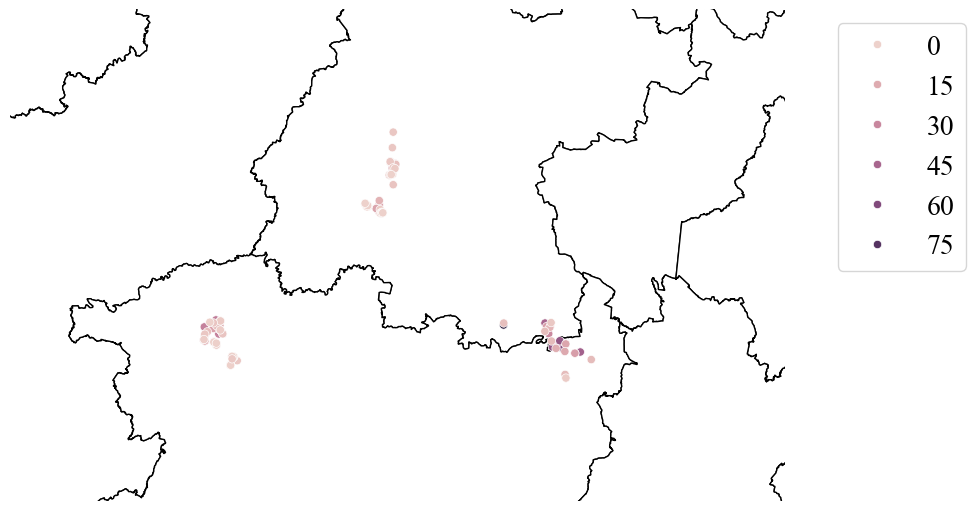

In [48]:
fig, ax = plt.subplots(figsize=(10, 8))
mexico.plot(ax=ax, facecolor='white', edgecolor='black', zorder=0)
sns.scatterplot(data=Data22_23, x='W', y='N', hue='SEVERIDAD %', ax=ax, zorder=1) #'INCIDENCIA %', 'SEVERIDAD %', 'MORTALIDAD% '
x_min, x_max = Data22_23['W'].min(), Data22_23['W'].max()
y_min, y_max = Data22_23['N'].min(), Data22_23['N'].max()
margen_x = (x_max - x_min) * 0.5
margen_y = (y_max - y_min) * 0.5
ax.set_xlim(x_min - margen_x, x_max + margen_x)
ax.set_ylim(y_min - margen_y, y_max + margen_y)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_axis_off()
plt.show()

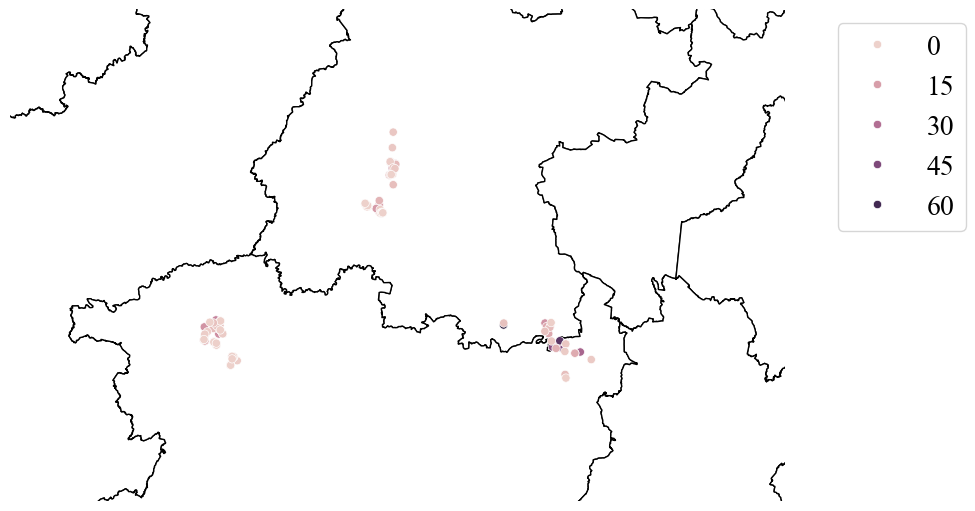

In [49]:
fig, ax = plt.subplots(figsize=(10, 8))
mexico.plot(ax=ax, facecolor='white', edgecolor='black', zorder=0)
sns.scatterplot(data=Data22_23, x='W', y='N', hue='MORTALIDAD% ', ax=ax, zorder=1) #'INCIDENCIA %', 'SEVERIDAD %', 'MORTALIDAD% '
x_min, x_max = Data22_23['W'].min(), Data22_23['W'].max()
y_min, y_max = Data22_23['N'].min(), Data22_23['N'].max()
margen_x = (x_max - x_min) * 0.5
margen_y = (y_max - y_min) * 0.5
ax.set_xlim(x_min - margen_x, x_max + margen_x)
ax.set_ylim(y_min - margen_y, y_max + margen_y)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_axis_off()
plt.show()

2023

In [129]:
aislamientos23 = aislamientos23.melt(['Num. Parcela', 'Nom. Parcela', 'Variedad', 'Organo'])
aislamientos23.columns = ['Num. Parcela', 'Nom. Parcela', 'Variety', 'Tissue affected','Disease','Count']
aislamientos23.head()

,Num. Parcela,Nom. Parcela,Variety,Tissue affected,Disease,Count
0,1.1,EL PEJO 1,SENSATION,CORONA,Neopestalotiopsis,5
1,1.1,EL PEJO 1,SENSATION,RAIZ,Neopestalotiopsis,3
2,1.2,EL PEJO 2,VICTOR,CORONA,Neopestalotiopsis,0
3,1.2,EL PEJO 2,VICTOR,RAIZ,Neopestalotiopsis,0
4,1.3,EL PEJO 3,SANTA MARIA,CORONA,Neopestalotiopsis,0


In [130]:
aislamientos23

,Num. Parcela,Nom. Parcela,Variety,Tissue affected,Disease,Count
0,1.1,EL PEJO 1,SENSATION,CORONA,Neopestalotiopsis,5
1,1.1,EL PEJO 1,SENSATION,RAIZ,Neopestalotiopsis,3
2,1.2,EL PEJO 2,VICTOR,CORONA,Neopestalotiopsis,0
3,1.2,EL PEJO 2,VICTOR,RAIZ,Neopestalotiopsis,0
4,1.3,EL PEJO 3,SANTA MARIA,CORONA,Neopestalotiopsis,0
...,...,...,...,...,...,...
3943,108,MOLINO LOS AGUACATES,CAMINO REAL,RAIZ,FALTANTES,0
3944,109,EL SILO,CAMINO REAL,CORONA,FALTANTES,0
3945,109,EL SILO,CAMINO REAL,RAIZ,FALTANTES,0
3946,110,ALDAMA,CAMINO REAL,CORONA,FALTANTES,0


/var/folders/g1/6fhcms6n0px1d6b5mxmlwwcw0000gn/T/ipykernel_57832/1023020641.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  aislamientos23['Tissue affected'] = aislamientos23['Tissue affected'].replace({'RAIZ':'Root',


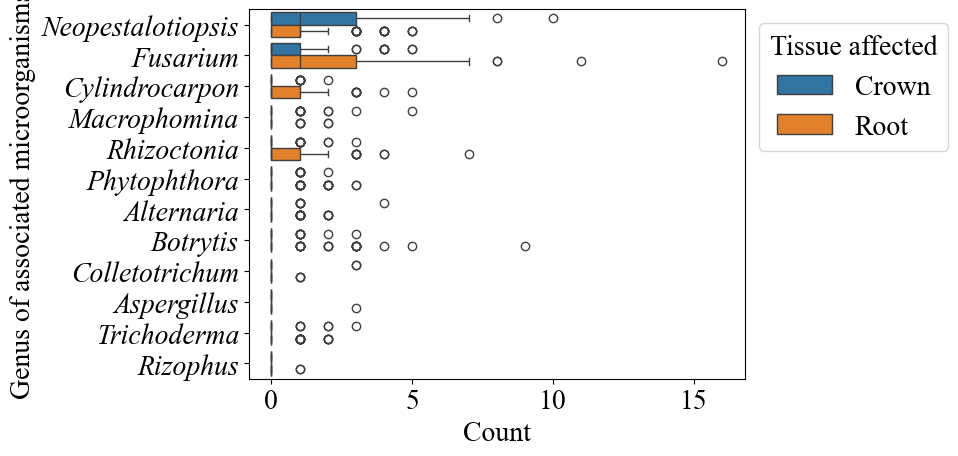

In [131]:
aislamientos23 = aislamientos23[~aislamientos23['Disease'].isin(['NO ID','FALTANTES'])]
aislamientos23['Tissue affected'] = aislamientos23['Tissue affected'].replace({'RAIZ':'Root',
                                                                               'CORONA':'Crown'})
sns.boxplot(data=aislamientos23,x='Count',y='Disease',hue='Tissue affected')
plt.ylabel('Genus of associated microorganisms')
ax = plt.gca()
for label in ax.get_yticklabels():
    label.set_fontstyle('italic')
plt.legend(bbox_to_anchor=(1,1),title='Tissue affected')

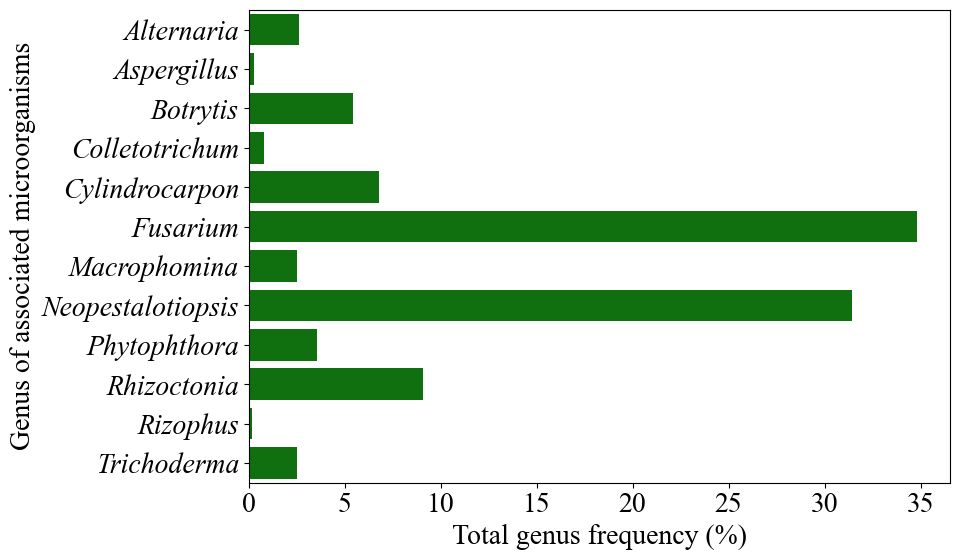

In [132]:
aislamientos23 = aislamientos23[~aislamientos23['Disease'].isin(['NO ID','FALTANTES'])]
aislamientos23['Tissue affected'] = aislamientos23['Tissue affected'].replace({'RAIZ':'Root','CORONA':'Crown'})
total_disease = aislamientos23.groupby('Disease')['Count'].sum().reset_index()
total = total_disease['Count'].sum()
total_disease['Proportion'] = total_disease['Count'] / total * 100
total_disease = total_disease.rename(columns={'Disease':'Genus of associated microorganisms'})
plt.figure(figsize=(10,6))
sns.barplot(data=total_disease, x='Proportion', y='Genus of associated microorganisms', color='Green')
plt.xlabel('Total genus frequency (%)')
plt.ylabel('Genus of associated microorganisms')
ax = plt.gca()
for label in ax.get_yticklabels():
    label.set_fontstyle('italic')

plt.tight_layout()
plt.show()

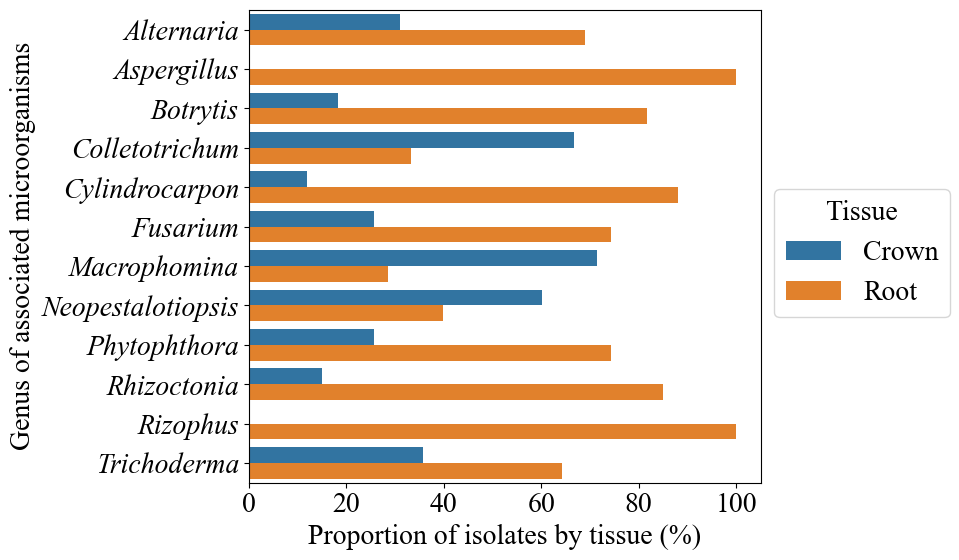

In [133]:
grouped = aislamientos23.groupby(['Disease','Tissue affected'])['Count'].sum().reset_index()
grouped['Total'] = grouped.groupby('Disease')['Count'].transform('sum')
grouped['Proportion'] = grouped['Count'] / grouped['Total'] * 100
grouped = grouped.rename(columns={'Disease':'Genus of associated microorganisms'})
plt.figure(figsize=(10,6))
sns.barplot(data=grouped, x='Proportion', y='Genus of associated microorganisms', hue='Tissue affected')
plt.xlabel('Proportion of isolates by tissue (%)')
plt.ylabel('Genus of associated microorganisms')
ax = plt.gca()
for label in ax.get_yticklabels():
    label.set_fontstyle('italic')
plt.legend(title='Tissue', bbox_to_anchor=(1,0.65))
plt.tight_layout()
plt.show()

In [134]:
aislamientos23.columns

Index(['Num. Parcela', 'Nom. Parcela', 'Variety', 'Tissue affected', 'Disease',
       'Count'],
      dtype='object')

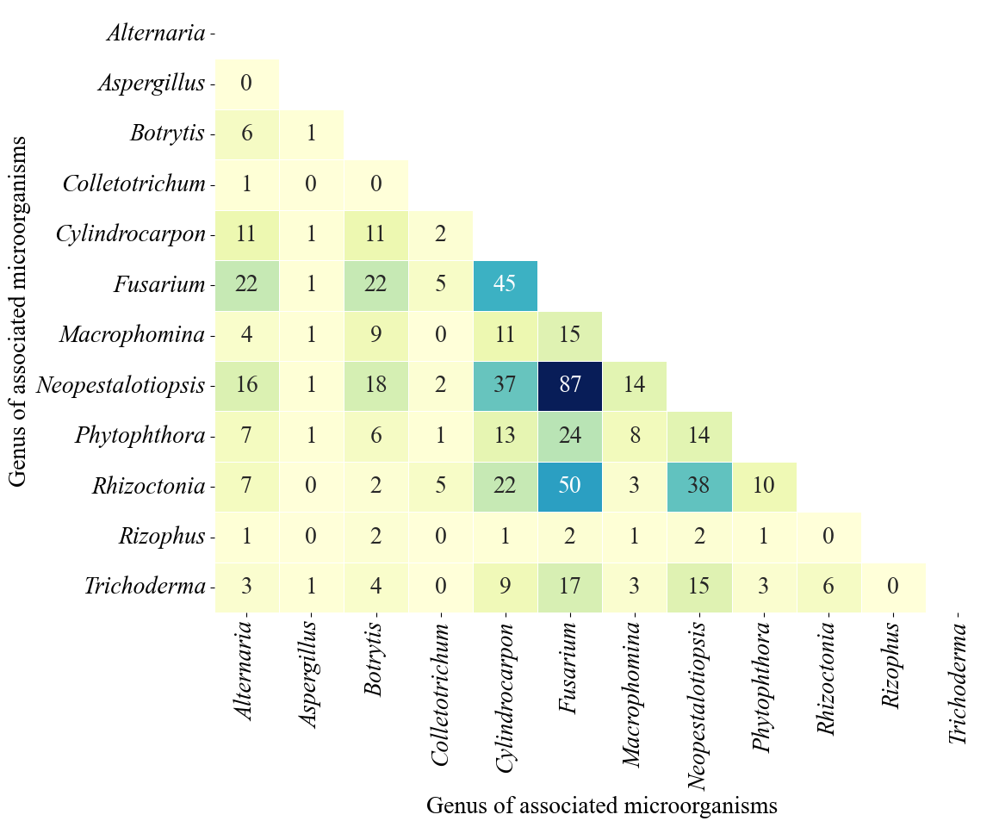

In [503]:
from itertools import combinations
from collections import Counter

enfermedades_por_parcela = (
    aislamientos23[aislamientos23['Count']!=0]
    .groupby(['Num. Parcela'])['Disease']
    .unique()
)
combinaciones = []
for enfermedades in enfermedades_por_parcela:
    enfermedades = sorted(set(enfermedades)) 
    if len(enfermedades) > 1:
        combs = combinations(enfermedades, 2)
        combinaciones.extend(combs)
conteo_combinaciones = Counter(combinaciones)
enfermedades = sorted(set(aislamientos23['Disease']))
matriz = pd.DataFrame(0, index=enfermedades, columns=enfermedades)

for (e1, e2), count in conteo_combinaciones.items():
    matriz.loc[e1, e2] = count
    matriz.loc[e2, e1] = count  
plt.figure(figsize=(12, 10))
ax = sns.heatmap(matriz, annot=True, cmap="YlGnBu", fmt="d", linewidths=.5,cbar=False, mask=np.triu(np.ones_like(matriz, dtype=bool)))
for label in ax.get_xticklabels():
    label.set_fontstyle('italic')
for label in ax.get_yticklabels():
    label.set_fontstyle('italic')
plt.xlabel("Genus of associated microorganisms")
plt.ylabel("Genus of associated microorganisms")
plt.tight_layout()
plt.show()

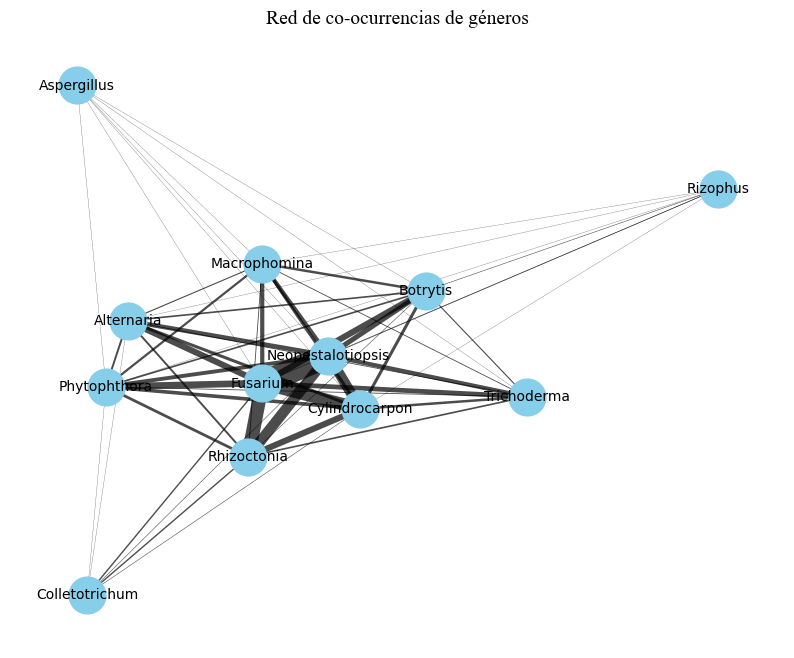

In [504]:
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations
from collections import Counter

# agrupamos géneros por muestra
enfermedades_por_parcela = (
    aislamientos23[aislamientos23['Count'] != 0]
    .groupby(['Num. Parcela'])['Disease']
    .unique()
)

# obtenemos todas las combinaciones posibles (pares)
combinaciones = []
for enfermedades in enfermedades_por_parcela:
    enfermedades = sorted(set(enfermedades))
    if len(enfermedades) > 1:
        combs = combinations(enfermedades, 2)
        combinaciones.extend(combs)

conteo_combinaciones = Counter(combinaciones)

G = nx.Graph()
for (e1, e2), count in conteo_combinaciones.items():
    G.add_edge(e1, e2, weight=count)

plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, k=0.5, seed=42) 
weights = [G[u][v]['weight'] for u,v in G.edges]

nx.draw_networkx_nodes(G, pos, node_size=700, node_color="skyblue")
nx.draw_networkx_edges(G, pos, width=[w*0.2 for w in weights], alpha=0.7)
nx.draw_networkx_labels(G, pos, font_size=10)

plt.title("Red de co-ocurrencias de géneros", fontsize=14)
plt.axis("off")
plt.show()


In [505]:
pip install python-louvain

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [506]:
aislamientos23['Disease'].unique()

array(['Neopestalotiopsis', 'Fusarium', 'Cylindrocarpon', 'Macrophomina',
       'Rhizoctonia', 'Phytophthora', 'Alternaria', 'Botrytis',
       'Colletotrichum', 'Aspergillus', 'Trichoderma', 'Rizophus'],
      dtype=object)

In [507]:
data2 = aislamientos23.loc[aislamientos23['Disease'].isin(['Neopestalotiopsis', 'Fusarium', 'Cylindrocarpon', 'Macrophomina','Rhizoctonia'])]

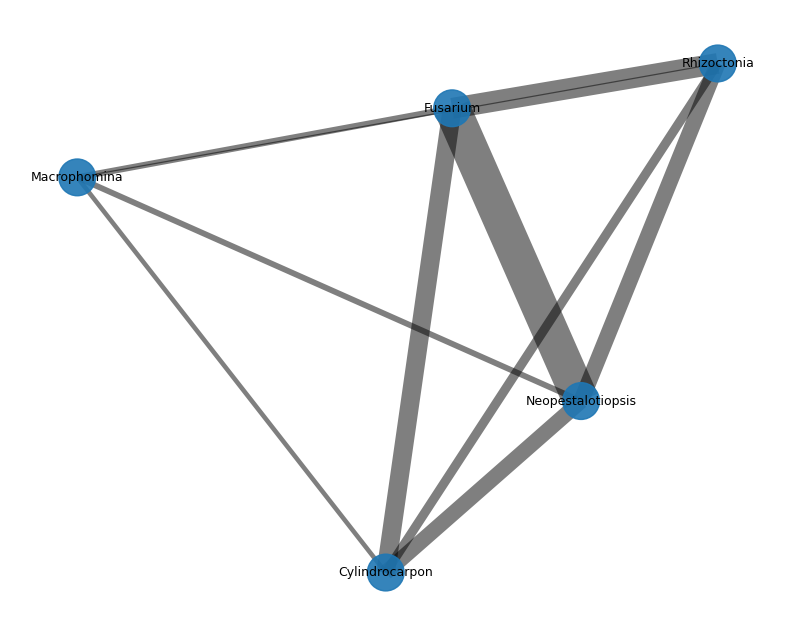

In [508]:
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations
from collections import Counter
import community as community_louvain  

enfermedades_por_parcela = (
    data2[data2['Count'] != 0]
    .groupby(['Num. Parcela'])['Disease']
    .unique()
)

combinaciones = []
for enfermedades in enfermedades_por_parcela:
    enfermedades = sorted(set(enfermedades))
    if len(enfermedades) > 1:
        combs = combinations(enfermedades, 2)
        combinaciones.extend(combs)

conteo_combinaciones = Counter(combinaciones)

G = nx.Graph()
for (e1, e2), count in conteo_combinaciones.items():
    G.add_edge(e1, e2, weight=count)

partition = community_louvain.best_partition(G, weight="weight")

comunidades = set(partition.values())
color_map = {comunidad: plt.cm.tab10.colors[i % 10] for i, comunidad in enumerate(comunidades)}
node_colors = [color_map[partition[n]] for n in G.nodes()]

plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, k=3, seed=42)
weights = [G[u][v]['weight'] for u,v in G.edges]

nx.draw_networkx_nodes(G, pos, node_size=700, node_color=node_colors, alpha=0.9)
nx.draw_networkx_edges(G, pos, width=[w*0.3 for w in weights], alpha=0.5)
nx.draw_networkx_labels(G, pos, font_size=9)

plt.axis("off")
plt.show()


In [509]:
aislamientos23

,Num. Parcela,Nom. Parcela,Variety,Tissue affected,Disease,Count
0,1.1,EL PEJO 1,SENSATION,Crown,Neopestalotiopsis,5
1,1.1,EL PEJO 1,SENSATION,Root,Neopestalotiopsis,3
2,1.2,EL PEJO 2,VICTOR,Crown,Neopestalotiopsis,0
3,1.2,EL PEJO 2,VICTOR,Root,Neopestalotiopsis,0
4,1.3,EL PEJO 3,SANTA MARIA,Crown,Neopestalotiopsis,0
...,...,...,...,...,...,...
3661,108,MOLINO LOS AGUACATES,CAMINO REAL,Root,Rizophus,0
3662,109,EL SILO,CAMINO REAL,Crown,Rizophus,0
3663,109,EL SILO,CAMINO REAL,Root,Rizophus,0
3664,110,ALDAMA,CAMINO REAL,Crown,Rizophus,0


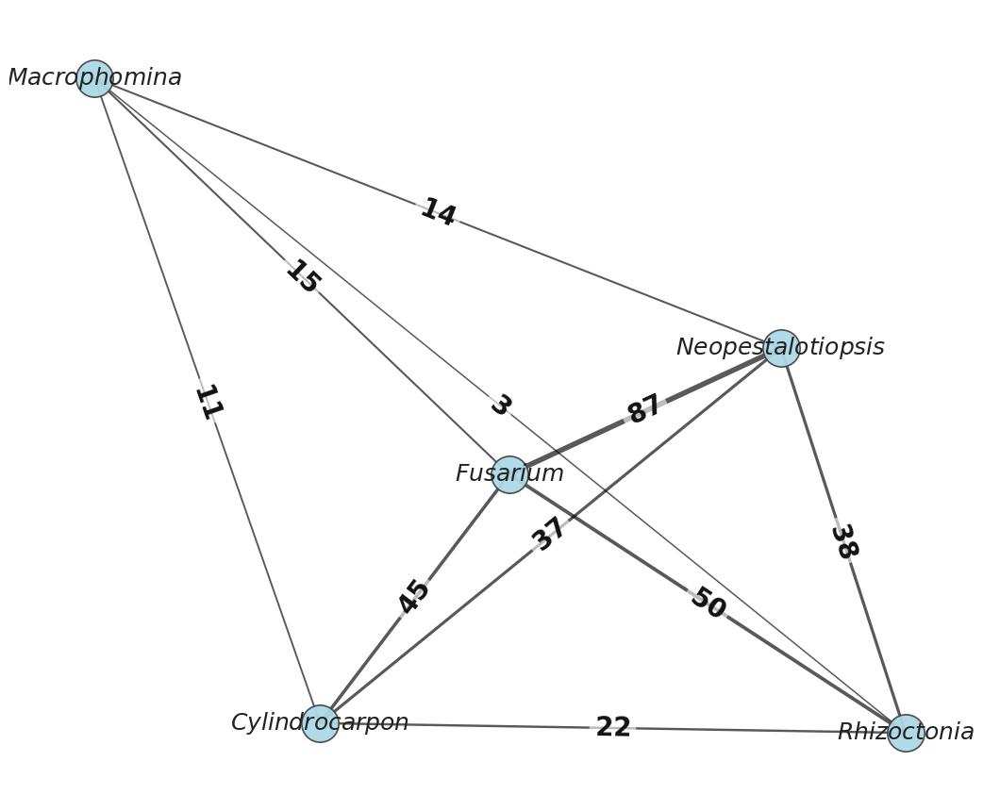

In [510]:
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations
from collections import Counter

# --- Construcción del grafo ---
enfermedades_por_parcela = (
    data2[data2['Count'] != 0]
    .groupby(['Num. Parcela'])['Disease']
    .unique()
)

combinaciones = []
for enfermedades in enfermedades_por_parcela:
    enfermedades = sorted(set(enfermedades))
    if len(enfermedades) > 1:
        combs = combinations(enfermedades, 2)
        combinaciones.extend(combs)

conteo_combinaciones = Counter(combinaciones)

G = nx.Graph()
for (e1, e2), count in conteo_combinaciones.items():
    G.add_edge(e1, e2, weight=count)

# --- Layout y pesos ---
plt.figure(figsize=(11, 9))
pos = nx.spring_layout(G, k=0.8, seed=42)

weights = [G[u][v]['weight'] for u, v in G.edges()]
max_w = max(weights) if weights else 1
edge_widths = [1.0 + 3.0*(w/max_w) for w in weights]

# --- Dibujar nodos (todos azul claro) ---
nx.draw_networkx_nodes(
    G, pos,
    node_size=800,
    node_color="lightblue",
    edgecolors="#444444", linewidths=1.2,
    alpha=0.95
)

nx.draw_networkx_edges(
    G, pos,
    width=edge_widths,
    alpha=0.65
)

# --- Etiquetas de nodos en itálica ---
labels = {n: f"$\\it{{{n}}}$" for n in G.nodes()}
nx.draw_networkx_labels(
    G, pos,
    labels=labels,
    font_size=18,
    font_color="#222222"
)

# --- Etiquetas de aristas (en negrilla y más grandes) ---
edge_labels = {k: f"$\\bf{{{v}}}$" for k, v in nx.get_edge_attributes(G, 'weight').items()}
nx.draw_networkx_edge_labels(
    G, pos,
    edge_labels=edge_labels,
    font_size=20,   # más grande
    font_color="#111111",
    bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.6)
)

plt.axis("off")
plt.tight_layout()
plt.show()


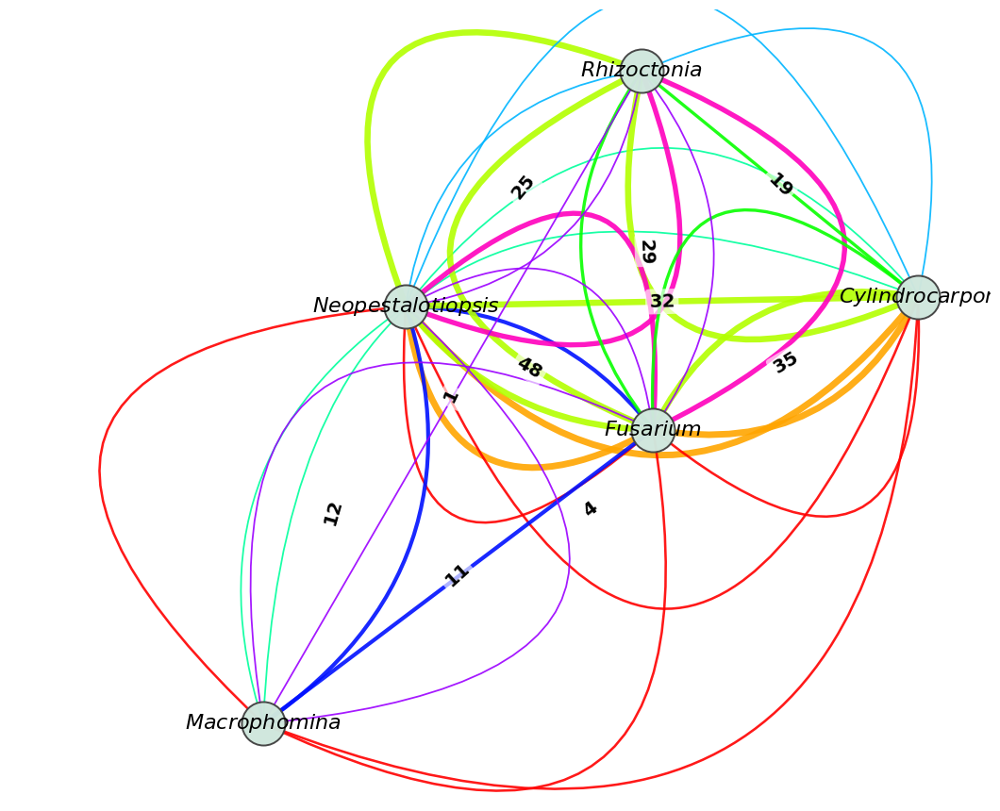

In [511]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
from itertools import combinations
from collections import Counter, defaultdict
from matplotlib import colormaps as cm
from matplotlib.patches import FancyArrowPatch

aislamientos23_1 = pd.read_excel('./BASE DE DATOS_NEOPEST_2023xlsx.xlsx', sheet_name='AISLAMIENTOS', skiprows=3)
aislamientos23_1 = aislamientos23_1[['Num. Parcela', 'Nom. Parcela', 'Variedad', 'Organo',
       'Neopestalotiopsis', 'Fusarium', 'Cylindrocarpon', 'Macrophomina',
       'Rhizoctonia', 'Phytophthora', 'Alternaria', 'Botrytis', 'Colletotrichum',
       'Aspergillus', 'NO ID', 'Trichoderma', 'Rizophus', 'FALTANTES']]
aislamientos23_1 = aislamientos23_1.iloc[0:282]

GENS = ['Neopestalotiopsis','Fusarium','Cylindrocarpon','Macrophomina','Rhizoctonia']

def present(v):
    if pd.isna(v): return False
    x = pd.to_numeric(v, errors='coerce')
    if not np.isnan(x): return x > 0
    s = str(v).strip().lower()
    return s in {'1','si','sí','x','positivo','pos','+','true','present','presente'}

df = aislamientos23_1[GENS].copy()
bin_df = df.map(present)
bin_df_3plus = bin_df[bin_df.sum(axis=1) >= 3]

conteo_total_par = Counter()
conteo_par_combo = Counter()
combos_unicos = set()

for _, row in bin_df_3plus.iterrows():
    presentes = [g for g in GENS if row[g]]
    combo = frozenset(presentes)
    combos_unicos.add(combo)
    for a, b in combinations(sorted(presentes), 2):
        conteo_total_par[(a, b)] += 1
        conteo_par_combo[((a, b), combo)] += 1

G2 = nx.Graph()
for (a, b), w in conteo_total_par.items():
    G2.add_edge(a, b, weight=w)

plt.figure(figsize=(11, 9))
pos2 = nx.spring_layout(G2, k=0.8, seed=42)

nx.draw_networkx_nodes(G2, pos2, node_size=1100, node_color="#cfe7dd", edgecolors="#444444", linewidths=1.4, alpha=0.98)
nx.draw_networkx_labels(G2, pos2, labels={n: f"$\\it{{{n}}}$" for n in G2.nodes()}, font_size=16, font_color="#000000")

max_w_combo = max(conteo_par_combo.values()) if conteo_par_combo else 1
def wscale(c): return 1.0 + 4.0 * (c / max_w_combo if max_w_combo > 0 else 0)

combos_list = sorted(list(combos_unicos), key=lambda s: "+".join(sorted(s)))
nC = max(1, len(combos_list))
base_cmap = cm.get_cmap('hsv')
cols = [base_cmap(t) for t in np.linspace(0, 1, nC, endpoint=False)]
combo2color = {combo: cols[i] for i, combo in enumerate(combos_list)}

pair_to_combos = defaultdict(list)
for ((a, b), combo) in conteo_par_combo.keys():
    pair_to_combos[(a, b)].append(combo)
for pair in pair_to_combos:
    pair_to_combos[pair] = sorted(pair_to_combos[pair], key=lambda s: "+".join(sorted(s)))

def spaced_rads(m):
    if m == 1: return [0.0]
    if m == 2: return [-0.7, 0.7]
    if m == 3: return [-0.95, 0.0, 0.95]
    if m == 4: return [-1.1, -0.37, 0.37, 1.1]
    return np.linspace(-1.2, 1.2, m)

pair_combo2rad = {}
for pair, clist in pair_to_combos.items():
    rads = spaced_rads(len(clist))
    for combo, r in zip(clist, rads):
        pair_combo2rad[(pair, combo)] = float(r)

ax = plt.gca()
for ((a, b), combo), cnt in conteo_par_combo.items():
    x1, y1 = pos2[a]; x2, y2 = pos2[b]
    patch = FancyArrowPatch((x1, y1), (x2, y2),
                            connectionstyle=f"arc3,rad={pair_combo2rad[((a, b), combo)]}",
                            arrowstyle='-',
                            linewidth=wscale(cnt),
                            color=combo2color[combo],
                            alpha=0.9)
    ax.add_patch(patch)

edge_labels2 = {(a, b): f"$\\bf{{{w}}}$" for (a, b), w in conteo_total_par.items()}
nx.draw_networkx_edge_labels(G2, pos2, edge_labels=edge_labels2, font_size=14, font_color="#000000",
                             bbox=dict(boxstyle="round,pad=0.2", fc="white", ec="none", alpha=0.65))

plt.axis('off')
plt.tight_layout()
plt.show()


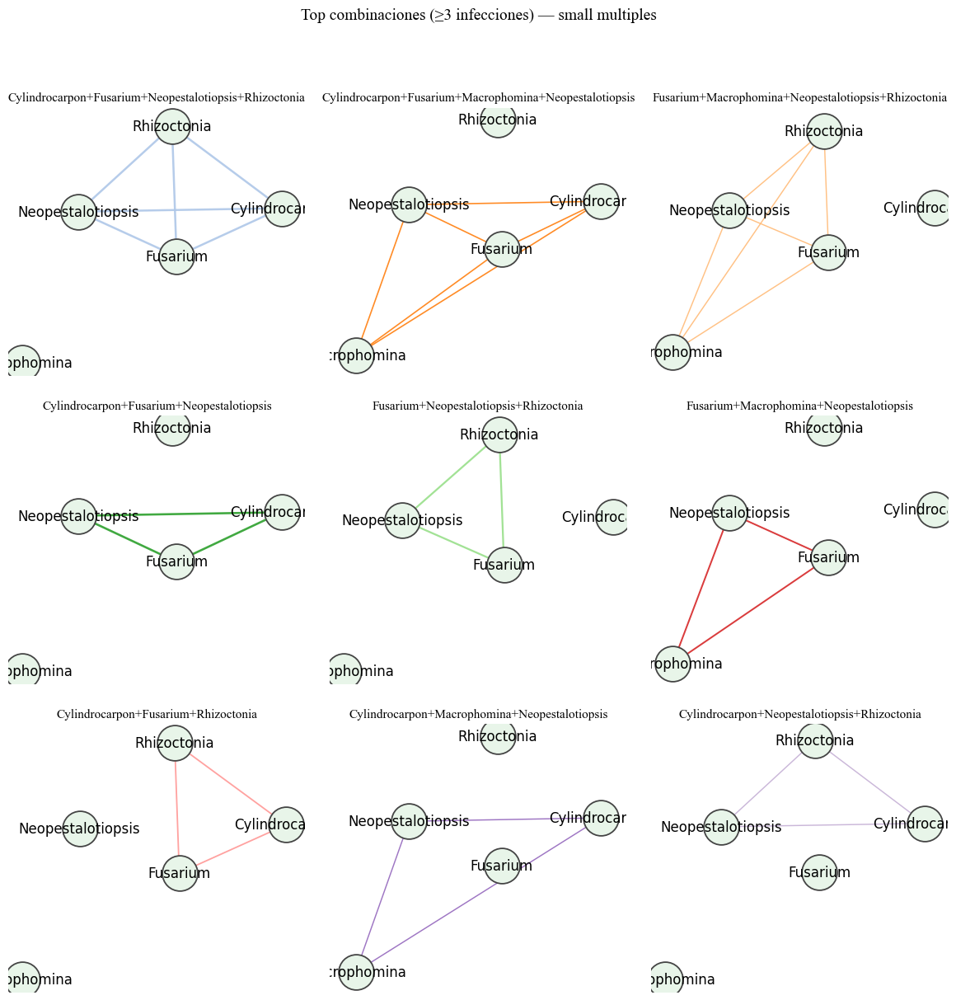

In [512]:
import math, matplotlib.pyplot as plt, networkx as nx
from collections import Counter
from matplotlib import colormaps as cm
from itertools import combinations

C_pair_total = Counter()
C_pair_combo  = Counter()
combos = set()
for _, r in bin_df_3plus.iterrows():
    p = [g for g in GENS if r[g]]
    combo = frozenset(p)
    combos.add(combo)
    for a,b in combinations(sorted(p),2):
        C_pair_total[(a,b)] += 1
        C_pair_combo[((a,b),combo)] += 1

G_base = nx.Graph()
for (a,b),w in C_pair_total.items(): G_base.add_edge(a,b,weight=w)
pos = nx.spring_layout(G_base, seed=42, k=0.8)

combo_list = sorted(list(combos), key=lambda s:(-len(s), -sum(C_pair_combo[((a,b),s)] for a,b in combinations(sorted(s),2)), "+".join(sorted(s))))
K = min(9, len(combo_list))
rows = math.ceil(K/3); cols=3
cmap = cm.get_cmap('tab20')
plt.figure(figsize=(4*cols,4*rows))
for i,combo in enumerate(combo_list[:K],1):
    ax = plt.subplot(rows, cols, i)
    nx.draw_networkx_nodes(G_base, pos, nodelist=GENS, node_size=950, node_color="#e8f5e9",
                           edgecolors="#444", linewidths=1.3, ax=ax)
    nx.draw_networkx_labels(G_base, pos, labels={n:n for n in GENS}, font_size=12, font_color="black", ax=ax)
    edges = []; widths=[]
    for a,b in combinations(sorted(combo),2):
        w = C_pair_combo.get(((a,b),combo),0)
        if w>0: edges.append((a,b)); widths.append(1+3*w/max(C_pair_total.values()))
    if edges:
        nx.draw_networkx_edges(G_base, pos, edgelist=edges, width=widths, edge_color=[cmap(i%20)], alpha=0.9, ax=ax)
    ax.set_title("+".join(sorted(combo)), fontsize=11); ax.axis('off')
plt.suptitle("Top combinaciones (≥3 infecciones) — small multiples", y=1.02, fontsize=14)
plt.tight_layout(); plt.show()


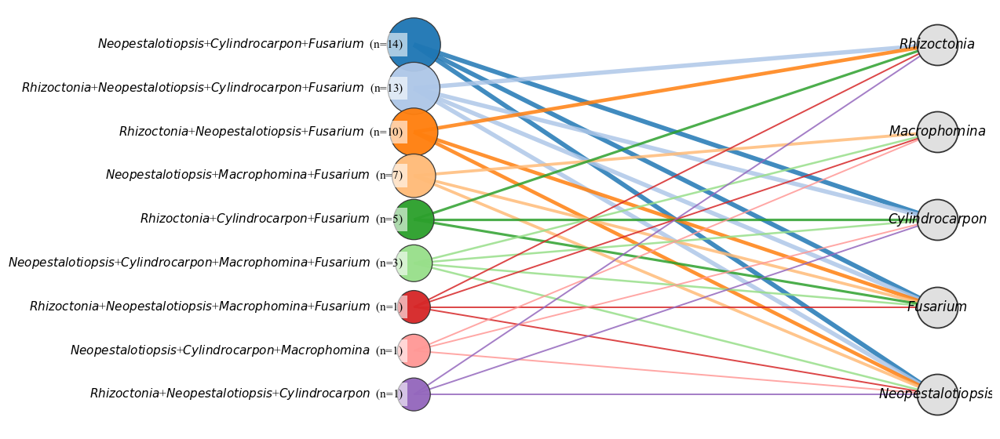

In [513]:
import pandas as pd, numpy as np, networkx as nx, matplotlib.pyplot as plt
from itertools import combinations
from collections import Counter
from matplotlib import colormaps as cm

aislamientos23_1 = pd.read_excel('./BASE DE DATOS_NEOPEST_2023xlsx.xlsx', sheet_name='AISLAMIENTOS', skiprows=3)
aislamientos23_1 = aislamientos23_1[['Num. Parcela', 'Nom. Parcela', 'Variedad', 'Organo',
       'Neopestalotiopsis', 'Fusarium', 'Cylindrocarpon', 'Macrophomina',
       'Rhizoctonia', 'Phytophthora', 'Alternaria', 'Botrytis', 'Colletotrichum',
       'Aspergillus', 'NO ID', 'Trichoderma', 'Rizophus', 'FALTANTES']]
aislamientos23_1 = aislamientos23_1.iloc[0:282]

GENS = ['Neopestalotiopsis','Fusarium','Cylindrocarpon','Macrophomina','Rhizoctonia']

def present(v):
    if pd.isna(v): return False
    x = pd.to_numeric(v, errors='coerce')
    if not np.isnan(x): return x > 0
    s = str(v).strip().lower()
    return s in {'1','si','sí','x','positivo','pos','+','true','present','presente'}

df = aislamientos23_1[GENS].copy()
bin_df = df.map(present)
bin_df_3plus = bin_df[bin_df.sum(axis=1) >= 3]

combo_counts = Counter()
for _, r in bin_df_3plus.iterrows():
    presentes = [g for g in GENS if r[g]]
    combo_counts[frozenset(presentes)] += 1

combos_sorted = sorted(combo_counts.items(),
                       key=lambda kv: (-kv[1], -len(kv[0]), "+".join(sorted(kv[0]))))
combo_names = ["+".join(sorted(c)) for c,_ in combos_sorted]
name2set = {"+".join(sorted(c)): c for c,_ in combos_sorted}

B = nx.Graph()
for name, (_, w) in zip(combo_names, combos_sorted):
    B.add_node(name, bipartite=0, weight=w)
for g in GENS:
    B.add_node(g, bipartite=1)
for name in combo_names:
    for g in name2set[name]:
        B.add_edge(name, g, weight=B.nodes[name]['weight'])

left = combo_names
right = GENS
pos = {}
for i, n in enumerate(left):
    pos[n] = (0, len(left)-1 - i)
for j, g in enumerate(right):
    pos[g] = (1, (len(left)-1) * (j/(len(right)-1)) if len(right)>1 else 0)

max_w = max(combo_counts.values()) if combo_counts else 1
base_cmap = cm.get_cmap('tab20')
colors = [base_cmap(i % 20) for i in range(len(left))]
cmap_combo = {n: colors[i] for i, n in enumerate(left)}
sizes_left = [800 + 1600*(B.nodes[n]['weight']/max_w) for n in left]

plt.figure(figsize=(13, max(6, 0.55*len(left))))
nx.draw_networkx_nodes(B, pos, nodelist=left, node_size=sizes_left,
                       node_color=[cmap_combo[n] for n in left],
                       edgecolors="#333", linewidths=0.9, alpha=0.96)
nx.draw_networkx_nodes(B, pos, nodelist=right, node_size=1400,
                       node_color="#e0e0e0", edgecolors="#333", linewidths=1.3)

for n in left:
    for g in name2set[n]:
        nx.draw_networkx_edges(B, pos, edgelist=[(n,g)],
                               width=1.2 + 3.0*(B.nodes[n]['weight']/max_w),
                               edge_color=[cmap_combo[n]], alpha=0.85)

nx.draw_networkx_labels(
    B, pos,
    labels={g: rf"$\it{{{g}}}$" for g in right},
    font_size=12, font_color="black"
)

for n in left:
    x,y = pos[n]
    italic_name = "+".join([rf"$\it{{{g}}}$" for g in name2set[n]])
    plt.text(x-0.02, y, f"{italic_name}  (n={B.nodes[n]['weight']})",
            ha="right", va="center", fontsize=11, color="black",
            bbox=dict(fc="white", ec="none", alpha=0.6))


plt.axis("off")
plt.tight_layout()
plt.show()


/var/folders/g1/6fhcms6n0px1d6b5mxmlwwcw0000gn/T/ipykernel_21030/3361338310.py:22: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


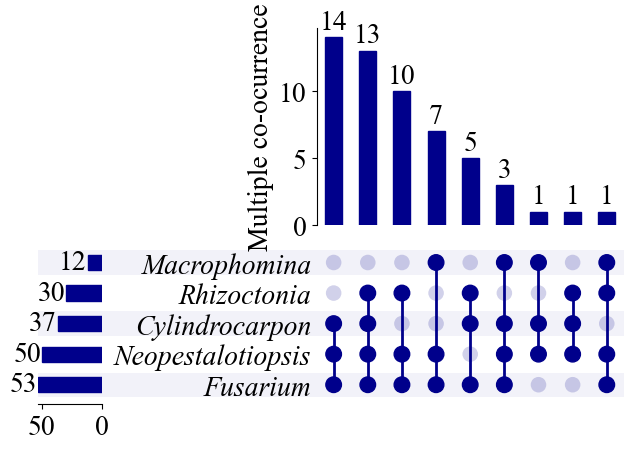

In [514]:
from upsetplot import UpSet, from_memberships
import matplotlib.pyplot as plt
from matplotlib.text import Text

memberships = [tuple(sorted([g for g in GENS if row[g]])) for _, row in bin_df_3plus.iterrows()]
up_data = from_memberships(memberships)

fig = plt.figure(figsize=(10,7))
up = UpSet(up_data, subset_size='count', sort_by='cardinality',
           min_degree=3, show_counts=True,facecolor='darkblue')
up.plot(fig=fig)

for ax in fig.axes:
    ax.grid(False)
    if ax.get_ylabel() == 'Intersection size':
        ax.set_ylabel('Multiple co-ocurrence')

for t in fig.findobj(Text):
    if t.get_text() in GENS:
        t.set_fontstyle('italic')

plt.tight_layout()
plt.show()


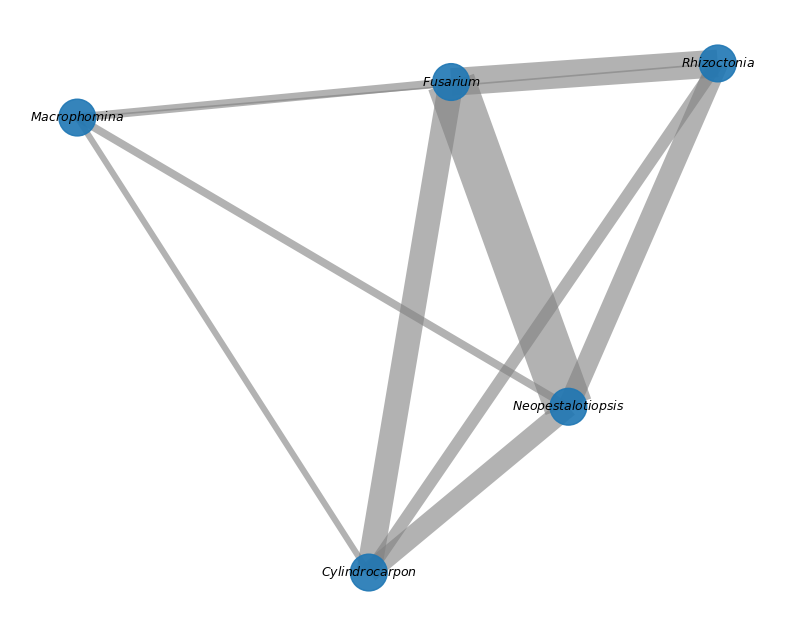

In [515]:
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import networkx as nx

plt.figure(figsize=(10, 8))
# Aumentar k para separar más los nodos
pos = nx.spring_layout(G, k=3.5, seed=42)  

weights = [G[u][v]['weight'] for u, v in G.edges]

# Dibujar nodos
nx.draw_networkx_nodes(
    G, pos, 
    node_size=700, 
    node_color=node_colors, 
    alpha=0.9
)

# Dibujar aristas con color y grosor proporcional
nx.draw_networkx_edges(
    G, pos, 
    width=[w * 0.4 for w in weights], 
    alpha=0.6, 
    edge_color="gray"
)

# Dibujar etiquetas en cursiva con LaTeX
labels = {n: f"${n}$" for n in G.nodes}  # esto fuerza cursiva
nx.draw_networkx_labels(G, pos, labels=labels, font_size=9)

# Crear leyenda de comunidades
handles = []
for comunidad in comunidades:
    patch = mpatches.Patch(color=color_map[comunidad], 
                           label=f"Comunidad {comunidad}")
    handles.append(patch)


plt.axis("off")
plt.show()


In [135]:
enfermedades_por_parcela = (
    aislamientos23
    .groupby('Num. Parcela')['Disease']
    .unique()
)
enfermedades_por_parcela.drop_duplicates()

Num. Parcela
1.1      [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
1.2      [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
1.3      [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
1.4      [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
2.0      [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
                               ...                        
106.2    [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
107.0    [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
108.0    [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
109.0    [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
110.0    [Neopestalotiopsis, Fusarium, Cylindrocarpon, ...
Name: Disease, Length: 141, dtype: object

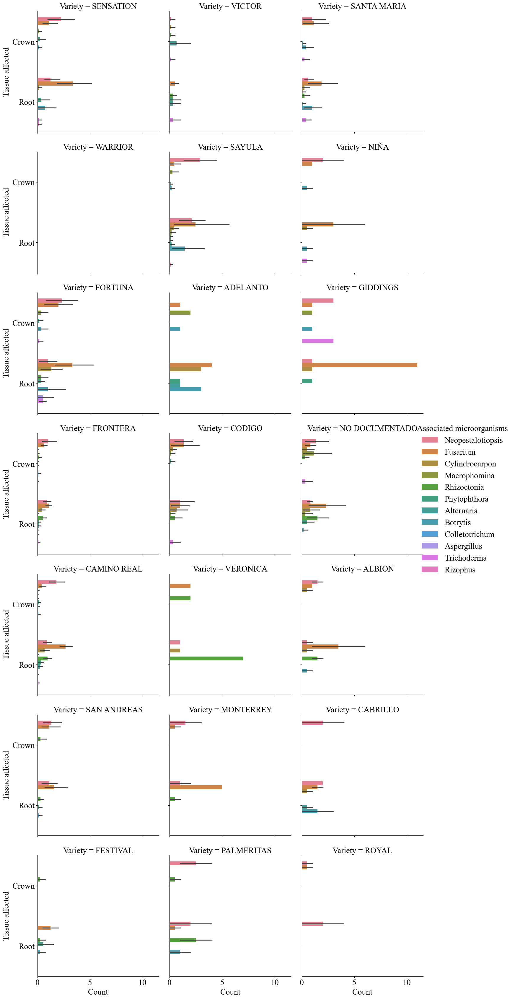

In [517]:
plot = sns.catplot(data=aislamientos23, x='Count', y='Tissue affected', hue='Disease', col='Variety', kind='bar',col_wrap=3)
plot._legend.set_title("Associated microorganisms")
plt.show()

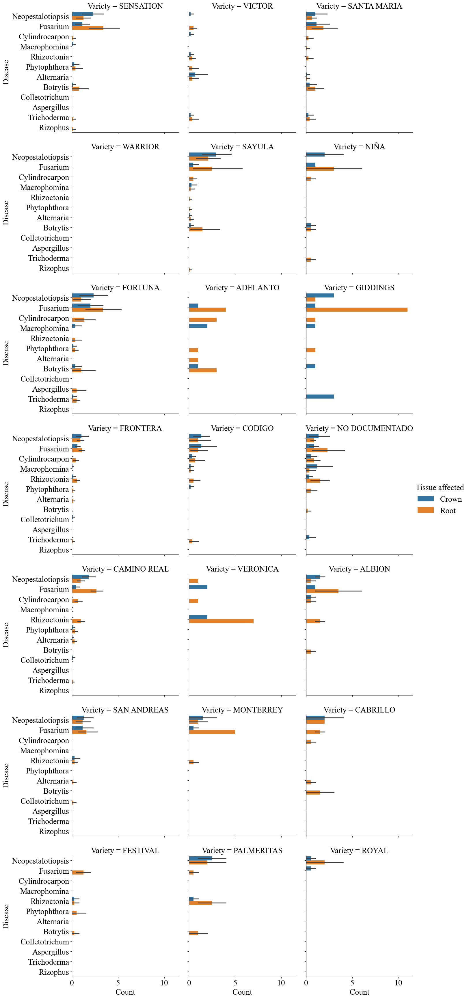

In [136]:
sns.catplot(data=aislamientos23, x='Count', hue='Tissue affected', y='Disease', col='Variety', kind='bar',col_wrap=3)

In [137]:
entrevistas23.columns

Index(['Y', 'X', 'UNIDAD DE MUESTREO', 'NUMERO DE PARCELA',
       'NOMBRE DE PARCELA', 'VARIEDAD', 'TIPO DE PLANTACION', 'INCIDENCIA ',
       'SEVERIDAD', 'MORTALIDAD', 'FECHA DE MUESTREO', 'PRODUCTOR', 'CONTACTO',
       'CODIGO HOJA', 'SUPERFICIE', 'DENSIDAD', 'FECHA DE SIEMBRA', 'Columna1',
       'MODALIDAD', 'TEMPORADA', 'ORIGEN DE LA PLANTA', 'PUESTA DE TUNEL',
       'TIPO DE RIEGO', 'FERTILIZACION', 'ASESORIA TECNICA', 'EMPRESA',
       'ANTECEDENTES FITOPAT', 'TRATAMIENTO PRE', 'productos utilizados PRE',
       'Ingrediente pre', 'TRATAMIENTO POST', 'productos utilizados POST',
       'Ingrediente pos', 'fungus', 'Duponchelia', 'Replante', 'Perdida',
       'COSTOS EN P&E', 'CULTIVO ANTERIOR', 'TEXTURA',
       'HUMEDAD AL MUESTREO (1-5)'],
      dtype='object')

In [138]:
entrevistas23['MODALIDAD'] = entrevistas23['MODALIDAD'].replace({'RAIZ DESNUDA ':'RAIZ DESNUDA',
                                                                 'CEPELLON, RAIZ DESNUDA':'RAIZ DESNUDA, CEPELLON'})

In [139]:
entrevistas23['VARIEDAD'] = entrevistas23['VARIEDAD'].str.title()

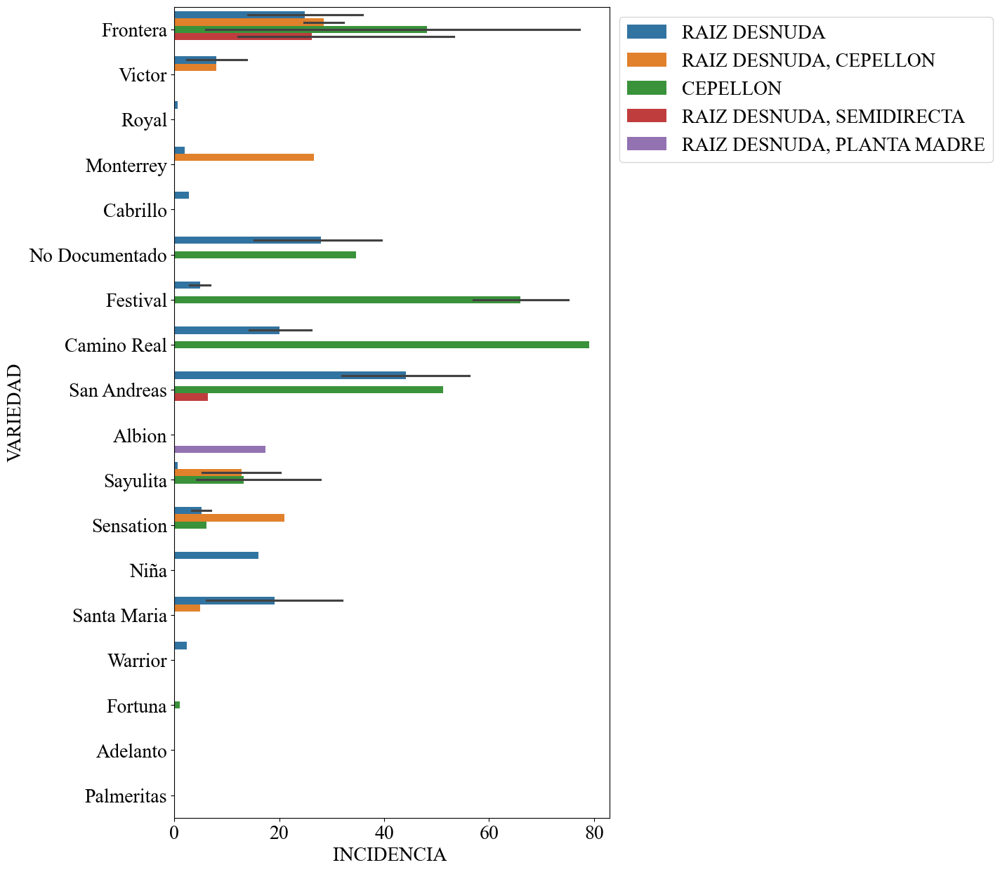

In [140]:
plt.figure(figsize=(8,15))
sns.barplot(data=entrevistas23,x='INCIDENCIA ',y='VARIEDAD',hue='MODALIDAD')
plt.legend(bbox_to_anchor=(1,1))

In [141]:
entrevistas23['MODALIDAD'] = entrevistas23['MODALIDAD'].str.title()
entrevistas23['TEMPORADA'] = entrevistas23['TEMPORADA'].str.title()

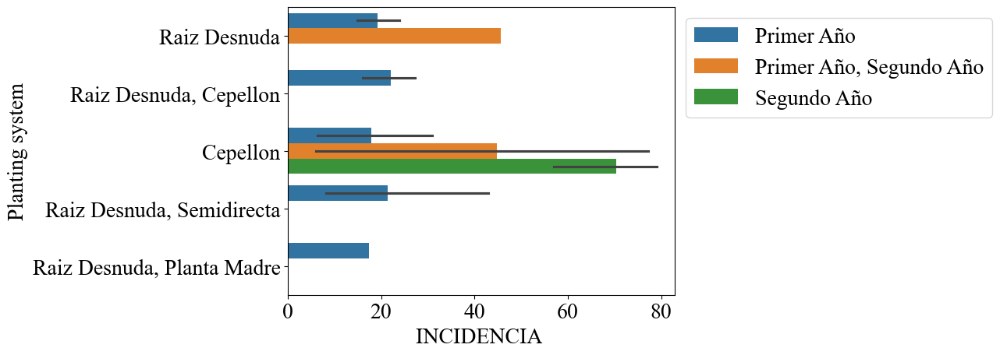

In [142]:
sns.barplot(data=entrevistas23,x='INCIDENCIA ',y='MODALIDAD',hue='TEMPORADA')
plt.ylabel('Planting system')
plt.legend(bbox_to_anchor=(1,1))

Puntos de muestreo en el tiempo

In [525]:
import re

def dms_a_decimal(grados, minutos, segundos, direccion):
    decimal = float(grados) + float(minutos) / 60 + float(segundos) / 3600
    if direccion in ['S', 'W']:
        decimal = -decimal
    return decimal

def convertir_coordenada(row):
    texto = row['COORDENADAS']
    if pd.isna(texto):
        return pd.Series([None, None])

    texto = texto.replace('\n', ' ').replace('”', '"').replace('“', '"').replace('’', "'")
    texto = texto.replace("''", '"')  

    if re.search(r'\d+\.\d+.*[Nn]', texto) and re.search(r'-\d+\.\d+', texto):
        partes = re.findall(r'[-]?\d+\.\d+', texto)
        if len(partes) >= 2:
            lat, lon = float(partes[0]), float(partes[1])
            return pd.Series([lat, lon])

    partes = re.split(r'[Nn]\s*|[Ss]\s*', texto)
    if len(partes) < 2:
        partes = texto.split()
    if len(partes) < 2:
        return pd.Series([None, None])

    lat_txt = partes[0].strip()
    lon_txt = partes[1].strip()

    def extraer_dms(texto):
        patron = re.findall(r'(\d+)[°º]?\s*(\d+)?[\'′]?\s*(\d+(?:\.\d+)?)[\"″]?', texto)
        if patron:
            grados, minutos, segundos = patron[0]
            minutos = minutos if minutos else '0'
            segundos = segundos if segundos else '0'
        else:
            partes = re.findall(r'\d+(?:\.\d+)?', texto)
            grados = partes[0] if len(partes) > 0 else '0'
            minutos = partes[1] if len(partes) > 1 else '0'
            segundos = partes[2] if len(partes) > 2 else '0'
        return grados, minutos, segundos

    lat_dms = extraer_dms(lat_txt)
    lon_dms = extraer_dms(lon_txt)

    try:
        lat_decimal = dms_a_decimal(*lat_dms, 'N')
        lon_decimal = dms_a_decimal(*lon_dms, 'W')
    except Exception as e:
        return pd.Series([None, None])

    return pd.Series([lat_decimal, lon_decimal])

In [526]:
Dcrudos_19_20[['Latitud', 'Longitud']] = Dcrudos_19_20.apply(convertir_coordenada, axis=1)
coors19_20 = Dcrudos_19_20[['Latitud','Longitud']].copy()
coors19_20['Time period'] = '2019-2020'

coors21_22 = Data21_22[['N','W']].copy()
coors21_22.columns = ['Latitud','Longitud']
coors21_22['Time period'] = '2021-2022'

coors22_23 = Data22_23[['N','W']].copy()
coors22_23.columns = ['Latitud','Longitud']
coors22_23['Time period'] = '2022-2023'

coors = pd.concat([coors19_20,coors21_22,coors22_23],axis=0)

In [527]:
time_period_size = {
    '2019-2020': 300,
    '2021-2022': 200,
    '2022-2023': 10
}

In [528]:
coors['size'] = coors['Time period'].map(time_period_size)
coors = coors.sort_values('size', ascending=False)

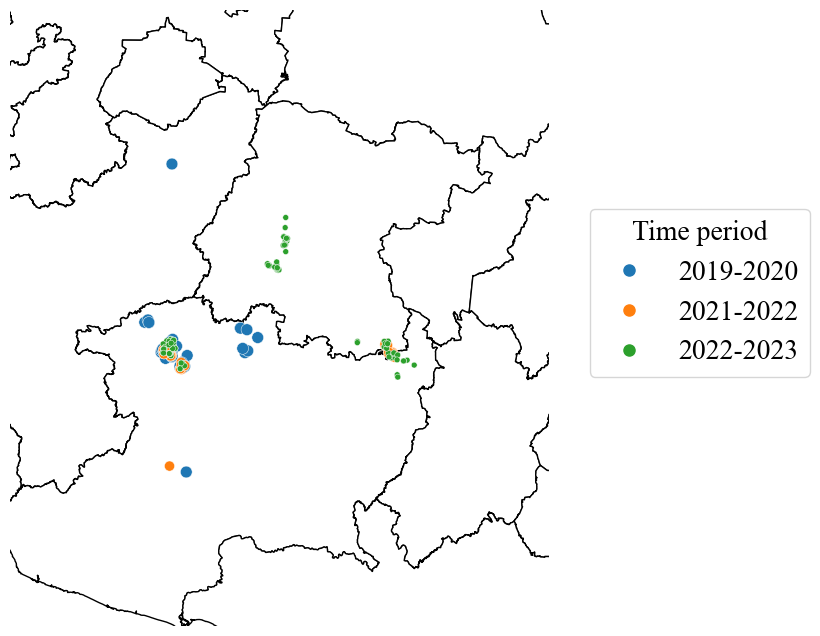

In [529]:
fig, ax = plt.subplots(figsize=(10, 8))
mexico.plot(ax=ax, facecolor='white', edgecolor='black', zorder=0)
sns.scatterplot(data=coors, x='Longitud', y='Latitud', hue='Time period', ax=ax, zorder=1,size='size') 
x_min, x_max = coors['Longitud'].min(), coors['Longitud'].max()
y_min, y_max = coors['Latitud'].min(), coors['Latitud'].max()
margen_x = (x_max - x_min) * 0.5
margen_y = (y_max - y_min) * 0.5
ax.set_xlim(x_min - margen_x, x_max + margen_x)
ax.set_ylim(y_min - margen_y, y_max + margen_y)
ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
ax.set_axis_off()
ax.get_legend().remove()

import matplotlib.lines as mlines
hue_categories = coors['Time period'].unique()
palette = sns.color_palette(n_colors=len(hue_categories))
handles = [
    mlines.Line2D(
        [], [], 
        color=palette[i], 
        marker='o', 
        linestyle='None', 
        markersize=8, 
        label=hue_categories[i]
    ) 
    for i in range(len(hue_categories))
]
ax.legend(handles=handles, bbox_to_anchor=(1.05, 0.7), loc='upper left',title='Time period')
plt.show()

In [530]:
coors.to_csv('./coors.csv')

Mortalidad por municipio

In [143]:
entrevistas23.columns

Index(['Y', 'X', 'UNIDAD DE MUESTREO', 'NUMERO DE PARCELA',
       'NOMBRE DE PARCELA', 'VARIEDAD', 'TIPO DE PLANTACION', 'INCIDENCIA ',
       'SEVERIDAD', 'MORTALIDAD', 'FECHA DE MUESTREO', 'PRODUCTOR', 'CONTACTO',
       'CODIGO HOJA', 'SUPERFICIE', 'DENSIDAD', 'FECHA DE SIEMBRA', 'Columna1',
       'MODALIDAD', 'TEMPORADA', 'ORIGEN DE LA PLANTA', 'PUESTA DE TUNEL',
       'TIPO DE RIEGO', 'FERTILIZACION', 'ASESORIA TECNICA', 'EMPRESA',
       'ANTECEDENTES FITOPAT', 'TRATAMIENTO PRE', 'productos utilizados PRE',
       'Ingrediente pre', 'TRATAMIENTO POST', 'productos utilizados POST',
       'Ingrediente pos', 'fungus', 'Duponchelia', 'Replante', 'Perdida',
       'COSTOS EN P&E', 'CULTIVO ANTERIOR', 'TEXTURA',
       'HUMEDAD AL MUESTREO (1-5)'],
      dtype='object')

In [144]:
mun1920 = Dcrudos_19_20[['MUNICIPIO','mortalidad','%SEVERIDAD(PLANTA)']].copy()
mun1920.columns = ['Municipality','Mortality (%)', 'Severity (%)']
mun1920['Time period'] = '2019-2020'

mun2122 = Data21_22[['Zonas muestreadas','INCIDENCIA %','MORTALIDAD% ']].copy()
mun2122.columns = ['Municipality','Incidence (%)','Mortality (%)']
mun2122['Time period'] = '2021-2022'

mun2223 = entrevistas23[['UNIDAD DE MUESTREO','MORTALIDAD','INCIDENCIA ','SEVERIDAD']].copy()
mun2223.columns = ['Municipality','Mortality (%)','Incidence (%)','Severity (%)']
mun2223['Time period'] = '2022-2023'

municipality = pd.concat([mun1920,mun2122,mun2223],axis=0)

In [145]:
municipality['Municipality'] = municipality['Municipality'].str.title()
municipality['Municipality'] = municipality['Municipality'].replace({'De':'de'},regex=True)

In [146]:
municipality = municipality.melt(id_vars=['Municipality','Time period'])
municipality.columns = ['Municipality','Time period','Variable','Mortality (%)']

In [147]:
municipality = municipality[municipality['Municipality']!='Selvas']

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, 'Tangancicuaro'),
  Text(1, 0, 'Chilchota'),
  Text(2, 0, 'Jacona'),
  Text(3, 0, 'Zamora'),
  Text(4, 0, 'San Jose del Platanal'),
  Text(5, 0, 'Puruandiro'),
  Text(6, 0, 'Panindicuaro'),
  Text(7, 0, 'Ixtlan'),
  Text(8, 0, 'Angamacutiro'),
  Text(9, 0, 'Maravatio'),
  Text(10, 0, 'Irapuato'),
  Text(11, 0, 'Valle de Zamora')])

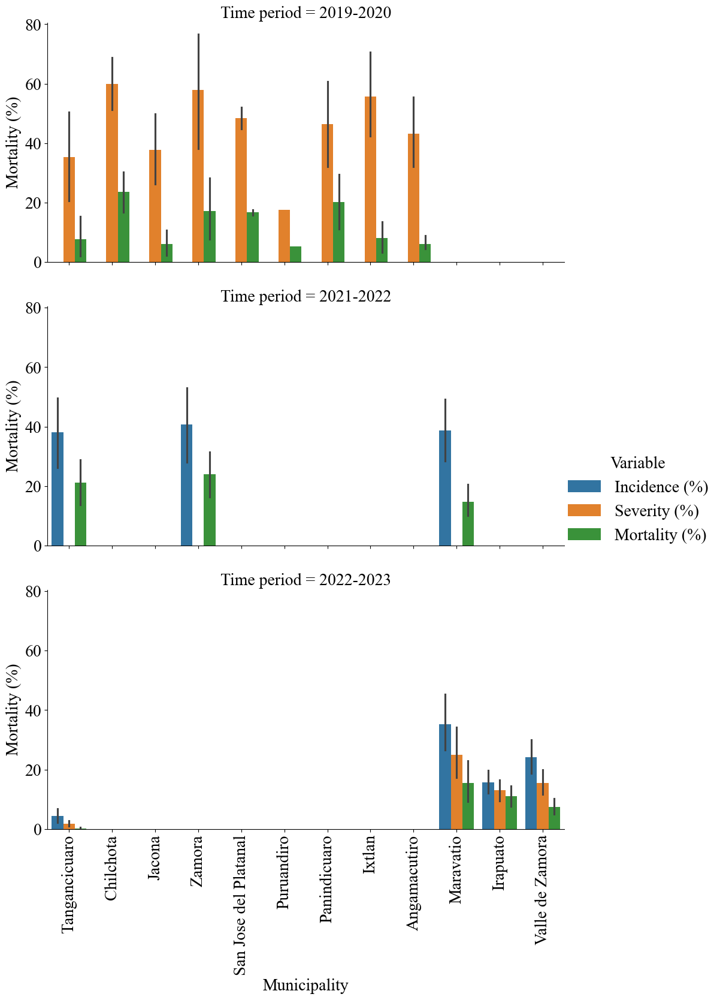

In [148]:
municipality = municipality.reset_index(drop=True)
sns.catplot(data=municipality,x='Municipality',y='Mortality (%)',col='Time period',col_wrap=1,
            hue='Variable',kind='bar', height=5, aspect=2,hue_order=['Incidence (%)','Severity (%)','Mortality (%)'])
plt.xticks(rotation=90)

In [149]:
for mun in municipality['Municipality'].unique():
    dat = municipality[municipality['Municipality']==mun]
    print(mun)
    print(dat['Time period'].unique())

Tangancicuaro
['2019-2020' '2021-2022' '2022-2023']
Chilchota
['2019-2020']
Jacona
['2019-2020']
Zamora
['2019-2020' '2021-2022']
San Jose del Platanal
['2019-2020']
nan
[]
Puruandiro
['2019-2020']
Panindicuaro
['2019-2020']
Ixtlan
['2019-2020']
Angamacutiro
['2019-2020']
Maravatio
['2021-2022' '2022-2023']
Irapuato
['2022-2023']
Valle de Zamora
['2022-2023']


In [150]:
municipality

,Municipality,Time period,Variable,Mortality (%)
0,Tangancicuaro,2019-2020,Mortality (%),2.0
1,Tangancicuaro,2019-2020,Mortality (%),0.0
2,Tangancicuaro,2019-2020,Mortality (%),0.2
3,Tangancicuaro,2019-2020,Mortality (%),14.4
4,Chilchota,2019-2020,Mortality (%),30.2
...,...,...,...,...
721,Valle de Zamora,2022-2023,Incidence (%),57.0
722,Valle de Zamora,2022-2023,Incidence (%),62.8
723,Valle de Zamora,2022-2023,Incidence (%),75.0
724,Valle de Zamora,2022-2023,Incidence (%),77.2


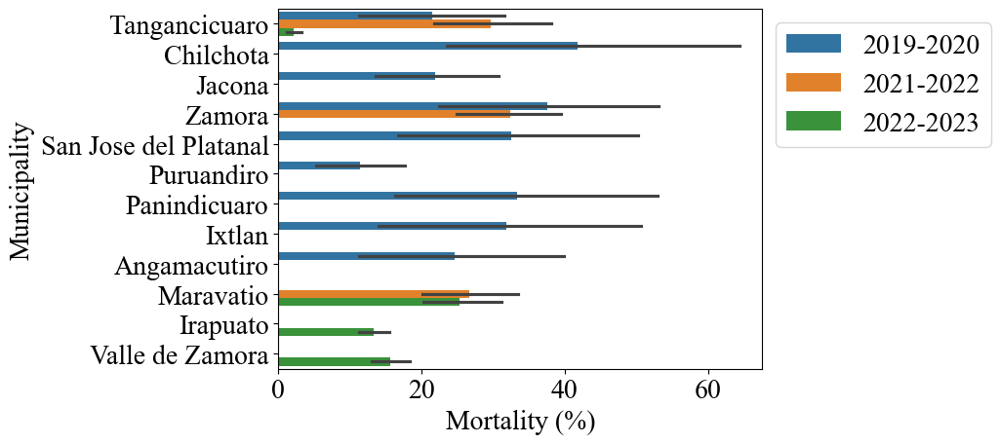

In [151]:
sns.barplot(data=municipality,x='Mortality (%)',y='Municipality',hue='Time period')
plt.legend(bbox_to_anchor=(1,1))

Dinámica de las variedades en el tiempo

In [152]:
var19 = pd.DataFrame(Dcrudos_19_20['Variety'])
var19['Time period'] = '2019-2020'
var21 = pd.DataFrame(Data21_22['Variedad'])
var21['Time period'] = '2021-2022'
var21.columns = ['Variety','Time period']
var23 = pd.DataFrame(entrevistas23['VARIEDAD'])
var23['Time period'] = '2022-2023'
var23.columns = ['Variety','Time period']

variety = pd.concat([var19,var21,var23],axis=0)

In [153]:
variety['Variety'].unique()

array(['Albion', 'Sayulita', 'Frontera', 'Osceola', 'Fortuna',
       'Camino Real', 'Cabrillo', 'Monterrey', 'NO DOCUMENTADO',
       'Sensation', 'Elyana', 'Palmeritas', 'Rociera', 'Victor', 'Royal',
       'No Documentado', 'Festival', 'San Andreas', 'Niña', 'Santa Maria',
       'Warrior', 'Adelanto'], dtype=object)

In [154]:
variety['Variety'] = variety['Variety'].replace({'NO DOCUMENTADO':'Others',
                                                 'No Documentado':'Others',
                                                 'Royal':'Royal Royce'})

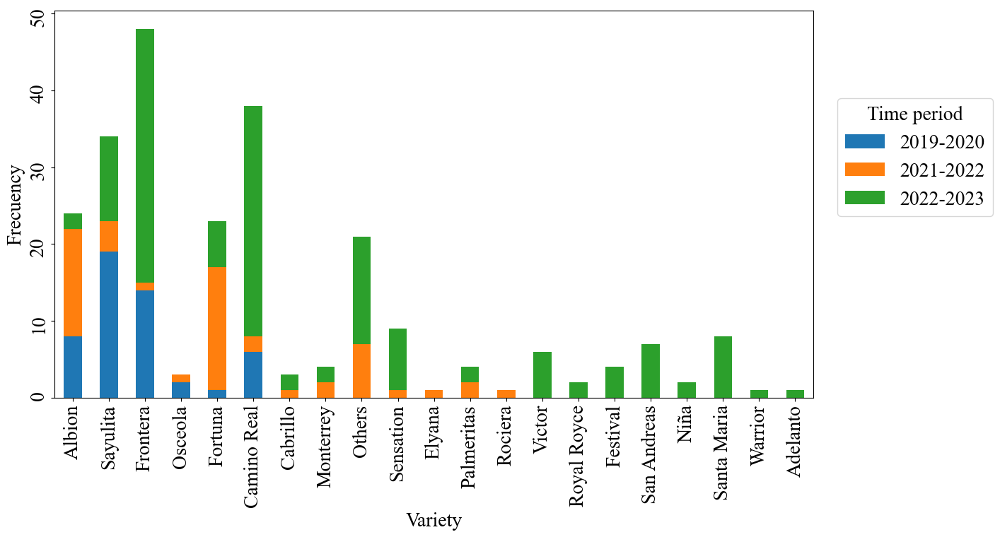

In [155]:
freq = variety.groupby(['Variety', 'Time period']).size().reset_index(name='Frequency')
freq_pivot = freq.pivot(index='Variety', columns='Time period', values='Frequency').fillna(0)
order_varieties = variety['Variety'].drop_duplicates()
freq_pivot.index = pd.CategoricalIndex(freq_pivot.index, categories=order_varieties, ordered=True)
freq_pivot = freq_pivot.sort_index()

#San Andreas,Cabrillo,Codigo se incluyen en 2019-2020 pero no se omitieron ya que habian otras var. en las fincas que eran mas frecuentes
freq_pivot.plot(kind='bar', stacked=True, figsize=(12,8))
plt.xlabel('Variety')
plt.ylabel('Frecuency')
plt.legend(title='Time period')
plt.xticks(rotation=90)
plt.yticks(rotation=90)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.25,0.8), title='Time period')
plt.show()

In [544]:
Dcrudos_19_20.columns

Index(['No- Parcela', 'ETIQUETA', 'COORDENADAS', 'Latitud', 'Longitud',
       'MUNICIPIO', 'SUPERFICIE', 'Variety', 'CEP-R.D.',
       'LUGAR DE ORIGEN/EMPRESA', 'FECHA DE TRANSPLANTE',
       'FECHA CUBIERTACON  (PLASTICO)', 'DIAS transplante-CUBIERTA',
       'FECHA DE REPLANTE ', 'Ingrediente pre', 'Ingrediente pos',
       'Ingrediente desinfección', 'CONDICIONES DE PARCELA',
       'Plagas-FUNGUS Gnat/DUPONCHELIA', 'CULTIVO DE ROTACION ', 'mortalidad',
       '%SEVERIDAD(PLANTA)', 'SEVERIDAD EN HOJA \nPROMEDIO',
       '%SEVERIDAD HOJA  BASADO EN ESCALA De PHOMOPSIS)'],
      dtype='object')

In [156]:
var19 = pd.DataFrame(Dcrudos_19_20[['CEP-R.D.','mortalidad', '%SEVERIDAD(PLANTA)']])
var19.columns = ['Planting system','Mortality (%)','Severity (%)']
var23 = pd.DataFrame(entrevistas23[['MODALIDAD','INCIDENCIA ','SEVERIDAD', 'MORTALIDAD']])
var23.columns = ['Planting system','Incidence (%)','Severity (%)','Mortality (%)']

variety = pd.concat([var19,var23],axis=0)

In [157]:
variety['Planting system'] = variety['Planting system'].replace({'R.D.':'Bare roots', 
                                                                 'CEPELLON':'Plugs', 
                                                                 'R.D. CEPELLON':'Both', 
                                                                 'Raiz Desnuda':'Bare roots',
                                                                 'Raiz Desnuda, Cepellon':'Both', 
                                                                 'Cepellon':'Plugs', 
                                                                 'Raiz Desnuda, Semidirecta':'Bare roots',
                                                                 'Raiz Desnuda, Planta Madre':'Bare roots'})

variety = variety.melt(id_vars='Planting system')
variety.columns = ['Planting system','Variable','Value']

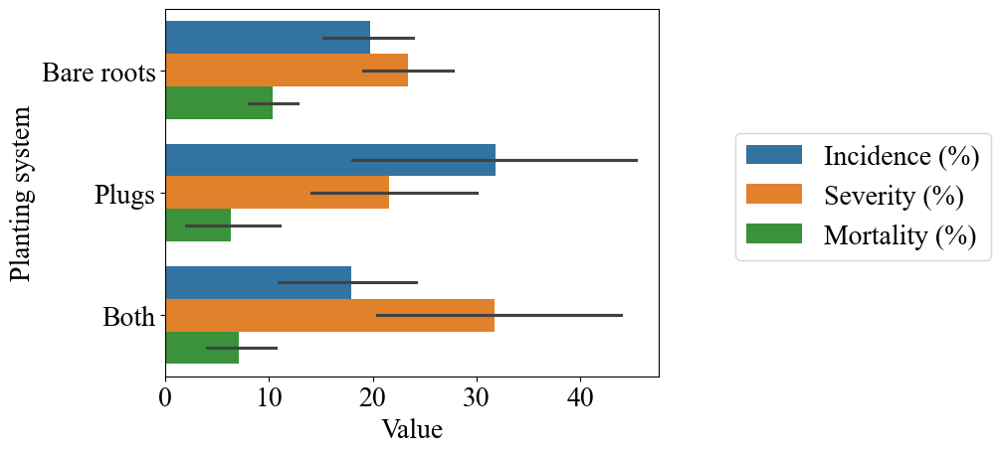

In [158]:
sns.barplot(data=variety, hue='Variable', x='Value',y='Planting system',hue_order=['Incidence (%)','Severity (%)','Mortality (%)'])
plt.legend(bbox_to_anchor=(1.7,0.7))

In [159]:
var19 = pd.DataFrame(Dcrudos_19_20[['Variety','mortalidad', '%SEVERIDAD(PLANTA)']])
var19.columns = ['Variety','Mortality (%)','Severity (%)']
var19['Time period'] = '2019-2020'
var21 = pd.DataFrame(Data21_22[['Variedad','INCIDENCIA %', 'MORTALIDAD% ']])
var21.columns = ['Variety','Incidence (%)','Mortality (%)']
var21['Time period'] = '2021-2022'
var23 = pd.DataFrame(entrevistas23[['VARIEDAD','INCIDENCIA ','SEVERIDAD', 'MORTALIDAD']])
var23.columns = ['Variety','Incidence (%)','Severity (%)','Mortality (%)']
var23['Time period'] = '2022-2023'

variety = pd.concat([var19,var21,var23],axis=0)

In [160]:
variety['Variety'] = variety['Variety'].replace({'NO DOCUMENTADO':'Others',
                                                 'No Documentado':'Others',
                                                 'Royal':'Royal Royce'})

In [161]:
variety["Mortality (%)"] = pd.to_numeric(variety["Mortality (%)"], errors="coerce")
q1, q2, q3 = variety.loc[variety["Mortality (%)"] > 0, "Mortality (%)"].quantile([0.25, 0.5, 0.75])
def mortality_category(x):
    if pd.isna(x) or x == 0:
        return "No mortality"
    elif x <= q1:
        return "Low"
    elif x <= q2:
        return "Medium"
    else:
        return "High"

variety["Mortality_cat"] = variety["Mortality (%)"].apply(mortality_category)

variety["Mortality_cat"] = pd.Categorical(
    variety["Mortality_cat"],
    categories=["No mortality", "Low", "Medium", "High"],
    ordered=True
)


In [162]:
print(q1, q2, q3)

2.775 7.6 19.6


In [163]:
agg = (
    variety.groupby(["Variety", "Time period"])
           .agg(
               Mortality_cat=("Mortality_cat", lambda x: x.mode()[0])
           )
           .reset_index()
)

periods = ["2019-2020", "2021-2022", "2022-2023"]

varieties = agg["Variety"].unique()

full_index = pd.MultiIndex.from_product(
    [varieties, periods],
    names=["Variety", "Time period"]
)

heat_df = (
    agg.set_index(["Variety", "Time period"])
       .reindex(full_index)
       .reset_index()
)


In [ ]:
cat_to_num = {
    "No mortality": 0,
    "Low": 1,
    "Medium": 2,
    "High": 3
}

heat_df["Mortality_num"] = heat_df["Mortality_cat"].map(cat_to_num)
heat_df["Mortality_num"] = heat_df["Mortality_num"].fillna(-1)


In [554]:
heat_matrix = heat_df.pivot(
    index="Variety",
    columns="Time period",
    values="Mortality_num"
)

freq = (
    variety.groupby(["Variety", "Time period"])
           .size()
           .reset_index(name="Frequency")
)

heat_df = heat_df.merge(
    freq,
    on=["Variety", "Time period"],
    how="left"
)

heat_df["Frequency"] = heat_df["Frequency"].fillna(0).astype(int)

freq_matrix = heat_df.pivot(
    index="Variety",
    columns="Time period",
    values="Frequency"
)

from matplotlib.colors import ListedColormap, BoundaryNorm

colors = [
    "#2166ac", 
    "#1a9850",  
    "#fee08b",  
    "#f46d43",
    "#d73027"  
]

cmap = ListedColormap(colors)
bounds = [-1.5, -0.5, 0.5, 1.5, 2.5, 3.5]
norm = BoundaryNorm(bounds, cmap.N)


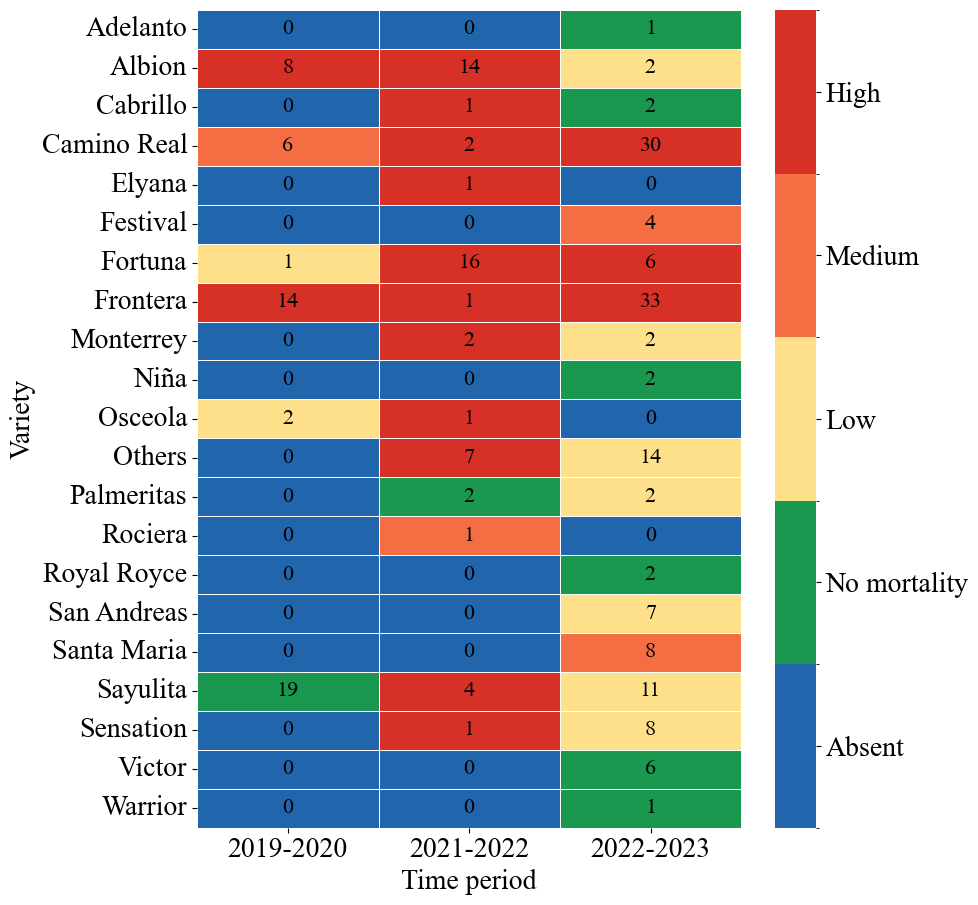

In [555]:
plt.figure(figsize=(10, max(6, 0.45 * heat_matrix.shape[0])))

ax = sns.heatmap(
    heat_matrix,
    cmap=cmap,
    norm=norm,
    linewidths=0.5,
    linecolor="white",
    cbar=True,
    annot=freq_matrix,
    fmt="d",
    annot_kws={"size": 16, "color": "black"}
)

cbar = ax.collections[0].colorbar
cbar.set_ticks([-1, 0, 1, 2, 3])
cbar.set_ticklabels([
    "Absent",
    "No mortality",
    "Low",
    "Medium",
    "High"
])

plt.xlabel("Time period")
plt.ylabel("Variety")

plt.tight_layout()
plt.show()

In [556]:
variety = variety.drop('Time period',axis=1)

In [557]:
variety = variety.melt(id_vars='Variety')
variety.columns = ['Variety','Variable','Value']

In [558]:
variety['Variety'] = variety['Variety'].replace({'NO DOCUMENTADO':'Others',
                                                 'No Documentado':'Others'})

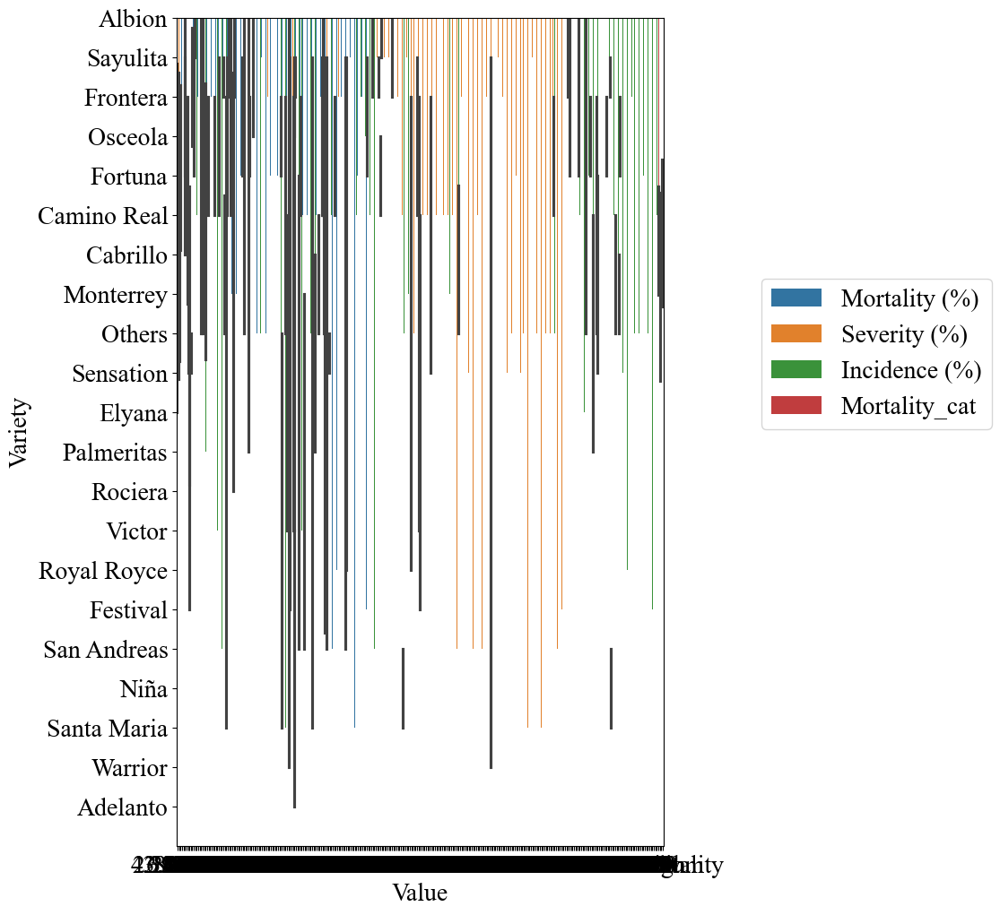

In [559]:
plt.figure(figsize=(7,12))
sns.barplot(data=variety, hue='Variable', x='Value',y='Variety')
plt.legend(bbox_to_anchor=(1.7,0.7))

In [560]:
print(Dcrudos_19_20.columns)
print(Data21_22.columns)
print(entrevistas23.columns)

Index(['No- Parcela', 'ETIQUETA', 'COORDENADAS', 'Latitud', 'Longitud',
       'MUNICIPIO', 'SUPERFICIE', 'Variety', 'CEP-R.D.',
       'LUGAR DE ORIGEN/EMPRESA', 'FECHA DE TRANSPLANTE',
       'FECHA CUBIERTACON  (PLASTICO)', 'DIAS transplante-CUBIERTA',
       'FECHA DE REPLANTE ', 'Ingrediente pre', 'Ingrediente pos',
       'Ingrediente desinfección', 'CONDICIONES DE PARCELA',
       'Plagas-FUNGUS Gnat/DUPONCHELIA', 'CULTIVO DE ROTACION ', 'mortalidad',
       '%SEVERIDAD(PLANTA)', 'SEVERIDAD EN HOJA \nPROMEDIO',
       '%SEVERIDAD HOJA  BASADO EN ESCALA De PHOMOPSIS)'],
      dtype='object')
Index(['No. De Ranchos', 'Zonas muestreadas', 'No. Etiquetado', 'Cultivo',
       'Municipio', 'Propietario', 'Variedad', 'Nombre del rancho', 'N', 'W',
       'Este (x)', 'Norte (y)', 'Zona UTM', 'INCIDENCIA %', 'MORTALIDAD% '],
      dtype='object')
Index(['Y', 'X', 'UNIDAD DE MUESTREO', 'NUMERO DE PARCELA',
       'NOMBRE DE PARCELA', 'VARIEDAD', 'TIPO DE PLANTACION', 'INCIDENCIA ',
      

In [561]:
var19 = Dcrudos_19_20[['Variety','mortalidad','MUNICIPIO']].copy()
var19['Time period'] = '2019-2020'
var19.columns = ['Variety','Mortality (%)','Municipality','Time period']
var21 = Data21_22[['Variedad','MORTALIDAD% ','Municipio']].copy()
var21['Time period'] = '2021-2022'
var21.columns = ['Variety','Mortality (%)','Municipality','Time period']
var23 = entrevistas23[['VARIEDAD','MORTALIDAD','UNIDAD DE MUESTREO']].copy()
var23['Time period'] = '2022-2023'
var23.columns = ['Variety','Mortality (%)','Municipality','Time period']

variety = pd.concat([var19,var21,var23],axis=0)
variety['Variety'] = variety['Variety'].replace({'No Documentado':'Others',
                                                 'NO DOCUMENTADO':'Others'})

In [562]:
variety['Municipality'].unique()

array(['TANGANCICUARO', 'CHILCHOTA', 'JACONA', 'ZAMORA',
       'SAN JOSE DEL PLATANAL', nan, 'SELVAS', 'PURUANDIRO',
       'PANINDICUARO', 'IXTLAN', 'ANGAMACUTIRO', 'Tarandacuao',
       'Tziritzicuaro', 'Maravatío', 'Tangancicuaro', 'Zamora',
       'IRAPUATO', 'MARAVATIO', 'VALLE DE ZAMORA'], dtype=object)

In [563]:
variety['Municipality'] = variety['Municipality'].replace({'TANGANCICUARO':'Tangancicuaro', 
                                                           'CHILCHOTA':'Chilchota', 
                                                           'JACONA':'Jacona', 
                                                           'ZAMORA':'Zamora',
                                                           'SAN JOSE DEL PLATANAL':'San Jose del Platanal',
                                                           'SELVAS':'Selvas', 
                                                           'PURUANDIRO':'Puruandiro',
                                                           'PANINDICUARO':'Panindicuaro', 
                                                           'IXTLAN':'Ixtlan', 
                                                           'ANGAMACUTIRO':'Angamacutiro', 
                                                           'IRAPUATO':'Irapuato', 
                                                           'MARAVATIO':'Maravatio', 
                                                           'VALLE DE ZAMORA':'Valle de Zamora'})

In [564]:
variety['Variety'] = variety['Variety'].replace({'Royal':'Royal Royce',
                                                 'Frontera':'Fronteras'})

In [565]:
variety = variety[variety['Municipality']!='Selvas']

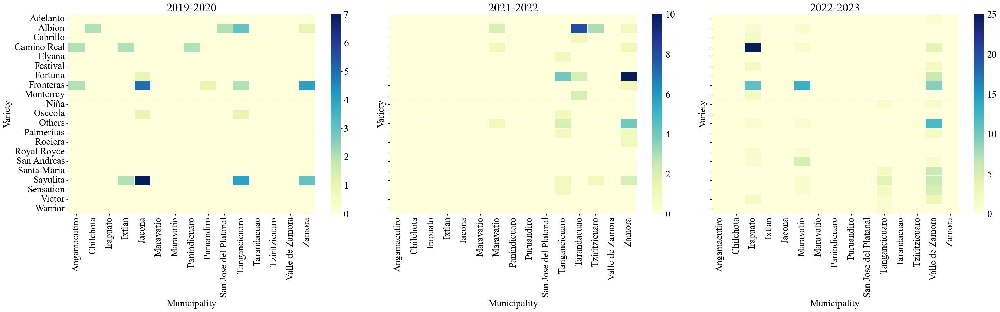

In [566]:
freq = (
    variety.groupby(["Municipality", "Variety", "Time period"])
           .size()
           .reset_index(name="Frequency")
)

municipalities = sorted(freq["Municipality"].unique())
varieties = sorted(freq["Variety"].unique())
periods = sorted(freq["Time period"].unique())

full_index = pd.MultiIndex.from_product(
    [municipalities, varieties, periods],
    names=["Municipality", "Variety", "Time period"]
)

freq_full = (
    freq.set_index(["Municipality", "Variety", "Time period"])
        .reindex(full_index)
        .fillna(0)
        .reset_index()
)

fig, axes = plt.subplots(
    nrows=1,
    ncols=len(periods),
    figsize=(10 * len(periods), max(8, 0.45 * len(varieties))),
    sharey=True
)

if len(periods) == 1:
    axes = [axes]

for ax, period in zip(axes, periods):
    mat = freq_full[freq_full["Time period"] == period].pivot(
        index="Variety",
        columns="Municipality",
        values="Frequency"
    )

    sns.heatmap(
        mat,
        cmap="YlGnBu",
        linewidths=0.5,
        linecolor="white",
        cbar=True,
        ax=ax
    )

    ax.set_title(period)
    ax.set_xlabel("Municipality")
    ax.set_ylabel("Variety")

plt.tight_layout()
plt.show()


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20],
 [Text(0, 0, 'Albion'),
  Text(1, 0, 'Sayulita'),
  Text(2, 0, 'Fronteras'),
  Text(3, 0, 'Osceola'),
  Text(4, 0, 'Fortuna'),
  Text(5, 0, 'Camino Real'),
  Text(6, 0, 'Cabrillo'),
  Text(7, 0, 'Monterrey'),
  Text(8, 0, 'Others'),
  Text(9, 0, 'Sensation'),
  Text(10, 0, 'Elyana'),
  Text(11, 0, 'Palmeritas'),
  Text(12, 0, 'Rociera'),
  Text(13, 0, 'Victor'),
  Text(14, 0, 'Royal Royce'),
  Text(15, 0, 'Festival'),
  Text(16, 0, 'San Andreas'),
  Text(17, 0, 'Niña'),
  Text(18, 0, 'Santa Maria'),
  Text(19, 0, 'Warrior'),
  Text(20, 0, 'Adelanto')])

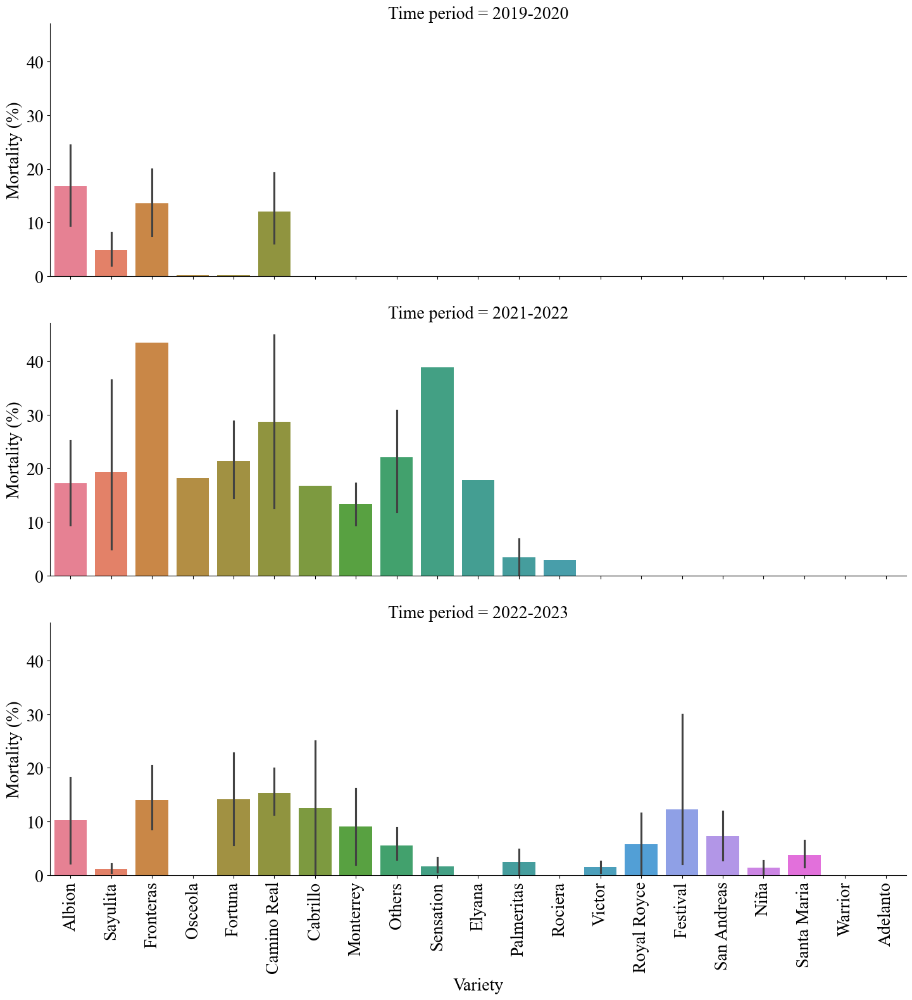

In [567]:
sns.catplot(data=variety,x='Variety',y='Mortality (%)',col='Time period',col_wrap=1,hue='Variety',kind='bar', height=5, aspect=3)
plt.xticks(rotation=90)

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
 [Text(0, 0, 'Albion'),
  Text(1, 0, 'Sayulita'),
  Text(2, 0, 'Fronteras'),
  Text(3, 0, 'Osceola'),
  Text(4, 0, 'Fortuna'),
  Text(5, 0, 'Sensation'),
  Text(6, 0, 'Elyana'),
  Text(7, 0, 'Others'),
  Text(8, 0, 'Palmeritas'),
  Text(9, 0, 'Niña'),
  Text(10, 0, 'Victor'),
  Text(11, 0, 'Santa Maria'),
  Text(12, 0, 'Warrior')])

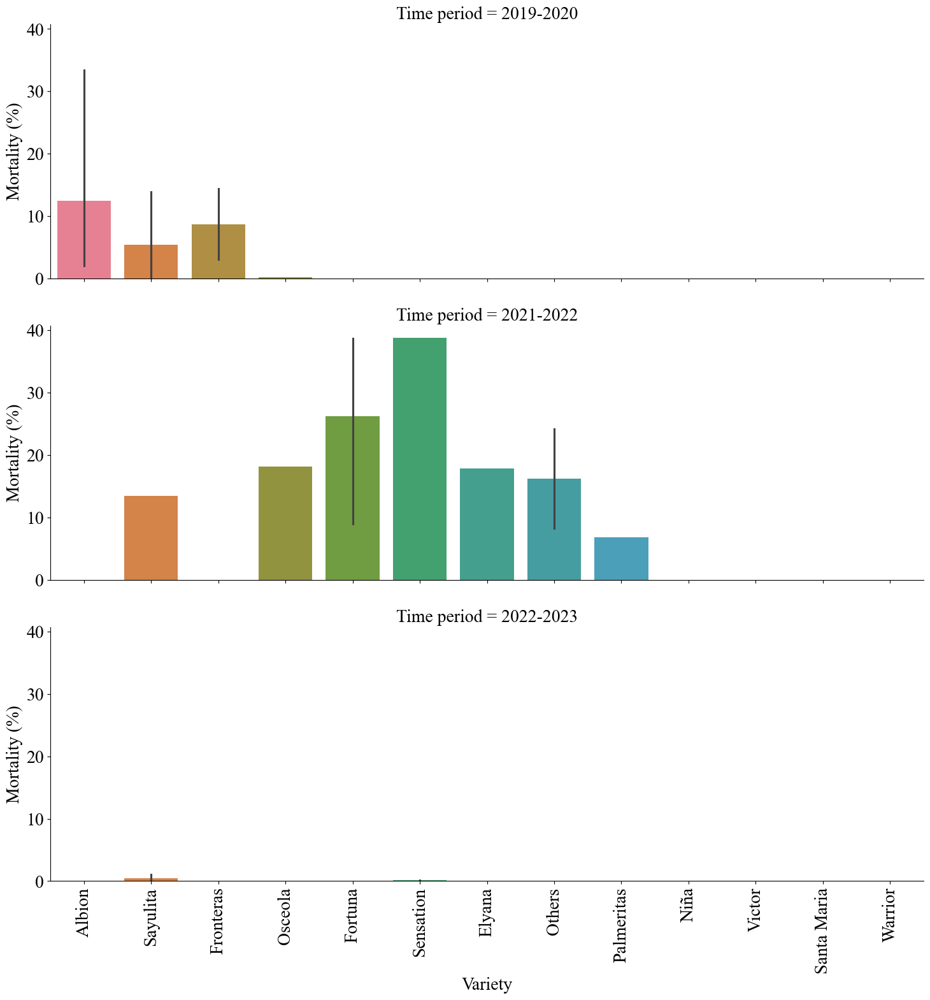

In [568]:
sns.catplot(data=variety[variety['Municipality']=='Tangancicuaro'],x='Variety',y='Mortality (%)',col='Time period',col_wrap=1,hue='Variety',kind='bar', height=5, aspect=3)
plt.xticks(rotation=90)

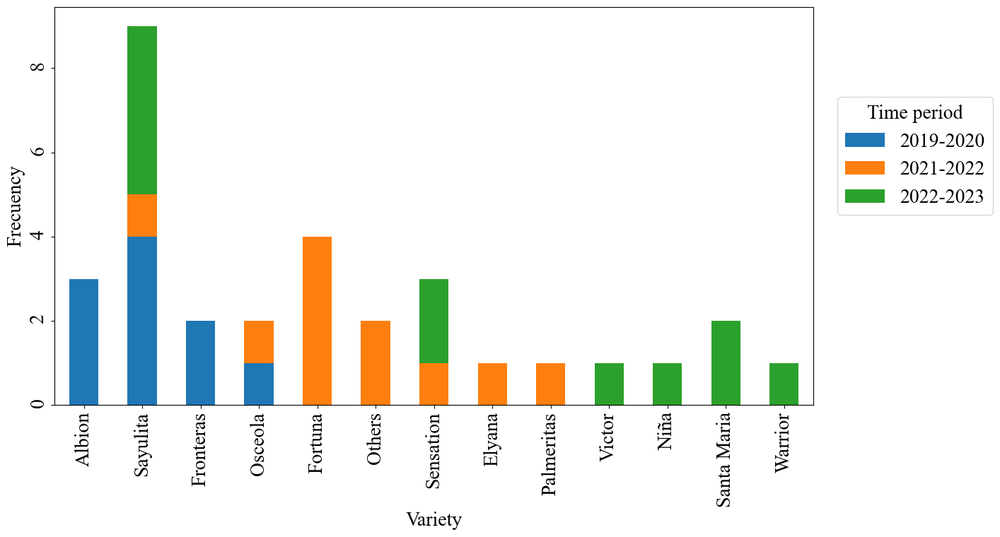

In [569]:
freq = variety[variety['Municipality']=='Tangancicuaro'].groupby(['Variety', 'Time period']).size().reset_index(name='Frequency')
freq_pivot = freq.pivot(index='Variety', columns='Time period', values='Frequency').fillna(0)
order_varieties = variety['Variety'].drop_duplicates()
freq_pivot.index = pd.CategoricalIndex(freq_pivot.index, categories=order_varieties, ordered=True)
freq_pivot = freq_pivot.sort_index()

#San Andreas,Cabrillo,Codigo se incluyen en 2019-2020 pero no se omitieron ya que habian otras var. en las fincas que eran mas frecuentes
freq_pivot.plot(kind='bar', stacked=True, figsize=(12,8))
plt.xlabel('Variety')
plt.ylabel('Frecuency')
plt.legend(title='Time period')
plt.xticks(rotation=90)
plt.yticks(rotation=90)
plt.tight_layout()
plt.legend(bbox_to_anchor=(1.25,0.8), title='Time period')
plt.show()

In [570]:
variety = variety.reset_index(drop=True)
variety.columns

Index(['Variety', 'Mortality (%)', 'Municipality', 'Time period'], dtype='object')

<Axes: xlabel='Mortality (%)', ylabel='Municipality'>

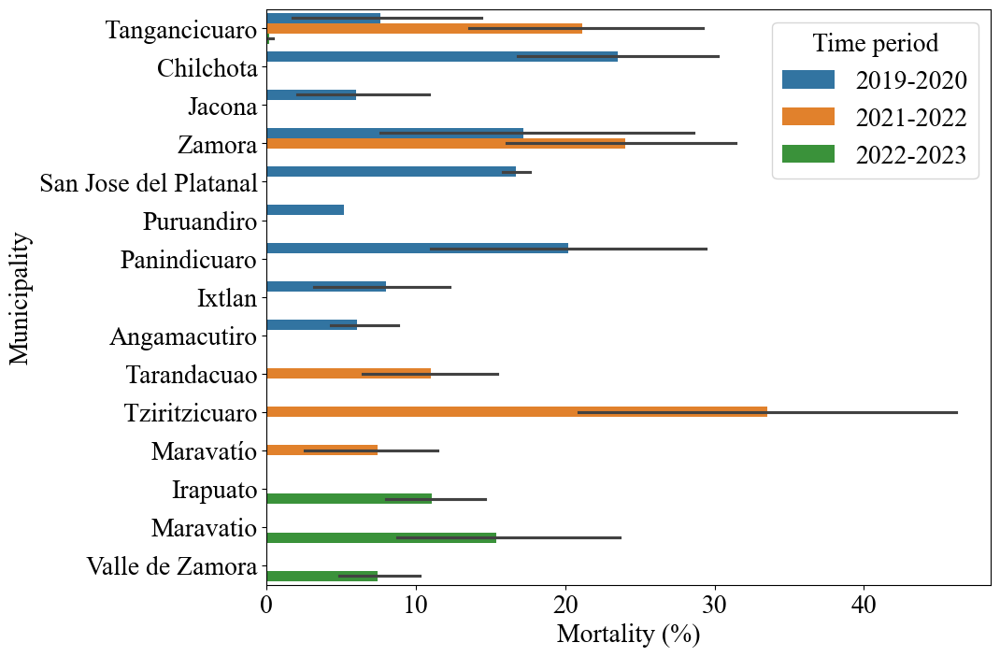

In [571]:
plt.figure(figsize=(10,8))
sns.barplot(data=variety,x='Mortality (%)',y='Municipality',hue='Time period')

Getis ord* (Hot spots) analysis

In [572]:
from shapely.geometry import Point
import libpysal as ps
from esda import getisord

In [573]:
coors19_20 = Dcrudos_19_20[['Latitud','Longitud','mortalidad']].copy()
coors19_20.columns = ['Latitud','Longitud','Mortality (%)']
coors19_20['Time period'] = '2019-2020'

coors21_22 = Data21_22[['N','W','MORTALIDAD% ']].copy()
coors21_22.columns = ['Latitud','Longitud','Mortality (%)']
coors21_22['Time period'] = '2021-2022'

coors22_23 = Data22_23[['N','W','MORTALIDAD% ']].copy()
coors22_23.columns = ['Latitud','Longitud','Mortality (%)']
coors22_23['Time period'] = '2022-2023'

coors = pd.concat([coors19_20,coors21_22,coors22_23],axis=0)

/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 3 disco

Year 2019-2020: best k=2 with 6 significance points


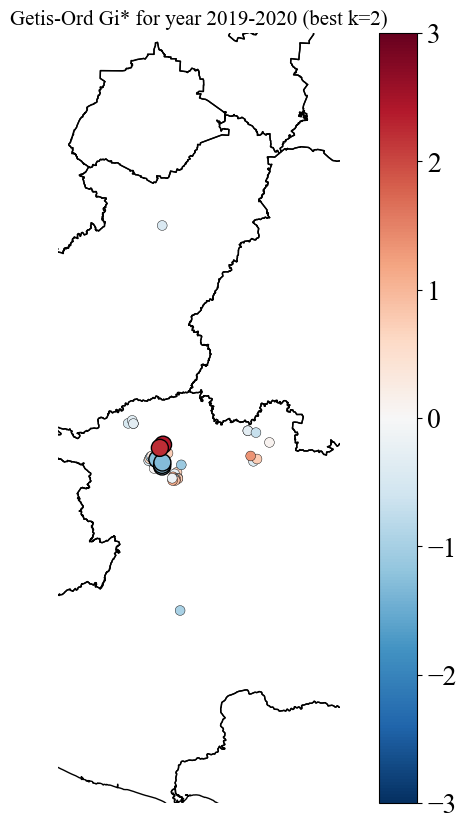

/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 8 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 4 disco

Year 2021-2022: best k=4 with 15 significance points


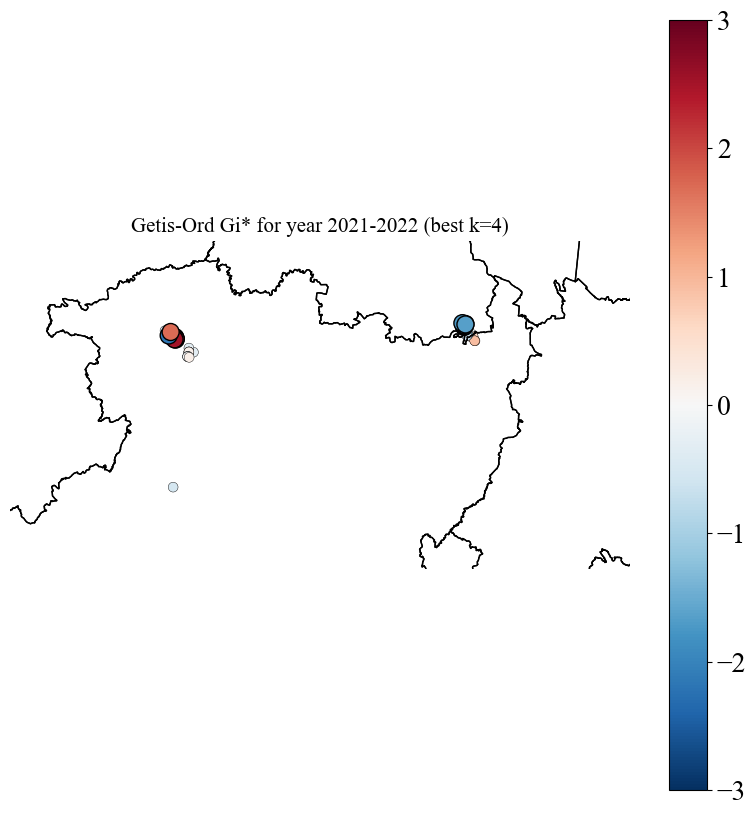

/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 23 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 11 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 10 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 9 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 7 di

Year 2022-2023: best k=7 with 56 significance points


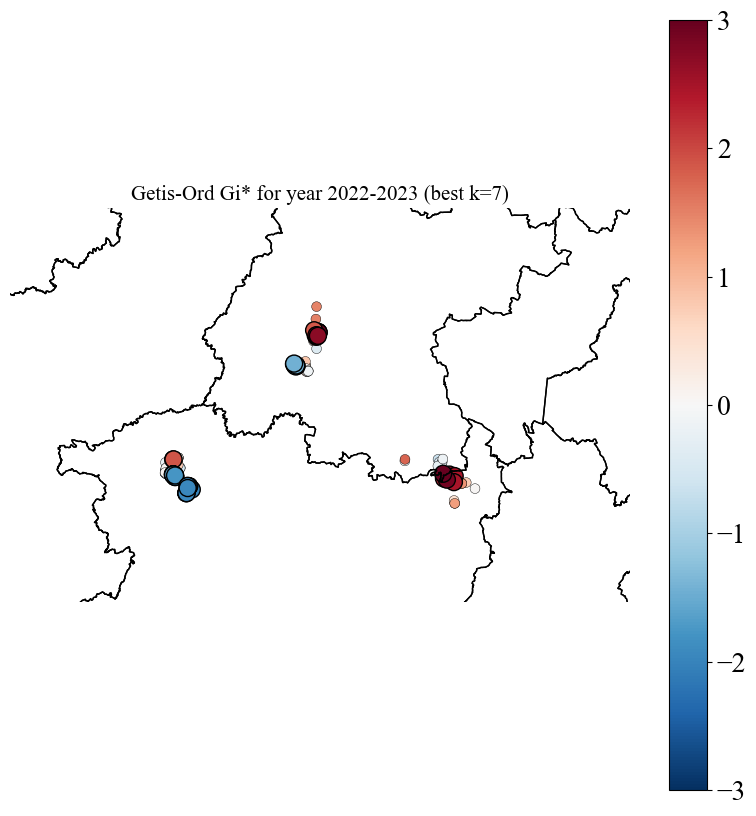

In [574]:
for year in coors['Time period'].unique():
    df_year = coors[coors['Time period'] == year].copy()

    geometry = [Point(xy) for xy in zip(df_year['Longitud'], df_year['Latitud'])]
    gdf = gpd.GeoDataFrame(df_year, geometry=geometry)

    coords = [(point.x, point.y) for point in gdf.geometry]

    best_k = None
    best_gdf = None
    max_significant = -1

    for k in range(2, 8):  
        try:
            w = ps.weights.KNN(coords, k=k)
            w.transform = 'B'

            gi_star = getisord.G_Local(gdf['Mortality (%)'].values, w, transform='B')

            gdf['GiZScore'] = gi_star.Zs
            gdf['GiPValue'] = gi_star.p_sim
            significant_count = (gdf['GiPValue'] < 0.05).sum()
            if significant_count > max_significant:
                max_significant = significant_count
                best_k = k
                best_gdf = gdf.copy()
        except Exception as e:
            print(f"Error")

    print(f"Year {year}: best k={best_k} with {max_significant} significance points")

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    cmap = plt.cm.RdBu_r

    best_gdf.plot(column='GiZScore', cmap=cmap, legend=True, ax=ax,
                  markersize=50, edgecolor='k', linewidth=0.3,vmin=-3,vmax=3)

    significant = best_gdf['GiPValue'] < 0.05
    best_gdf[significant].plot(
        ax=ax,
        column='GiZScore',  
        cmap=cmap,
        markersize=150,    
        edgecolor='black',
        linewidth=1,
        legend=False,
        vmin=-3,
        vmax=3
    )

    mexico.plot(ax=ax, color='none', edgecolor='black')  
    xmin, ymin, xmax, ymax = best_gdf.total_bounds
    xrange = xmax - xmin
    yrange = ymax - ymin

    ax.set_xlim(xmin - 0.5 * xrange, xmax + 0.5 * xrange)
    ax.set_ylim(ymin - 0.5 * yrange, ymax + 0.5 * yrange)

    ax.set_title(f'Getis-Ord Gi* for year {year} (best k={best_k})', fontsize=15)
    ax.set_axis_off() 
    
    plt.show()

/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 6 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 3 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 3 disco

Year 2019-2020: best k=2 with 6 significance points


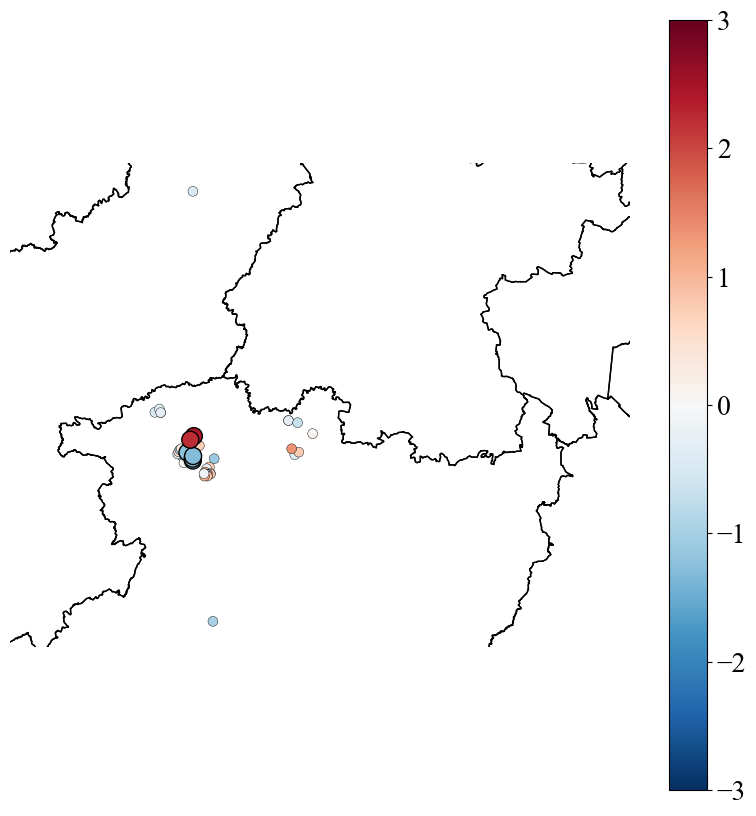

/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 8 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 5 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 4 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 4 disco

Year 2021-2022: best k=5 with 16 significance points


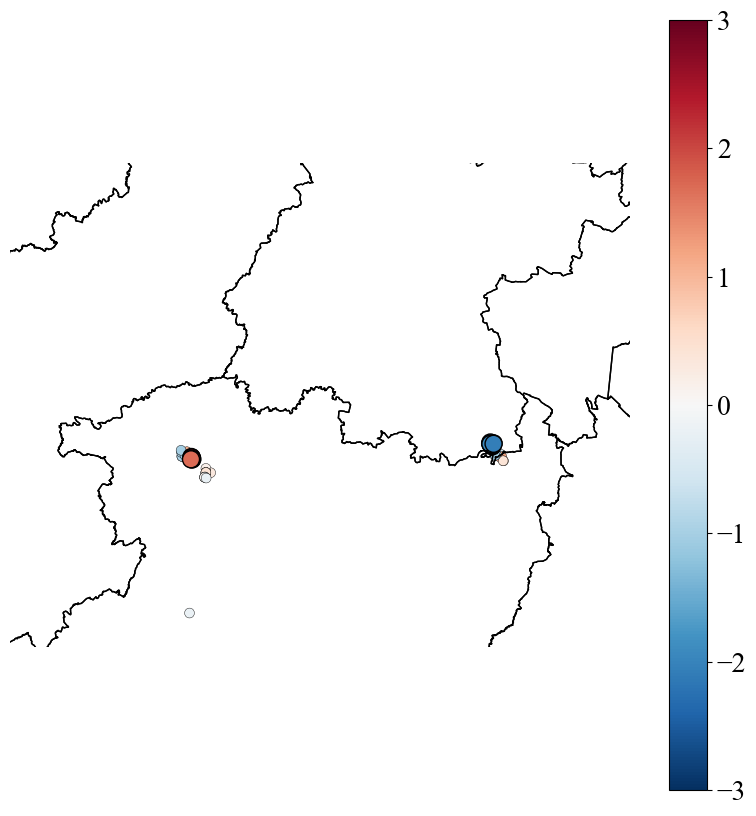

/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 23 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 11 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 10 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 9 disconnected components.
  warnings.warn(message)
/Users/user/Library/Python/3.9/lib/python/site-packages/libpysal/weights/weights.py:224: UserWarning: The weights matrix is not fully connected: 
 There are 7 di

Year 2022-2023: best k=7 with 60 significance points


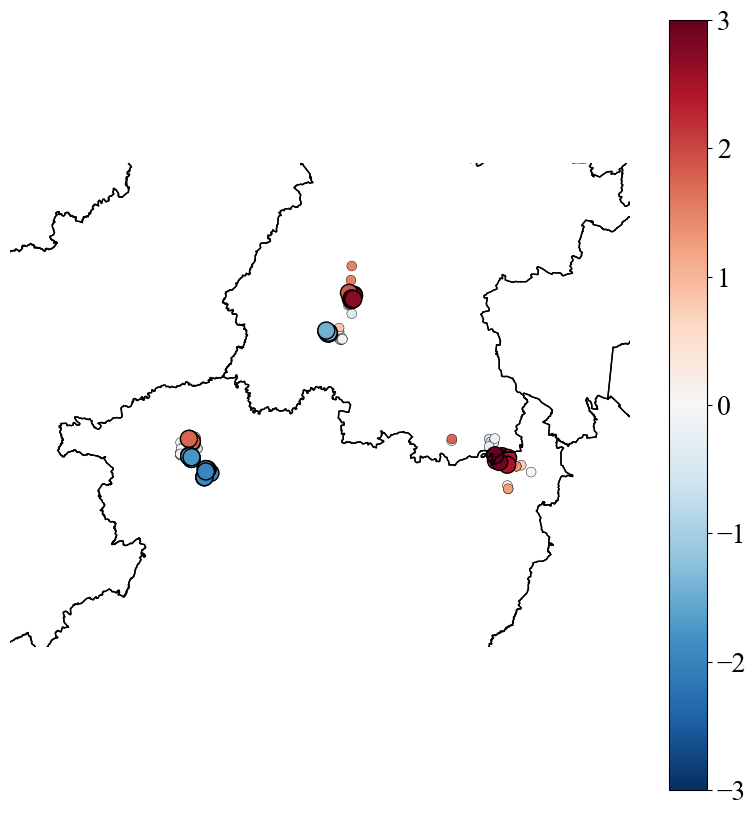

In [575]:
for year in coors['Time period'].unique():
    df_year = coors[coors['Time period'] == year].copy()

    geometry = [Point(xy) for xy in zip(df_year['Longitud'], df_year['Latitud'])]
    gdf = gpd.GeoDataFrame(df_year, geometry=geometry)

    coords = [(point.x, point.y) for point in gdf.geometry]

    best_k = None
    best_gdf = None
    max_significant = -1

    for k in range(2, 8):  
        try:
            w = ps.weights.KNN(coords, k=k)
            w.transform = 'B'

            gi_star = getisord.G_Local(gdf['Mortality (%)'].values, w, transform='B')

            gdf['GiZScore'] = gi_star.Zs
            gdf['GiPValue'] = gi_star.p_sim
            significant_count = (gdf['GiPValue'] < 0.05).sum()
            if significant_count > max_significant:
                max_significant = significant_count
                best_k = k
                best_gdf = gdf.copy()
        except Exception as e:
            print(f"Error")

    print(f"Year {year}: best k={best_k} with {max_significant} significance points")

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    cmap = plt.cm.RdBu_r

    best_gdf.plot(column='GiZScore', cmap=cmap, legend=True, ax=ax,
                  markersize=50, edgecolor='k', linewidth=0.3,vmin=-3,vmax=3)

    significant = best_gdf['GiPValue'] < 0.05
    best_gdf[significant].plot(
        ax=ax,
        column='GiZScore',  
        cmap=cmap,
        markersize=150,    
        edgecolor='black',
        linewidth=1,
        legend=False,
        vmin=-3,
        vmax=3
    )

    mexico.plot(ax=ax, color='none', edgecolor='black')  
    xmin, ymin, xmax, ymax = best_gdf.total_bounds
    xrange = xmax - xmin
    yrange = ymax - ymin

    ax.set_xlim(-103.33, -99.73)
    ax.set_ylim(18.95, 21.52)
    ax.set_axis_off() 
    
    plt.show()

In [576]:
coors.to_csv('./coors_kernel.csv')

Kernel density

In [577]:
coors = pd.read_csv('./spots_kernel.csv')

In [578]:
conditions = [
    (coors['Time period'] == '2019-2020'),
    (coors['Time period'] == '2021-2022') & (coors['Longitud'] < -101),
    (coors['Time period'] == '2021-2022') & (coors['Longitud'] >= -101),
    (coors['Time period'] == '2022-2023') & (coors['Latitud'] > 20.5),
    (coors['Time period'] == '2022-2023') & (coors['Latitud'] <= 20.5) & (coors['Longitud'] < -102),
    (coors['Time period'] == '2022-2023') & (coors['Latitud'] <= 20.5) & (coors['Longitud'] >= -102)
]
choices = ['A1', 'B1', 'B2', 'C3', 'C1', 'C2']
coors['Group'] = np.select(conditions, choices, default='NA')

In [579]:
from sklearn.neighbors import KernelDensity
from shapely.geometry import box
from sklearn.model_selection import GridSearchCV
from rasterio.transform import from_bounds
import rasterio

In [580]:
coors.columns

Index(['field_1', 'Latitud', 'Longitud', 'Mortality (%)', 'Time period',
       'Group'],
      dtype='object')

/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarnin

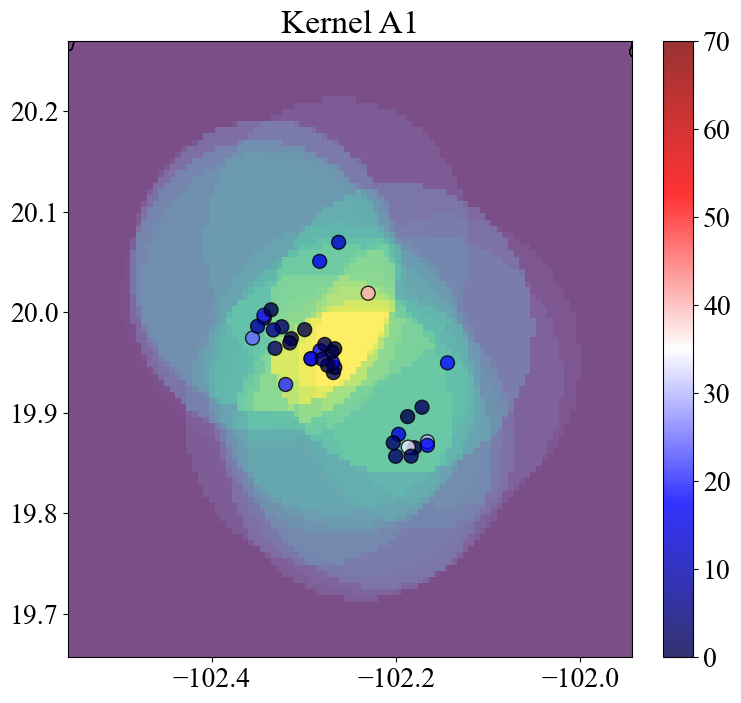

/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(


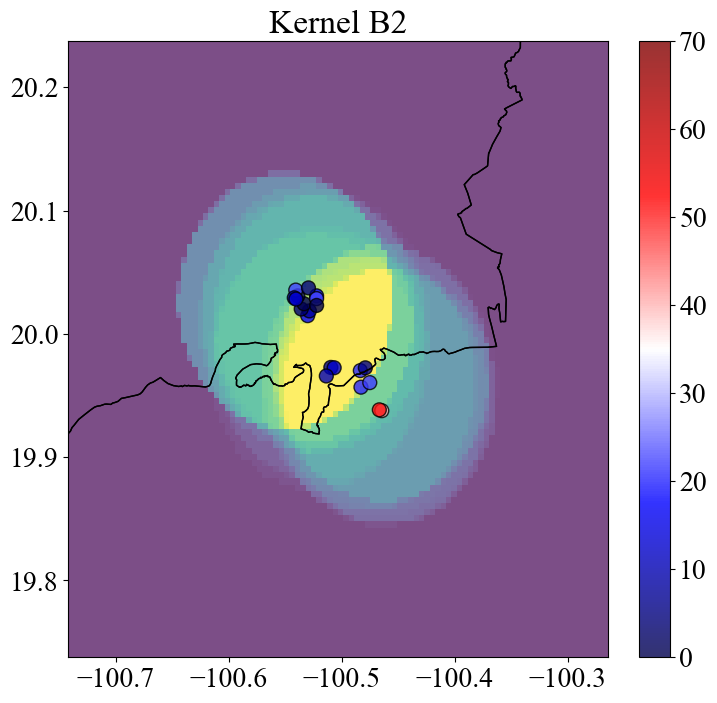

/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarnin

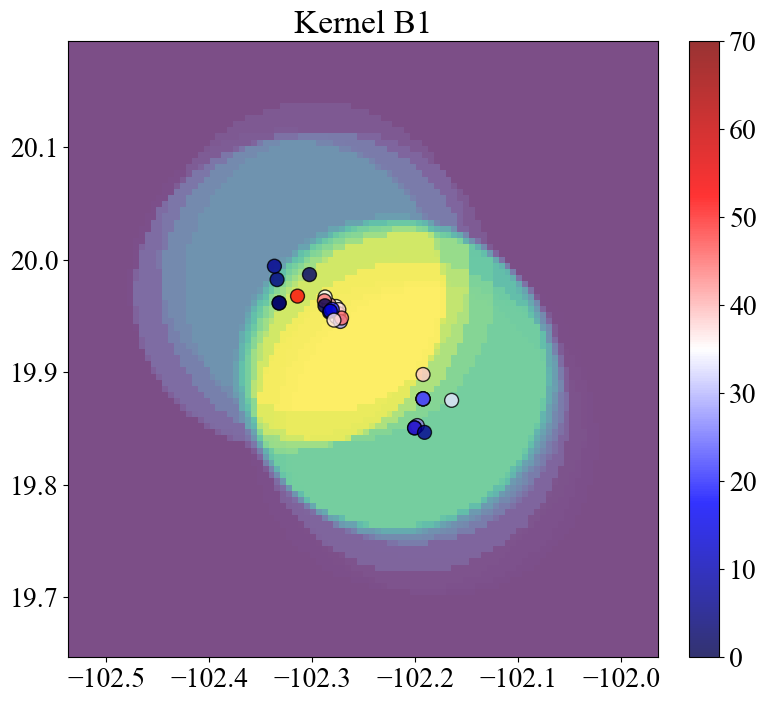

/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_search.py:1051: UserWarning: One or more of the test scores are non-finite: [       -inf        -inf 16.84881858 15.79812184 15.77513204 15.24617829
 14.53582211 13.84026616 13.24740276 12.31953789 11.48271457 10.70316198
  9.99804259  9.31320615  8.61522594  7.91852505  7.25342369  6.61717935
  6.00739176  5.42194818  4.85897928  4.3168231   3.79399547  3.28916552
  2.80113528  2.32882255  1.87124645  1.42751512  0.99681533  0.57840344
  0.1715977  -0.22422842 -0.60965206 -0.98520601 -1.35138314 -1.70864032
 -2.0574018  -2.39806227 -2.73098956 -3.05652696 -3.37499545 -3.68669549
 -3.99190882 -4.29089992 -4.58391743 -4.87119539 -5.15295432 -5.42940229
 -5.70073583 -5.96714073 -6.22879286 -6.48585884 -6.73849667 -6.98685632
 -7.23108028 -7.47130403 -7.7076565  -7.9402605  -8.16923306 -8.39468583]
  warnings.warn(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/model_selection/_search.py:1062

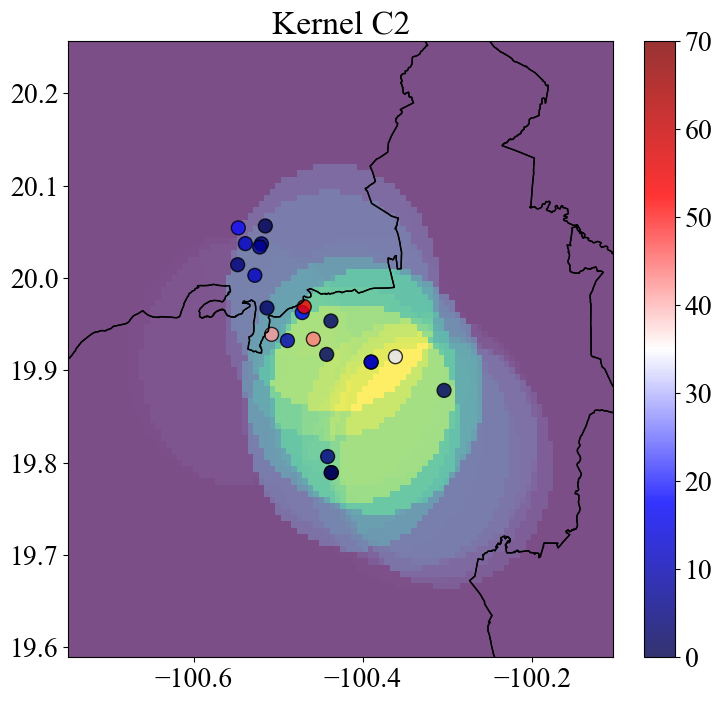

/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarnin

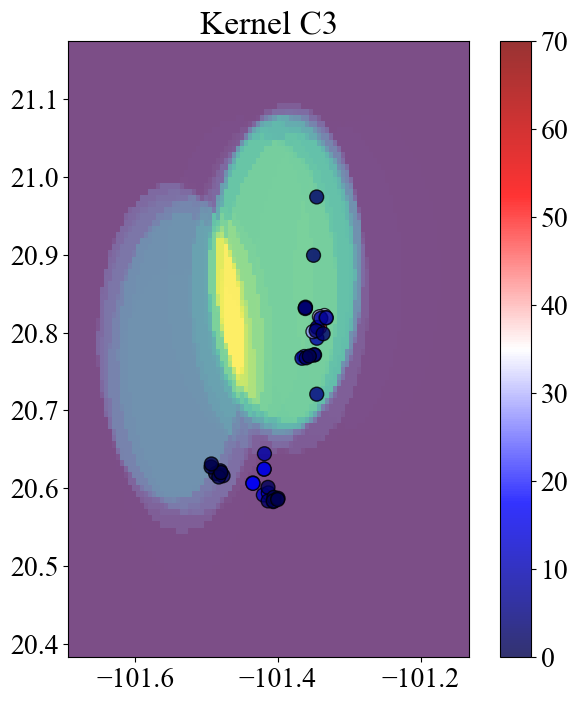

/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarning: divide by zero encountered in log
  log_density = self.tree_.kernel_density(
/Users/user/Library/Python/3.9/lib/python/site-packages/sklearn/neighbors/_kde.py:271: RuntimeWarnin

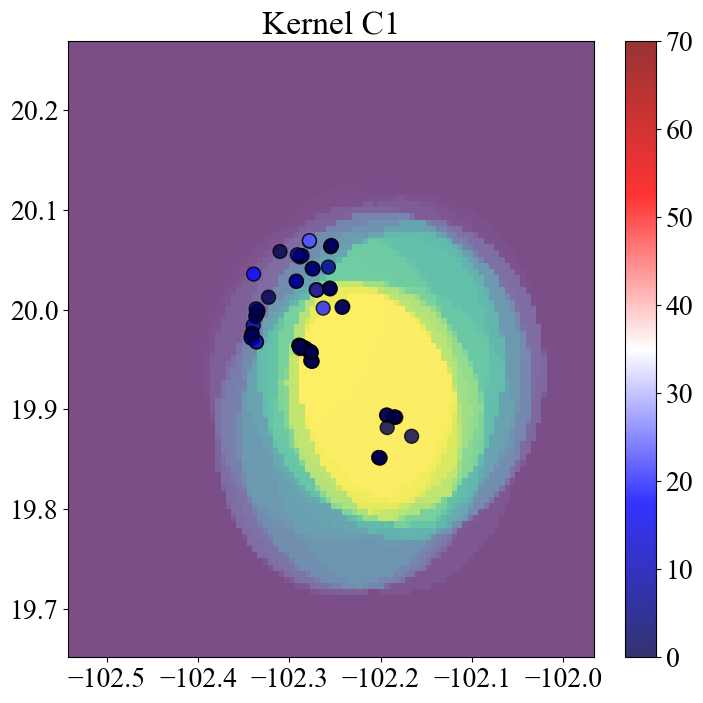

In [581]:
for group in coors['Group'].unique():
    data_s = coors[coors['Group'] == group]
    data1 = data_s.copy()
        
    if len(data1) > 2:
        bandwidth = np.linspace(0.1, 1.0, 60)
        params = {'bandwidth': bandwidth}
        prueba = data1[['Longitud', 'Latitud', 'Group', 'Mortality (%)']]
        X = prueba[['Longitud', 'Latitud']].values
            
        kde = KernelDensity(kernel='tophat')
        grid_search = GridSearchCV(kde, params, cv=3)
        grid_search.fit(X, sample_weight=prueba['Mortality (%)'])
        best_bandwidth = grid_search.best_estimator_.bandwidth
            
        kde = KernelDensity(kernel='tophat', bandwidth=best_bandwidth).fit(X, sample_weight=prueba['Mortality (%)'])

        x_min, x_max = prueba['Longitud'].min() - 0.2, prueba['Longitud'].max() + 0.2
        y_min, y_max = prueba['Latitud'].min() - 0.2, prueba['Latitud'].max() + 0.2

        x_grid, y_grid = np.mgrid[x_min:x_max:100j, y_min:y_max:100j]
        grid_points = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

        log_density = kde.score_samples(grid_points)
        density = np.exp(log_density).reshape(x_grid.shape)

        transform = from_bounds(x_min, y_max, x_max, y_min, density.shape[1], density.shape[0])

        with rasterio.open(
            f'density_{group}.tiff',
            'w',
            driver='GTiff',
            height=density.shape[0],
            width=density.shape[1],
            count=1,
            dtype=density.dtype,
            crs="EPSG:4326",
            transform=transform,
            ) as dst:
                dst.write(density, 1)

        fig, ax = plt.subplots(figsize=(10, 8))
        im = ax.imshow(density, extent=(x_min, x_max, y_min, y_max), origin='lower', cmap='viridis', alpha=0.7)
            
        scatter = ax.scatter(prueba['Longitud'], prueba['Latitud'], c=prueba['Mortality (%)'], s=100,
                                 edgecolor='k', cmap='seismic', alpha=0.8, vmin=0, vmax=70)
        cbar = plt.colorbar(scatter, orientation='vertical', fraction=0.04, pad=0.04)

        mexico.plot(ax=ax, color='none', edgecolor='black')

        plt.xlim(x_min, x_max)
        plt.ylim(y_min, y_max)
        plt.title(f'Kernel {group}')
        plt.show()

IDW

In [582]:
from scipy.spatial import cKDTree
from scipy.ndimage import gaussian_filter
from shapely.geometry import Point

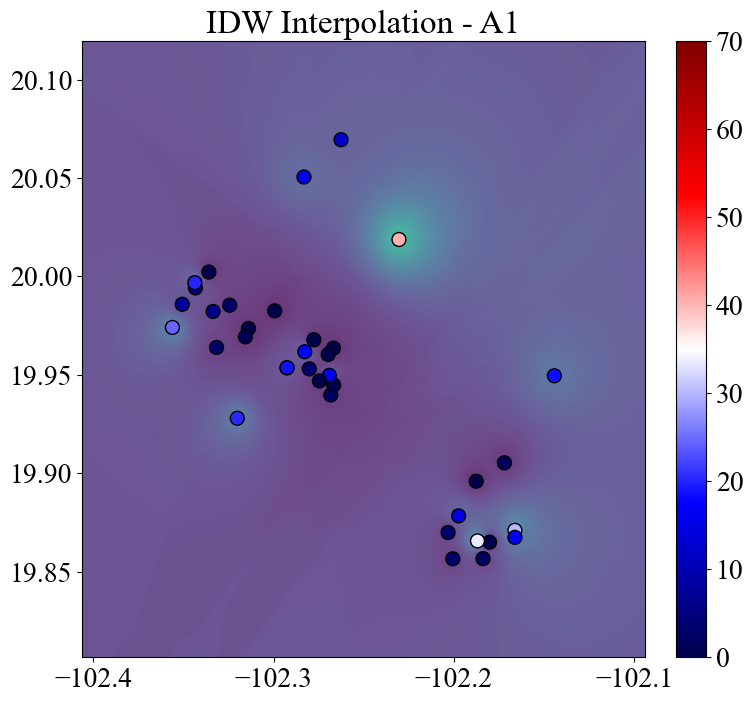

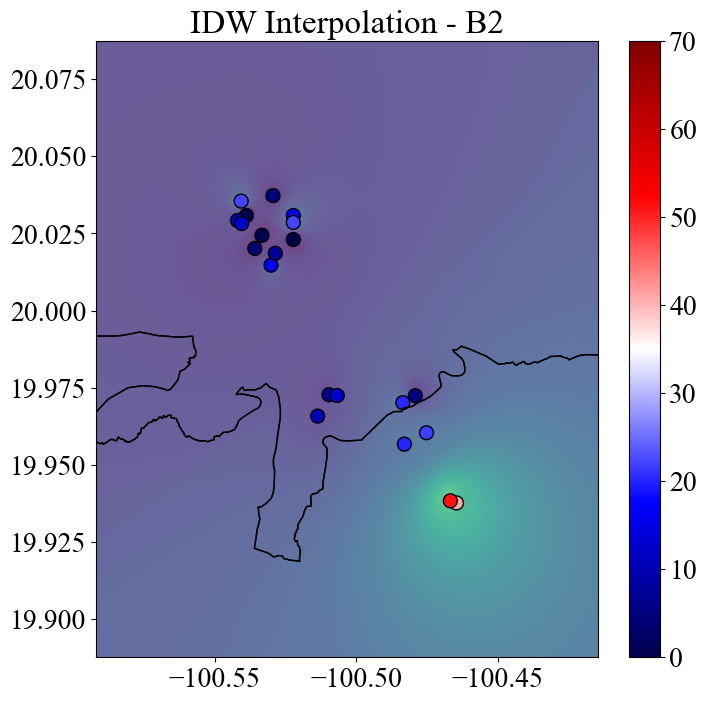

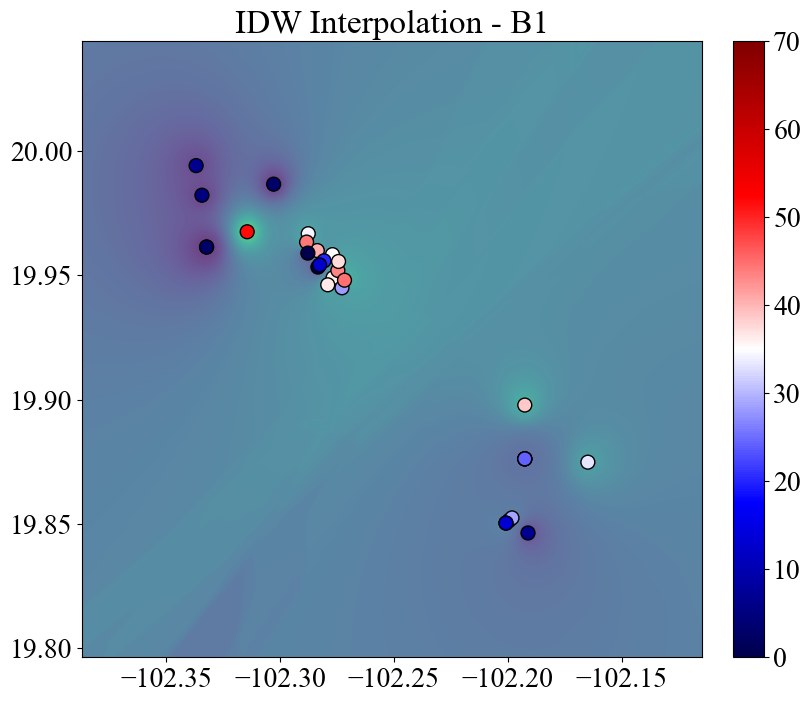

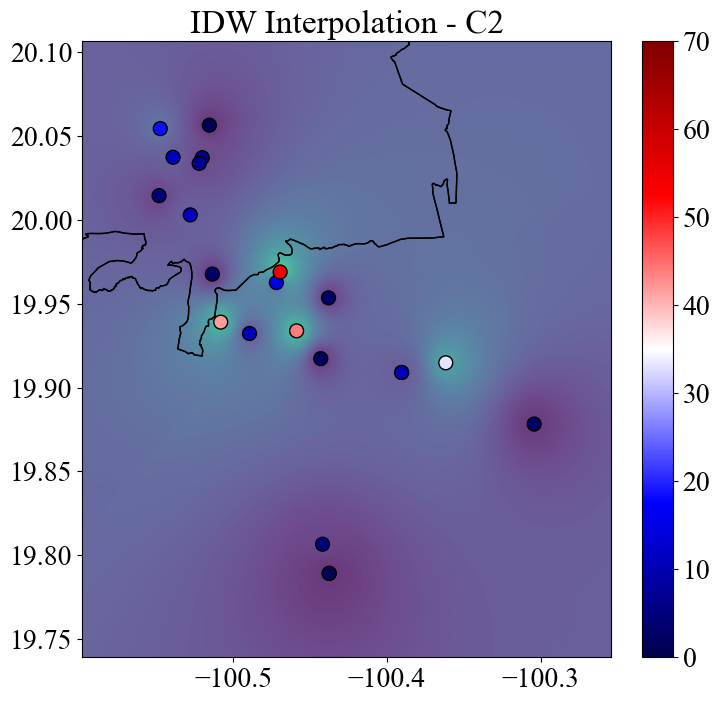

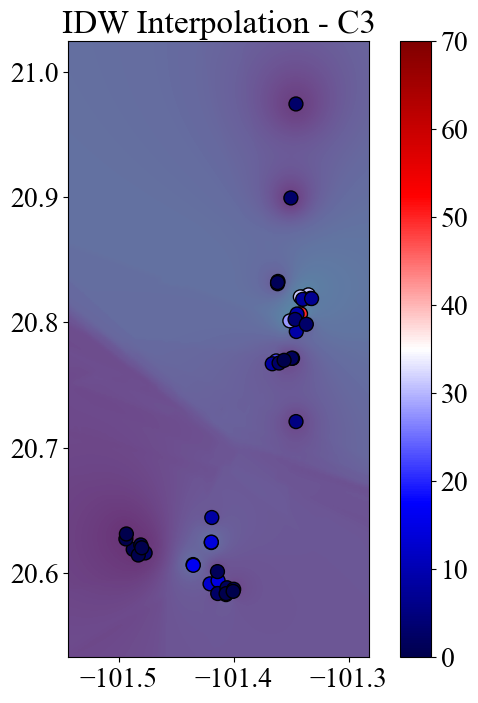

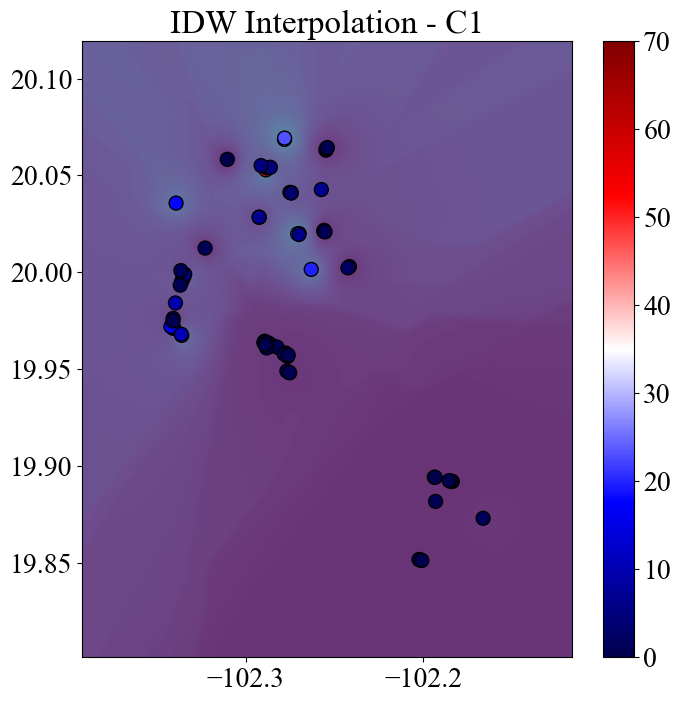

In [583]:
def idw_interpolation(xy_obs, values, xy_grid, k=20, power=2):
    tree = cKDTree(xy_obs)
    dists, idxs = tree.query(xy_grid, k=k)
    dists[dists == 0] = 1e-10 
    weights = 1 / dists**power
    weights /= weights.sum(axis=1)[:, None]
    interpolated = np.sum(weights * values[idxs], axis=1)
    return interpolated

for group in coors['Group'].unique():
    data_s = coors[coors['Group'] == group]
    data1 = data_s.copy()

    if len(data1) > 2:
        prueba = data1[['Longitud', 'Latitud', 'Group', 'Mortality (%)']]
        xy_obs = prueba[['Longitud', 'Latitud']].values
        values = prueba['Mortality (%)'].values

        x_min, x_max = xy_obs[:, 0].min() - 0.05, xy_obs[:, 0].max() + 0.05
        y_min, y_max = xy_obs[:, 1].min() - 0.05, xy_obs[:, 1].max() + 0.05
        x_grid, y_grid = np.mgrid[x_min:x_max:300j, y_min:y_max:300j]
        grid_points = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

        idw_values = idw_interpolation(xy_obs, values, grid_points, k=20, power=2)
        idw_grid = idw_values.reshape(x_grid.shape)
        idw_smooth = gaussian_filter(idw_grid, sigma=1)
        transform = from_bounds(x_min, y_max, x_max, y_min, idw_smooth.shape[1], idw_smooth.shape[0])
        with rasterio.open(
            f'idw_{group}.tiff',
            'w',
            driver='GTiff',
            height=idw_smooth.shape[0],
            width=idw_smooth.shape[1],
            count=1,
            dtype='float32',
            crs="EPSG:4326",
            transform=transform
        ) as dst:
            dst.write(idw_smooth.astype('float32'), 1)

        fig, ax = plt.subplots(figsize=(10, 8))
        im = ax.imshow(idw_smooth.T, extent=(x_min, x_max, y_min, y_max), origin='lower',
                       cmap='viridis', alpha=0.8, vmin=0, vmax=70)

        scatter = ax.scatter(prueba['Longitud'], prueba['Latitud'], c=prueba['Mortality (%)'], s=100,
                             edgecolor='k', cmap='seismic', alpha=1.0, vmin=0, vmax=70)
        plt.colorbar(scatter, ax=ax, orientation='vertical', fraction=0.04, pad=0.04)

        try:
            mexico.plot(ax=ax, color='none', edgecolor='black')
        except:
            pass 

        plt.xlim(x_min, x_max)
        plt.ylim(y_min, y_max)
        plt.title(f'IDW Interpolation - {group}')
        plt.show()

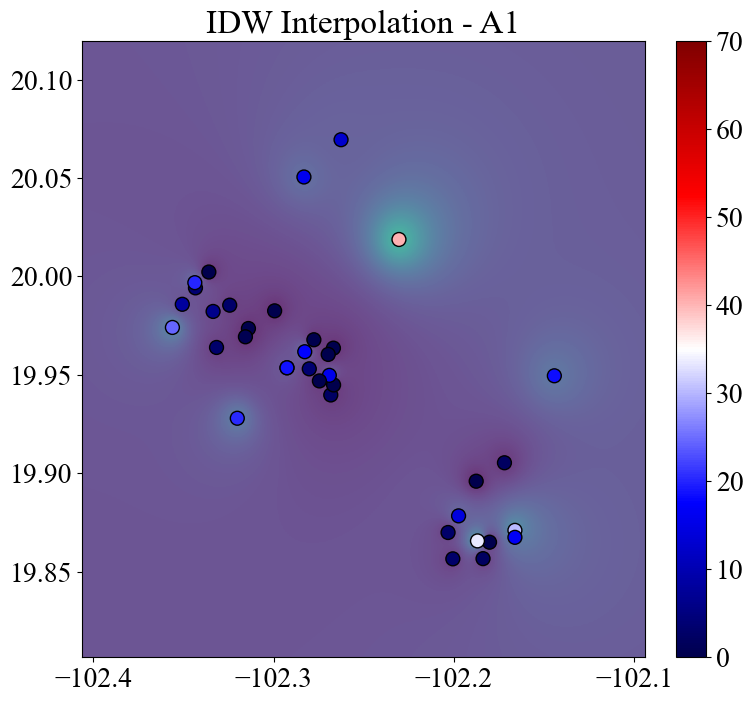

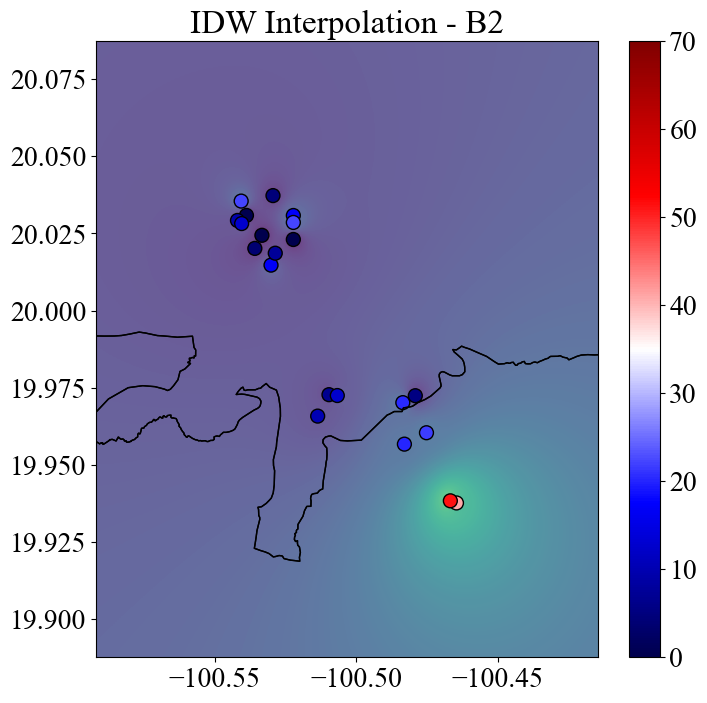

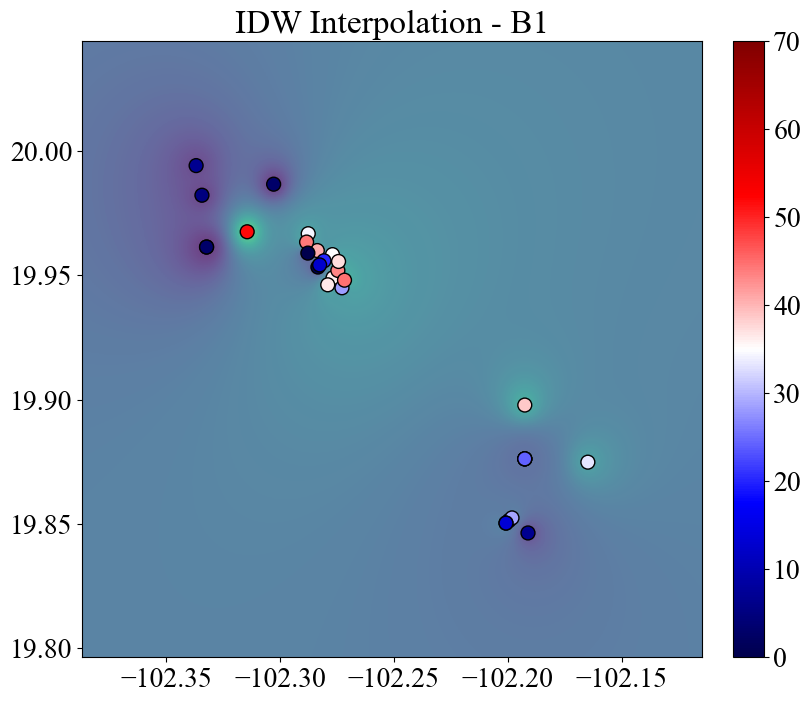

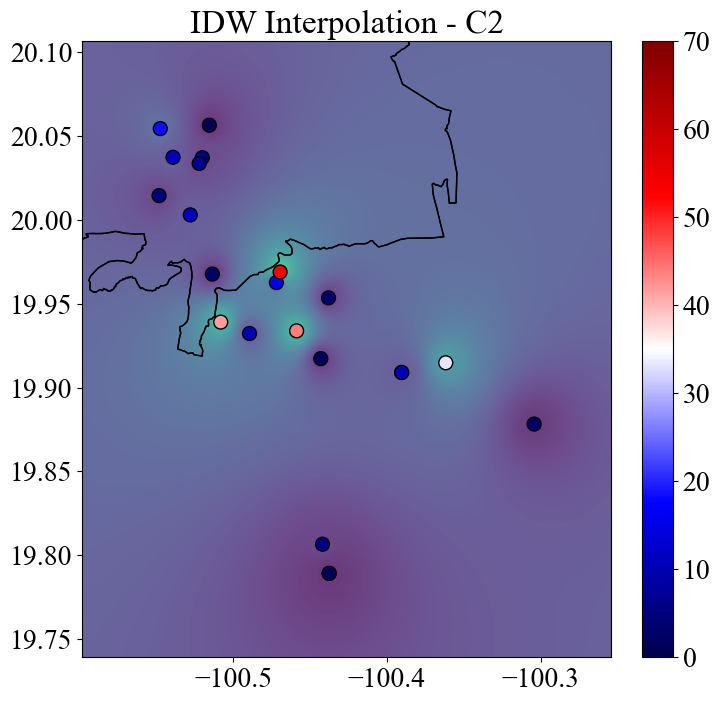

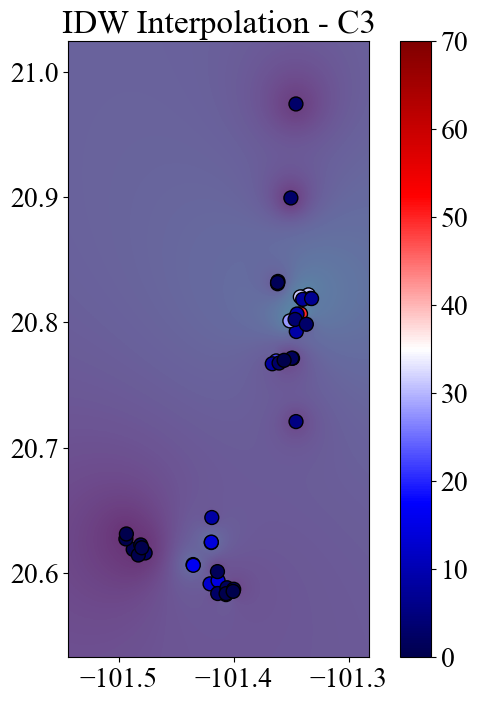

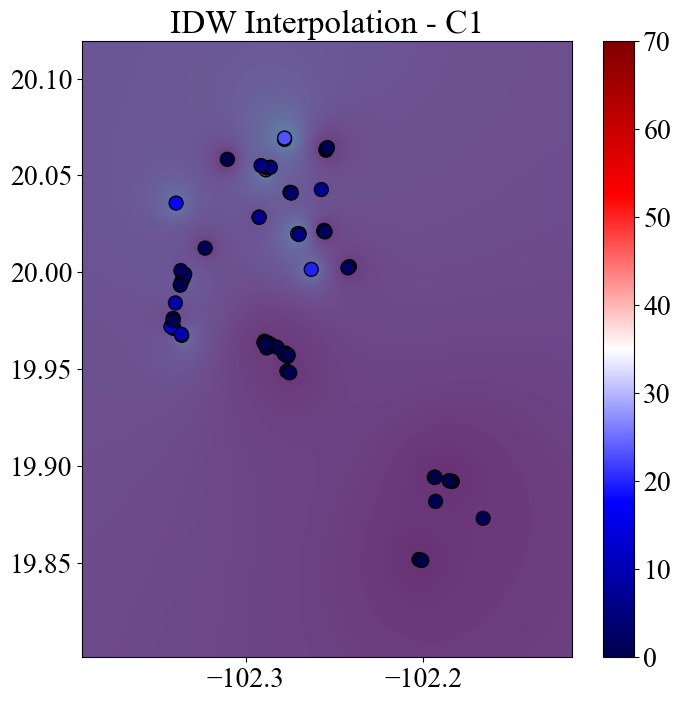

In [584]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter
import rasterio
from rasterio.transform import from_bounds

# Función IDW sin vecinos limitados: usa todos los puntos observados
def idw_interpolation_all_points(xy_obs, values, xy_grid, power=2):
    # Calcular distancias entre cada punto de la malla y todos los puntos observados
    diff = xy_grid[:, None, :] - xy_obs[None, :, :]  # (num_grid, num_obs, 2)
    dists = np.linalg.norm(diff, axis=2)  # (num_grid, num_obs)

    # Evitar división por cero para puntos coincidentes
    dists[dists == 0] = 1e-10

    # Calcular pesos inversos a la distancia elevada a la potencia
    weights = 1 / dists**power

    # Normalizar pesos para que sumen 1
    weights /= weights.sum(axis=1)[:, None]

    # Calcular valores interpolados como promedio ponderado
    interpolated = np.sum(weights * values[None, :], axis=1)

    return interpolated

# Suponiendo que tienes un DataFrame 'coors' con columnas:
# 'Longitud', 'Latitud', 'Group', 'Mortality (%)'
# Y un GeoDataFrame 'mexico' para el mapa (opcional)

for group in coors['Group'].unique():
    data_s = coors[coors['Group'] == group]
    data1 = data_s.copy()

    if len(data1) > 2:
        prueba = data1[['Longitud', 'Latitud', 'Group', 'Mortality (%)']]
        xy_obs = prueba[['Longitud', 'Latitud']].values
        values = prueba['Mortality (%)'].values

        # Definir límites del grid con un pequeño margen
        x_min, x_max = xy_obs[:, 0].min() - 0.05, xy_obs[:, 0].max() + 0.05
        y_min, y_max = xy_obs[:, 1].min() - 0.05, xy_obs[:, 1].max() + 0.05

        # Crear malla de puntos donde se interpolará
        x_grid, y_grid = np.mgrid[x_min:x_max:300j, y_min:y_max:300j]
        grid_points = np.vstack([x_grid.ravel(), y_grid.ravel()]).T

        # Interpolación IDW sin vecinos limitados
        idw_values = idw_interpolation_all_points(xy_obs, values, grid_points, power=2)
        idw_grid = idw_values.reshape(x_grid.shape)

        # Suavizado opcional con filtro gaussiano
        idw_smooth = gaussian_filter(idw_grid, sigma=1)

        # Definir transformada geográfica para el raster
        transform = from_bounds(x_min, y_min, x_max, y_max, idw_smooth.shape[0], idw_smooth.shape[1])

        # Guardar raster GeoTIFF
        with rasterio.open(
            f'idw_{group}.tiff',
            'w',
            driver='GTiff',
            height=idw_smooth.shape[0],
            width=idw_smooth.shape[1],
            count=1,
            dtype='float32',
            crs="EPSG:4326",
            transform=transform
        ) as dst:
            dst.write(idw_smooth.astype('float32'), 1)

        # Visualización
        fig, ax = plt.subplots(figsize=(10, 8))
        im = ax.imshow(idw_smooth.T, extent=(x_min, x_max, y_min, y_max), origin='lower',
                       cmap='viridis', alpha=0.8, vmin=0, vmax=70)

        scatter = ax.scatter(prueba['Longitud'], prueba['Latitud'], c=prueba['Mortality (%)'], s=100,
                             edgecolor='k', cmap='seismic', alpha=1.0, vmin=0, vmax=70)
        plt.colorbar(scatter, ax=ax, orientation='vertical', fraction=0.04, pad=0.04)

        try:
            mexico.plot(ax=ax, color='none', edgecolor='black')
        except:
            pass

        plt.xlim(x_min, x_max)
        plt.ylim(y_min, y_max)
        plt.title(f'IDW Interpolation - {group}')
        plt.show()


CATPCA

In [585]:
pip install prince

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.
Note: you may need to restart the kernel to use updated packages.


In [586]:
import prince

In [165]:
entrevistas23.columns

Index(['Y', 'X', 'UNIDAD DE MUESTREO', 'NUMERO DE PARCELA',
       'NOMBRE DE PARCELA', 'VARIEDAD', 'TIPO DE PLANTACION', 'INCIDENCIA ',
       'SEVERIDAD', 'MORTALIDAD', 'FECHA DE MUESTREO', 'PRODUCTOR', 'CONTACTO',
       'CODIGO HOJA', 'SUPERFICIE', 'DENSIDAD', 'FECHA DE SIEMBRA', 'Columna1',
       'MODALIDAD', 'TEMPORADA', 'ORIGEN DE LA PLANTA', 'PUESTA DE TUNEL',
       'TIPO DE RIEGO', 'FERTILIZACION', 'ASESORIA TECNICA', 'EMPRESA',
       'ANTECEDENTES FITOPAT', 'TRATAMIENTO PRE', 'productos utilizados PRE',
       'Ingrediente pre', 'TRATAMIENTO POST', 'productos utilizados POST',
       'Ingrediente pos', 'fungus', 'Duponchelia', 'Replante', 'Perdida',
       'COSTOS EN P&E', 'CULTIVO ANTERIOR', 'TEXTURA',
       'HUMEDAD AL MUESTREO (1-5)'],
      dtype='object')

In [166]:
entrevistas23['MODALIDAD'] = entrevistas23['MODALIDAD'].replace({'Raiz Desnuda':'Bare Roots', 
                                                                 np.nan:'Not Given', 
                                                                 'Raiz Desnuda, Cepellon':'Both', 
                                                                 'Cepellon':'Plugs',
                                                                 'Raiz Desnuda, Semidirecta':'Bare Roots', 
                                                                 'Raiz Desnuda, Planta Madre':'Bare Roots'})

In [167]:
Dcrudos_19_20['CEP-R.D.'] = Dcrudos_19_20['CEP-R.D.'].replace({'R.D.':'Bare Roots',
                                                               'CEPELLON':'Plugs',
                                                               'R.D. CEPELLON':'Both'})

In [168]:
pca1920 = Dcrudos_19_20[['Latitud', 'Longitud','Variety','DIAS transplante-CUBIERTA','Ingrediente pre', 'Ingrediente pos','Ingrediente desinfección',
                         'CONDICIONES DE PARCELA','CULTIVO DE ROTACION ','CEP-R.D.','mortalidad']]
pca2223 = entrevistas23[['Y', 'X','VARIEDAD','TIPO DE PLANTACION','MORTALIDAD','DENSIDAD','PUESTA DE TUNEL','TIPO DE RIEGO', 'FERTILIZACION', 'ASESORIA TECNICA',
                         'Ingrediente pre','Ingrediente pos','MODALIDAD','CULTIVO ANTERIOR']]

pca1920.columns = ['Latitude', 'Longitude', 'Variety', 'Days to cover','Active ingredient pre transplant', 'Active ingredient after transplant', 'Active ingredient desinfection',
                   'Field conditions', 'Rotative crop', 'Planting system', 'Mortality (%)']
pca2223.columns = ['Latitude', 'Longitude', 'Variety', 'Stage', 'Mortality (%)', 'Plant density','Days to cover', 'Irrigation', 'Fertilization', 'Technical support',
                   'Active ingredient pre transplant', 'Active ingredient after transplant', 'Planting system', 'Rotative crop']

In [205]:
entrevistas23['TIPO DE PLANTACION'].unique()

array(['VIVERO', 'COMERCIAL'], dtype=object)

In [169]:
pca1920.loc[:, 'Field conditions'] = pca1920['Field conditions'].replace({'INUNDADO': 'flooded',
                                                                          np.nan: 'Not Known',
                                                                          'RESIDUOS DE COSECHA': 'Harvest residues',
                                                                          'SINTOMAS DE PESTALOTIA EN HOJAS VIEJAS': 'Pestalotia symptoms on old leaves',
                                                                          'CUBIERTA Y ACOLCHADO': 'Cover and mulching',
                                                                          'INCORPORACION DE REPOLLO': 'Cabbage incorporation',
                                                                          'ACOLCHADO GRIS': 'Gray mulching',
                                                                          'CAL AGRICOLA ': 'Agricultural lime',
                                                                          'RESIDUOS DE MAIZ': 'Corn residues',
                                                                          'RESIDUOS DE MAIZ\nPARCELA DE SEGUNDA TEMPORADA ': 'Corn residues second season field',
                                                                          'RESIDUOS DE TRIGO': 'Wheat residues',
                                                                          'LOS SINTOMAS SE OBSEVAN EN LOS PECIOLOS Y HOJAS EXTERNAS A LA CORONA ': 'Symptoms observed on petioles and outer leaves of crown',
                                                                          'SE HA HECHO POCO REPLANTE CON RAIGON': 'Replanting with cobalt, molybdenum and phytohormones',
                                                                          'FRONTERA ESTA SOBREVIVIENDO MAS ': 'Not Known',
                                                                          'LA MITAD ESTA SIN PLASTICO': 'Half without plastic',
                                                                          'CUBIERTA COMPLETA': 'Complete cover',
                                                                          'FUNGUS SE OBSERVO A LOS 15 DIAS DESPUES DE TRSPLANTE': 'Fungus observed 15 days after transplant',
                                                                          'LA PLANTA NO PRENDIO ': 'Plant was not established',
                                                                          'REEMPLAZO LAS PLANTAS DEL VIVERO AL 100%': 'Replaced nursery plants 100%',
                                                                          'SE ESTA LLEVANDO A CABO EL REPLANTE TOTAL ': 'Total replanting underway',
                                                                          'PARA REPLANTE SE COMPRO DE PLANASA': 'Replanting plants bought from Planasa nursery',
                                                                          'MUCHAS PLANTAS MUERTAS Y GALLINA CIEGA ': 'Many dead plants and Phyllophaga spp'})
pca1920.loc[:, 'Rotative crop'] = pca1920['Rotative crop'].replace({'MAIZ':'Corn', 
                                                                    'NO':'Without rotation', 
                                                                    np.nan:'Not known', 
                                                                    'VIVERO':'Nursery', 
                                                                    '2 AÑOS SIN NADA':'Without rotation', 
                                                                    'BROCOLI':'Brocoli', 
                                                                    'MAÍZ':'Corn',
                                                                    'TRIGO':'Wheat', 
                                                                    'JITOMATE':'Tomate', 
                                                                    'GARBANZA':'Chickpea', 
                                                                    'REPOLLO':'Cabbage', 
                                                                    'PEPINO-CALABAZA':'Cucumber and cabbage',
                                                                    'AÑO DE DESCANSO':'Without rotation'})

In [170]:
def contar_ingredientes(valor):
    if not isinstance(valor, str):
        return 'One ingredient'
    ingredientes = valor.replace(' and ', ',').split(',')
    num = len([i.strip() for i in ingredientes if i.strip()])
    return 'One ingredient' if num == 1 else f'Mix_{num}'

pca1920['Amount of AI pre transplant'] = pca1920['Active ingredient pre transplant'].apply(contar_ingredientes)
pca1920['Amount of AI after transplant'] = pca1920['Active ingredient after transplant'].apply(contar_ingredientes)
pca1920['Amount of AI desinfection'] = pca1920['Active ingredient desinfection'].apply(contar_ingredientes)

/var/folders/g1/6fhcms6n0px1d6b5mxmlwwcw0000gn/T/ipykernel_57832/3112266124.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pca1920['Amount of AI pre transplant'] = pca1920['Active ingredient pre transplant'].apply(contar_ingredientes)
/var/folders/g1/6fhcms6n0px1d6b5mxmlwwcw0000gn/T/ipykernel_57832/3112266124.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pca1920['Amount of AI after transplant'] = pca1920['Active ingredient after transplant'].apply(contar_ingredientes)
/var/folders/g1/6fhcms6n0px1

In [171]:
pca2223.loc[:, 'Stage'] = pca2223['Stage'].replace({'VIVERO':'Nursery','COMERCIAL':'Comercial field'})
pca2223.loc[:, 'Days to cover'] = pca2223['Days to cover'].replace({'NO TUNEL':'Without cover', 
                                                                    ' NO TUNEL':'Without cover', 
                                                                    np.nan:'Without cover', 
                                                                    'SEPTIEMBRE':180, 
                                                                    '07. NOVIEMBRE. 2022':'124',
                                                                    'AGOSTO':120, 
                                                                    'OCTUBRE':180, 
                                                                    ' DDP':'', 
                                                                    'NOVIEMBRE':90, 
                                                                    '04. ABRIL. 2022':0,
                                                                    'DAP':0},regex=True)
pca2223.loc[:, 'Irrigation'] = pca2223['Irrigation'].replace({'RODADO':'Gravity fed',
                                                              'GOTEO':'Drip',
                                                              np.nan:'Without irrigation', 
                                                              'ASPERSION':'Sprinkler'})
pca2223.loc[:, 'Fertilization'] = pca2223['Fertilization'].replace({np.nan:'Not known', 
                                                                    'RIEGO':'Fertigation', 
                                                                    'DIRIGIDO':'Soil'})
pca2223.loc[:, 'Technical support'] = pca2223['Technical support'].replace({'SI':'Yes', 
                                                                            np.nan:'Not kown', 
                                                                            'SI ':'Yes', 
                                                                            'NO':'No'})
pca2223.loc[:, 'Rotative crop'] = pca2223['Rotative crop'].replace({'MAIZ':'Corn', 
                                                                    np.nan:'Not known', 
                                                                    'TOMATE':'Tomate', 
                                                                    'CILANTRO':'Cilantro', 
                                                                    'EJOTE':'Bean', 
                                                                    'SORGO':'Sorghum', 
                                                                    'MAIZ TRIGO':'Corn and wheat',
                                                                    'FRESA':'Strawberry', 
                                                                    'HABAS Y MAIZ':'Fava bean and corn', 
                                                                    'JITOMATE, CEBOLLA':'Tomate and onion', 
                                                                    'CALABAZA':'Pumpkin', 
                                                                    'TRIGO':'Wheat'})

In [594]:
n_components_max = min(pca1920.shape[0], pca1920.shape[1] * 2)  
famd = prince.FAMD(n_components=n_components_max, random_state=42)
famd = famd.fit(pca1920)

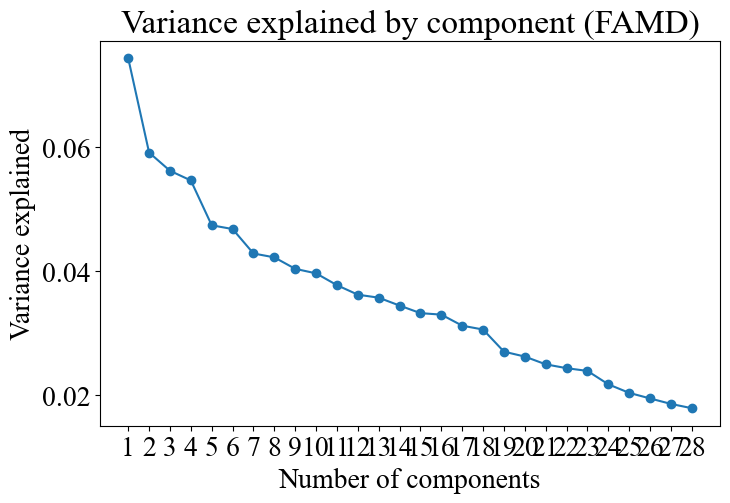

In [595]:
explained_inertia = famd.eigenvalues_ / np.sum(famd.eigenvalues_)
plt.figure(figsize=(8,5))
plt.plot(range(1, len(explained_inertia)+1), explained_inertia, marker='o')
plt.title('Variance explained by component (FAMD)')
plt.xlabel('Number of components')
plt.ylabel('Variance explained')
plt.xticks(range(1, len(explained_inertia)+1))
plt.show()

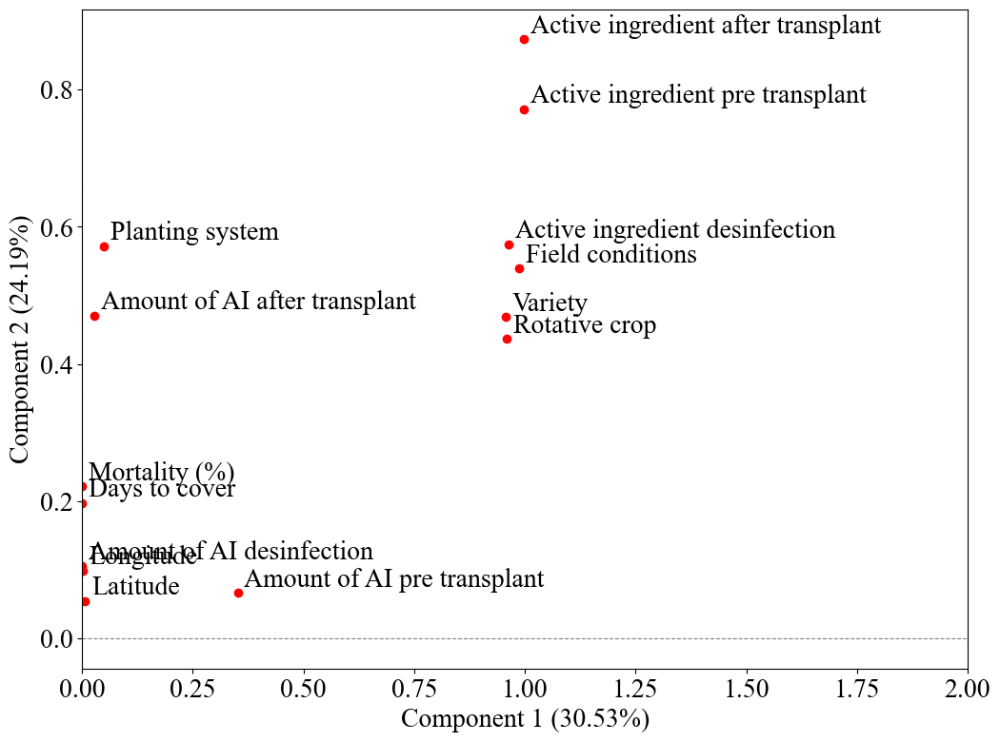

In [596]:
famd = prince.FAMD(n_components=4,
                   copy=True,
                   check_input=True,
                   random_state=2025)
famd = famd.fit(pca1920)
famd_coords = famd.transform(pca1920)

eigenvalues = famd.eigenvalues_
explained_inertia = eigenvalues / np.sum(eigenvalues)
explained_pct = explained_inertia * 100

row_coords = famd.row_coordinates(pca1920)
col_coords = famd.column_coordinates_

plt.figure(figsize=(12, 9))
plt.scatter(col_coords[0], col_coords[1], color='red', label='Variables')

for i, var_name in enumerate(col_coords.index):
    x = col_coords.iloc[i, 0]
    y = col_coords.iloc[i, 1]
    plt.annotate(var_name, (x, y), textcoords="offset points", xytext=(5,5), ha='left', color='black', fontsize=20)

plt.xlabel(f'Component 1 ({explained_pct[0]:.2f}%)')
plt.ylabel(f'Component 2 ({explained_pct[1]:.2f}%)')
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8)
plt.axvline(0, color='gray', linestyle='--', linewidth=0.8)
plt.xlim(0,2)
plt.show()

Análisis discriminante

In [ ]:
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder

In [818]:
pca1920 = pca1920.fillna('Not given')
pca2223 = pca2223.fillna('Not given')

In [819]:
pca1920['Mortality (%)'].unique()

array([ 2. ,  0. ,  0.2, 14.4, 30.2, 16.8, 33.4,  2.8,  3. ,  6.2,  3.8,
        3.2, 20.4, 24.6,  8.2, 20.2,  2.2, 15.8, 17.6,  0.8, 18.8, 12.6,
       40.2, 40. , 16. ,  5.2, 29.4, 11. , 18.4,  8.4,  6.4,  1.4,  4.6,
        5.4,  4. , 10.2])

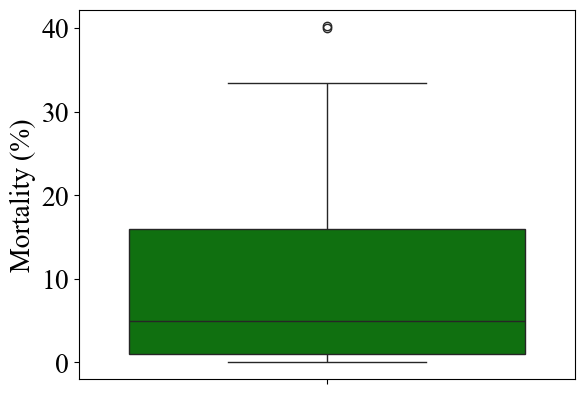

In [820]:
sns.boxplot(pca1920['Mortality (%)'],color='Green')
plt.show()

In [821]:
pca1920['Mortality (%)'].quantile([0.25,0.5,0.75])

0.25     0.95
0.50     4.90
0.75    15.95
Name: Mortality (%), dtype: float64

In [822]:
pca1920['Mortality category'] = np.select([pca1920['Mortality (%)'] == 0,
                                           (pca1920['Mortality (%)'] > 0) & (pca1920['Mortality (%)'] < 0.95),
                                           (pca1920['Mortality (%)'] >= 0.95) & (pca1920['Mortality (%)'] <= 4.90),
                                           #(pca1920['Mortality (%)'] >= 4.90) & (pca1920['Mortality (%)'] <= 15.95),
                                           pca1920['Mortality (%)'] > 4.9],
                                           ['No mortality',
                                            'Low',
                                            'Medium',
                                            #'Medium-high',
                                            'High'],default='Unclassified')

In [823]:
pca1920.columns

Index(['Latitude', 'Longitude', 'Variety', 'Days to cover',
       'Active ingredient pre transplant',
       'Active ingredient after transplant', 'Active ingredient desinfection',
       'Field conditions', 'Rotative crop', 'Planting system', 'Mortality (%)',
       'Amount of AI pre transplant', 'Amount of AI after transplant',
       'Amount of AI desinfection', 'Mortality category'],
      dtype='object')

In [824]:
X = pca1920.drop(columns=['Latitude', 'Longitude', 'Mortality (%)', 'Mortality category'])
X = pd.get_dummies(X, drop_first=True)
y = pca1920['Mortality category']

In [825]:
le = LabelEncoder()
y_encoded = le.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)
lda = LinearDiscriminantAnalysis(n_components=2)
lda.fit(X_train, y_train)
accuracy = lda.score(X_test, y_test)
print(f'Precisión del modelo LDA: {accuracy:.2f}')
y_pred = lda.predict(X_test)

Precisión del modelo LDA: 0.67


In [826]:
explained_var = lda.explained_variance_ratio_ * 100 
ld1_label = f'LD1 ({explained_var[0]:.1f}%)'
ld2_label = f'LD2 ({explained_var[1]:.1f}%)'

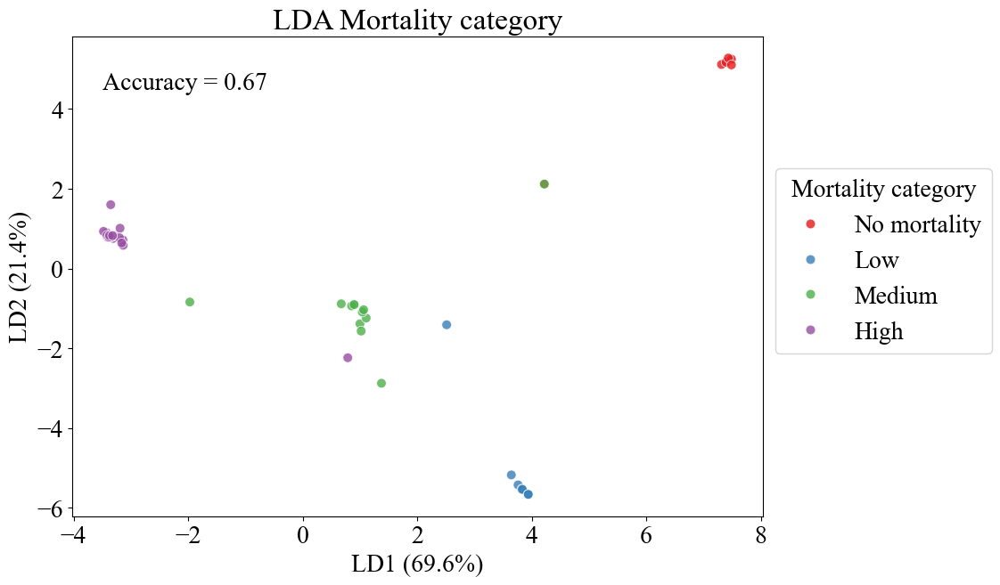

In [827]:
lda = LinearDiscriminantAnalysis(n_components=2) 
X_lda = lda.fit_transform(X, y_encoded)
df_lda = pd.DataFrame(X_lda, columns=['LD1', 'LD2'])
df_lda['Mortality category'] = y.values  

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_lda, x='LD1', y='LD2', hue='Mortality category', palette='Set1', s=60, alpha=0.8,hue_order=['No mortality','Low','Medium','High'])
plt.text(-3.5,4.5,f'Accuracy = {accuracy:.2f}')
plt.title('LDA Mortality category')
plt.xlabel(f'{ld1_label}')
plt.ylabel(f'{ld2_label}')
plt.legend(title='Mortality category',bbox_to_anchor=(1,0.75))
plt.show()

In [828]:
lda.fit(X_train, y_train)
accuracy = lda.score(X_test, y_test)
print(f'LDA Accuracy: {accuracy:.2f}')

LDA Accuracy: 0.67


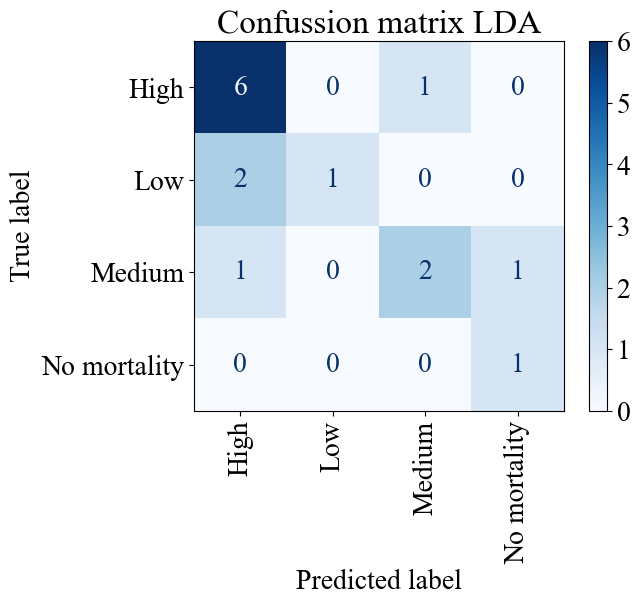

In [829]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_pred = lda.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.xticks(rotation=90)
plt.title('Confussion matrix LDA')
plt.show()


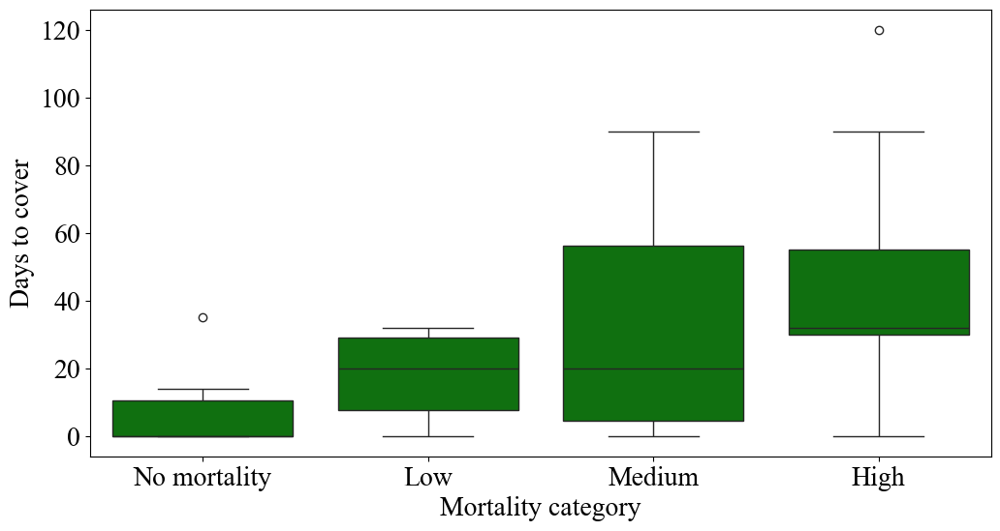

In [830]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Mortality category', y='Days to cover', data=pca1920, color='Green',order=['No mortality','Low','Medium','High'])
plt.show()


In [831]:
coef = lda.coef_
coef_df = pd.DataFrame(coef.T, index=X.columns, columns=[f'LD{i+1}' for i in range(coef.shape[0])]) #Peso componentes poir LD1 y LD2
coef_df

,LD1,LD2,LD3,LD4
Days to cover,0.019190,-0.038377,-0.016339,-0.012241
Variety_Camino Real,11.296290,-16.732231,-9.004243,-12.874070
Variety_Fortuna,-1.440989,4.915123,0.514283,0.432611
Variety_Frontera,6.066575,-6.124547,-6.457699,-6.607715
Variety_Osceola,-1.405527,8.047698,-0.358570,-0.804550
...,...,...,...,...
Amount of AI after transplant_Mix_3,0.612495,-1.670689,-0.276966,-0.425286
Amount of AI after transplant_Mix_4,1.041961,-2.013909,-0.718452,-0.990409
Amount of AI after transplant_Mix_5,0.463413,-0.803824,0.131352,-1.235390
Amount of AI after transplant_One ingredient,-0.629453,0.861608,0.638285,0.555488


In [832]:
coef_df.sort_values(by='LD1',ascending=False).head(10) #Promedio por columna 

,LD1,LD2,LD3,LD4
Variety_Camino Real,11.296290,-16.732231,-9.004243,-12.874070
Field conditions_Gray mulching,7.962241,-8.693455,-7.874264,-9.110483
Variety_Frontera,6.066575,-6.124547,-6.457699,-6.607715
Active ingredient after transplant_Captan,5.047355,-4.967598,-5.368395,-5.606967
Rotative crop_Nursery,5.047355,-4.967598,-5.368395,-5.606967
Active ingredient desinfection_Fungicides,3.976290,-11.251610,-0.700394,-4.192728
Active ingredient after transplant_Tiabendazol and Bacillus,2.928669,-2.311588,-3.199841,-3.574192
"Active ingredient pre transplant_Metalaxil-M, Mancozeb and Captan",2.928669,-2.311588,-3.199841,-3.574192
Active ingredient after transplant_Tiofanato-metilo and Tiabendazol,2.855875,-4.380603,-2.482639,-2.804445
Active ingredient after transplant_Fosetil-aluminio,2.721984,-3.720041,-2.444878,-2.911306


In [833]:
coef_df = coef_df.reset_index()
coef_df.columns = ['Group', 'LD1', 'LD2', 'LD3', 'LD4']
coef_df['Group'] = coef_df['Group'].str.extract(r'^([^_]+)')
coef_df

,Group,LD1,LD2,LD3,LD4
0,Days to cover,0.019190,-0.038377,-0.016339,-0.012241
1,Variety,11.296290,-16.732231,-9.004243,-12.874070
2,Variety,-1.440989,4.915123,0.514283,0.432611
3,Variety,6.066575,-6.124547,-6.457699,-6.607715
4,Variety,-1.405527,8.047698,-0.358570,-0.804550
...,...,...,...,...,...
93,Amount of AI after transplant,0.612495,-1.670689,-0.276966,-0.425286
94,Amount of AI after transplant,1.041961,-2.013909,-0.718452,-0.990409
95,Amount of AI after transplant,0.463413,-0.803824,0.131352,-1.235390
96,Amount of AI after transplant,-0.629453,0.861608,0.638285,0.555488


In [834]:
coef_grouped = coef_df.groupby('Group').mean()

In [835]:
coef_grouped

,LD1,LD2,LD3,LD4
Group,,,,
Active ingredient after transplant,0.222897,-0.549449,-0.177200,-0.079351
Active ingredient desinfection,-0.593929,0.080220,0.479344,1.307019
Active ingredient pre transplant,-0.057425,0.123338,0.047273,0.032423
Amount of AI after transplant,0.372104,-0.906703,-0.056445,-0.523899
Amount of AI desinfection,0.000000,0.000000,0.000000,0.000000
Amount of AI pre transplant,0.638053,-0.601663,-0.709491,-0.680475
Days to cover,0.019190,-0.038377,-0.016339,-0.012241
Field conditions,0.145616,0.543050,-0.400925,-0.317178
Planting system,-0.855811,-1.215027,1.148039,2.216077


<Axes: ylabel='Group'>

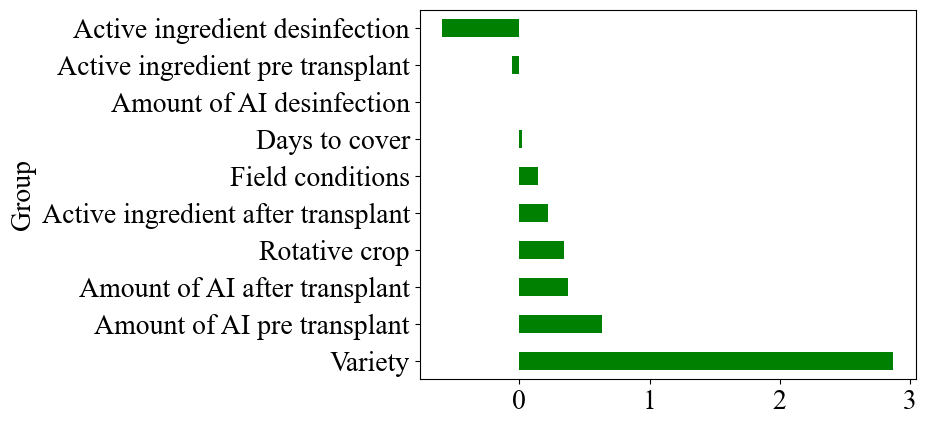

In [836]:
important_vars = coef_grouped['LD1'].sort_values(ascending=False)
important_vars.head(10).plot(kind='barh',color='green')

<Axes: ylabel='Group'>

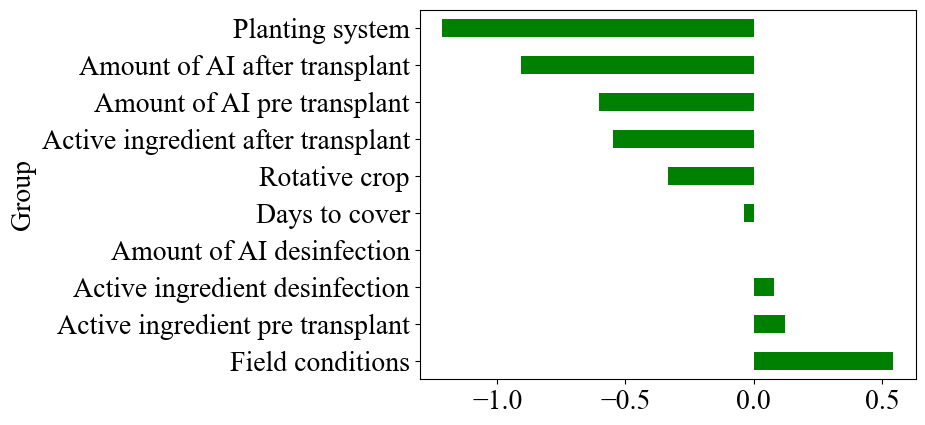

In [837]:
important_vars = coef_grouped['LD2'].sort_values(ascending=False)
important_vars.head(10).plot(kind='barh',color='green')

C:\Users\LauraValbuenaGaona\AppData\Local\Temp\ipykernel_24968\2342650108.py:6: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  texts.append(plt.text(coef_grouped['LD1'][i], coef_grouped['LD2'][i], label, fontsize=20))


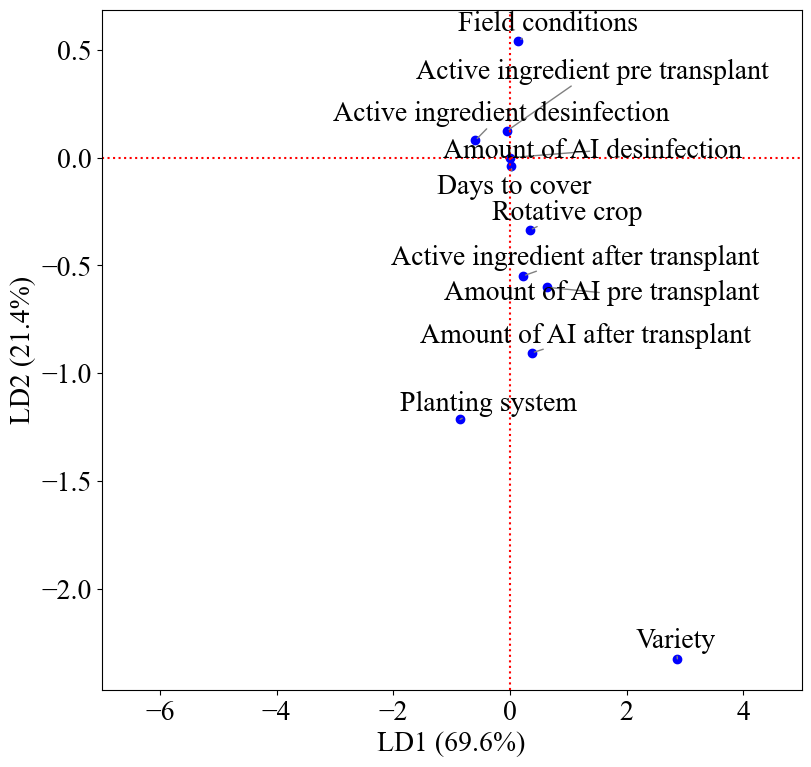

In [838]:
from adjustText import adjust_text
plt.figure(figsize=(10, 8))
plt.scatter(coef_grouped['LD1'], coef_grouped['LD2'], color='blue')
texts = []
for i, label in enumerate(coef_grouped.index):
    texts.append(plt.text(coef_grouped['LD1'][i], coef_grouped['LD2'][i], label, fontsize=20))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))

plt.axhline(0, color='red', linestyle='dotted')
plt.axvline(0, color='red', linestyle='dotted')
plt.xlim(-7,5)

plt.xlabel(f'{ld1_label}')
plt.ylabel(f'{ld2_label}')
plt.subplots_adjust(left=0.15, right=0.85, top=0.95, bottom=0.1)
plt.show()

In [839]:
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

lda = LinearDiscriminantAnalysis()
sfs = SequentialFeatureSelector(lda, n_features_to_select='auto', direction='forward',cv=5,n_jobs=-1,scoring='accuracy')
sfs.fit(X, y_encoded)

selected_features = X.columns[sfs.get_support()]

c:\Users\LauraValbuenaGaona\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:516: FitFailedWarning: 
1 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\LauraValbuenaGaona\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\LauraValbuenaGaona\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py", line 1363, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\LauraValbuenaGaona\AppData

In [840]:
selected_features

Index(['Days to cover', 'Variety_Camino Real', 'Variety_Fortuna',
       'Variety_Frontera', 'Variety_Osceola', 'Variety_Sayulita',
       'Active ingredient pre transplant_Azoxystrobin and Captan',
       'Active ingredient pre transplant_Azoxystrobin and Streptomyces',
       'Active ingredient pre transplant_Azoxystrobin and Tiofanato-metilo',
       'Active ingredient pre transplant_Azoxystrobin, Tiofanato-metilo and Captan',
       'Active ingredient pre transplant_Captan',
       'Active ingredient pre transplant_Captan, Difenoconazol and Ciprodinil',
       'Active ingredient pre transplant_Fosetil-aluminio',
       'Active ingredient pre transplant_Metalaxil-M',
       'Active ingredient pre transplant_Metalaxil-M and Azoxystrobin',
       'Active ingredient pre transplant_Metalaxil-M and Captan',
       'Active ingredient pre transplant_Metalaxil-M and Fluoxastrobin',
       'Active ingredient pre transplant_Metalaxil-M and Tiofanato-metilo',
       'Active ingredient pre tran

In [841]:
df_selected = X[selected_features[:6]].copy()
df_selected = pd.concat([df_selected,pd.DataFrame(y)],axis=1)

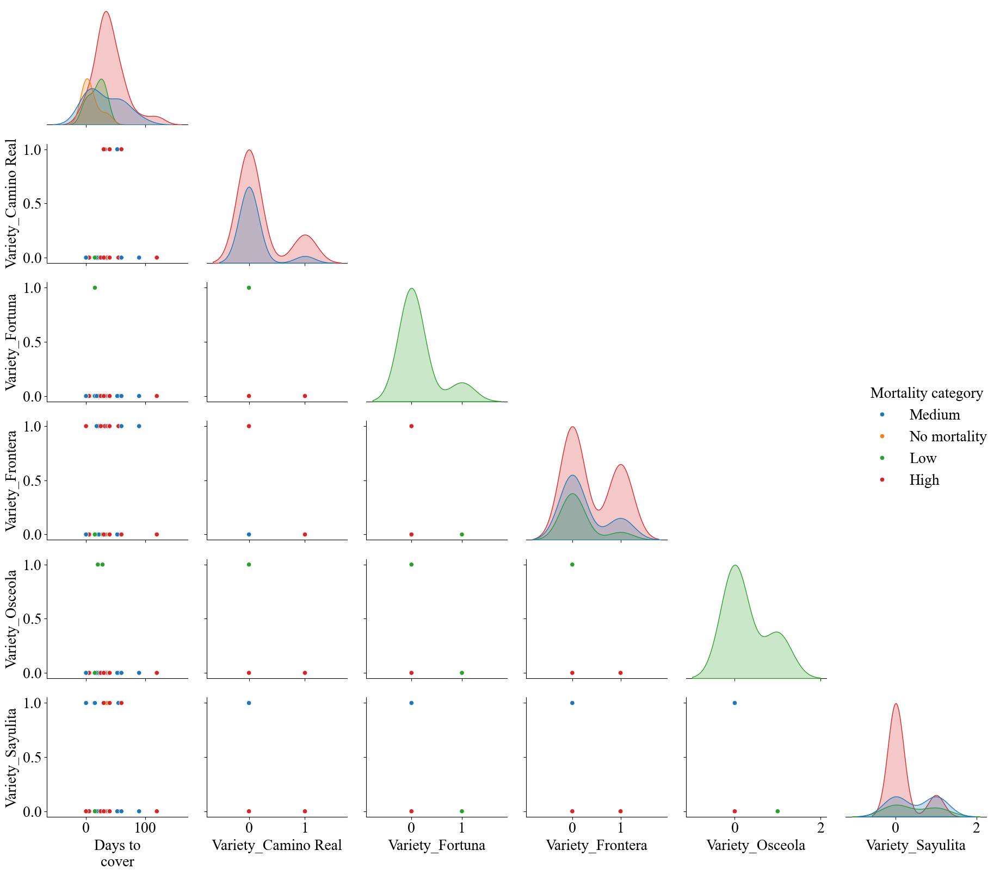

In [842]:
g = sns.pairplot(df_selected, hue='Mortality category', diag_kind='kde', corner=True, height=2.7)
plt.tight_layout()

def multiline(label, n=2):
    if isinstance(label, str):
        parts = label.split()
        return '\n'.join([' '.join(parts[i:i+n]) for i in range(0, len(parts), n)])
    return label

for ax in g.axes.flatten():
    if ax:
        xlabel = ax.get_xlabel()
        if xlabel:
            ax.set_xlabel(multiline(xlabel), fontsize=20)
        ylabel = ax.get_ylabel()
        if ylabel:
            ax.set_ylabel(multiline(ylabel), fontsize=20)

plt.show()

LDA con variables identificadas con validación cruzada

In [843]:
X = X[selected_features].copy()
X = pd.get_dummies(X, drop_first=True)
y = pca1920['Mortality category']

In [844]:
le = LabelEncoder()
y_encoded = le.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)
lda = LinearDiscriminantAnalysis(n_components=2)
lda.fit(X_train, y_train)
accuracy = lda.score(X_test, y_test)
print(f'Precisión del modelo LDA: {accuracy:.2f}')
y_pred = lda.predict(X_test)

Precisión del modelo LDA: 0.60


In [845]:
lda = LinearDiscriminantAnalysis(n_components=2) 
X_lda = lda.fit_transform(X, y_encoded)
df_lda = pd.DataFrame(X_lda, columns=['LD1', 'LD2'])
df_lda['Mortality category'] = y.values  

In [846]:
explained_var = lda.explained_variance_ratio_ * 100 
ld1_label = f'LD1 ({explained_var[0]:.1f}%)'
ld2_label = f'LD2 ({explained_var[1]:.1f}%)'

In [847]:
ld1_label

'LD1 (59.2%)'

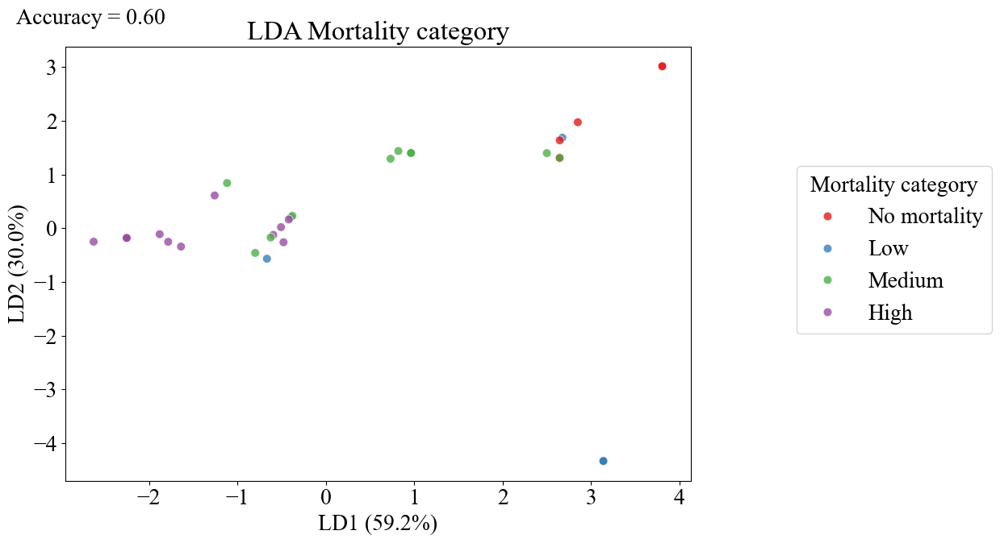

In [848]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_lda, x='LD1', y='LD2', hue='Mortality category', palette='Set1', s=60, alpha=0.8,hue_order=['No mortality','Low','Medium','High'])
plt.text(-3.5,3.8,f'Accuracy = {accuracy:.2f}')
plt.title('LDA Mortality category')
plt.xlabel(f'{ld1_label}')
plt.ylabel(f'{ld2_label}')
plt.legend(title='Mortality category',bbox_to_anchor=(1.5,0.75))
plt.show()

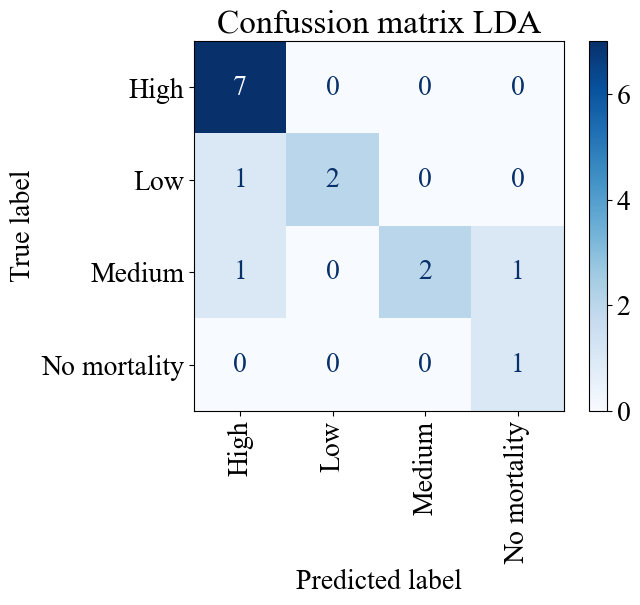

In [849]:
y_pred = lda.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.xticks(rotation=90)
plt.title('Confussion matrix LDA')
plt.show()

In [850]:
coef = lda.coef_
coef_df = pd.DataFrame(coef.T, index=X.columns, columns=[f'LD{i+1}' for i in range(coef.shape[0])])

In [851]:
coef_df = coef_df.reset_index()
coef_df.columns = ['Group', 'LD1', 'LD2', 'LD3', 'LD4']
coef_df['Group'] = coef_df['Group'].str.extract(r'^([^_]+)')

In [852]:
coef_grouped = coef_df.groupby('Group').mean()

<Axes: ylabel='Group'>

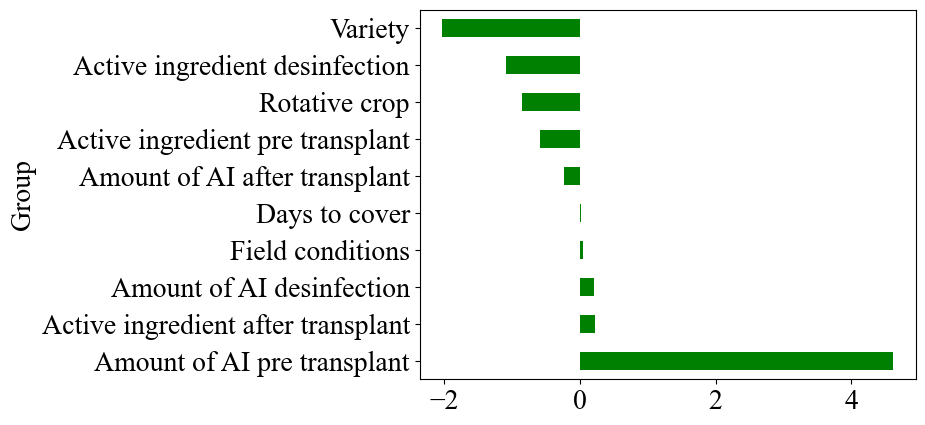

In [853]:
important_vars = coef_grouped['LD1'].sort_values(ascending=False)
important_vars.head(10).plot(kind='barh',color='green')

<Axes: ylabel='Group'>

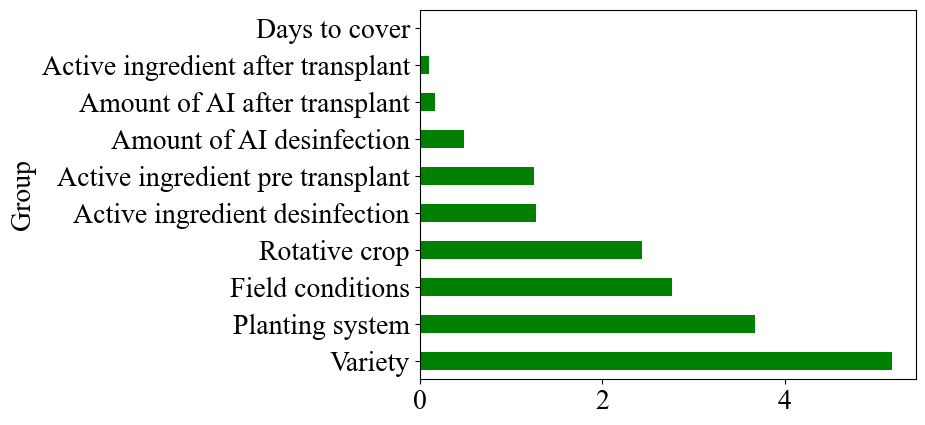

In [854]:
important_vars = coef_grouped['LD2'].sort_values(ascending=False)
important_vars.head(10).plot(kind='barh',color='green')

C:\Users\LauraValbuenaGaona\AppData\Local\Temp\ipykernel_24968\1935168673.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  texts.append(plt.text(coef_grouped['LD1'][i], coef_grouped['LD2'][i], label, fontsize=20))


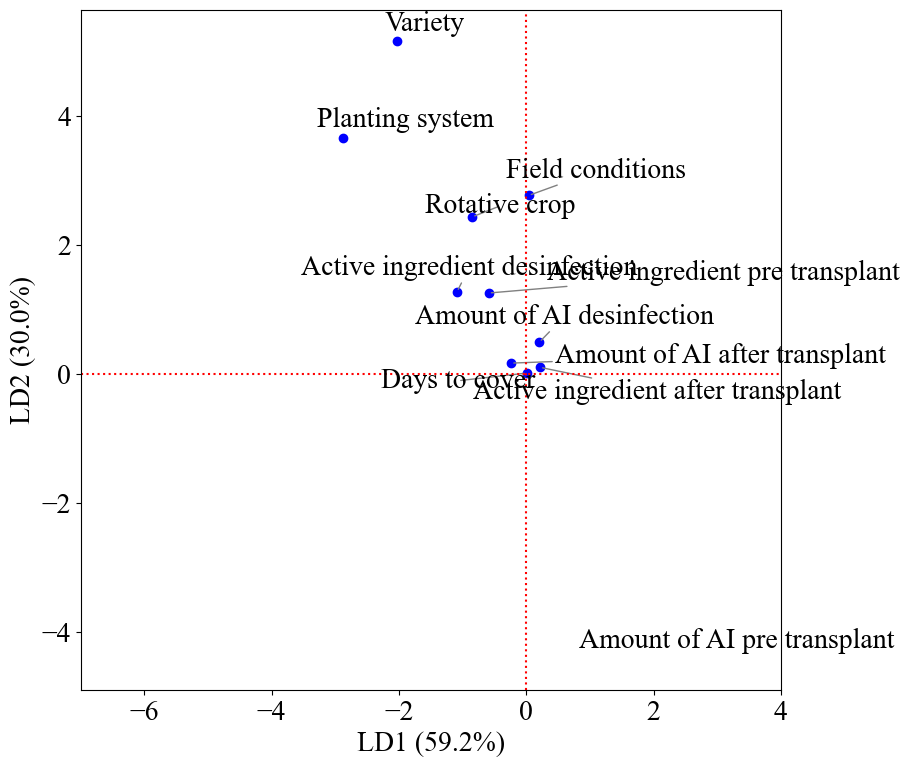

In [855]:
plt.figure(figsize=(10, 8))
plt.scatter(coef_grouped['LD1'], coef_grouped['LD2'], color='blue')
texts = []
for i, label in enumerate(coef_grouped.index):
    texts.append(plt.text(coef_grouped['LD1'][i], coef_grouped['LD2'][i], label, fontsize=20))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))

plt.axhline(0, color='red', linestyle='dotted')
plt.axvline(0, color='red', linestyle='dotted')
plt.xlim(-7,4)

plt.xlabel(f'{ld1_label}')
plt.ylabel(f'{ld2_label}')
plt.subplots_adjust(left=0.15, right=0.85, top=0.95, bottom=0.1)
plt.show()

Data 2022-2023

In [856]:
pca2223.columns

Index(['Latitude', 'Longitude', 'Variety', 'Stage', 'Mortality (%)',
       'Plant density', 'Days to cover', 'Irrigation', 'Fertilization',
       'Technical support', 'Active ingredient pre transplant',
       'Active ingredient after transplant', 'Planting system',
       'Rotative crop', 'Mortality category'],
      dtype='object')

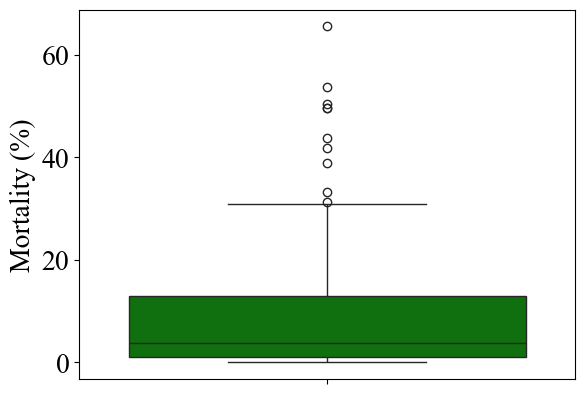

In [857]:
sns.boxplot(pca2223['Mortality (%)'],color='Green')
plt.show()

In [858]:
pca2223['Mortality (%)'].quantile([0.25,0.5,0.75])

0.25     1.0
0.50     3.8
0.75    13.0
Name: Mortality (%), dtype: float64

In [859]:
pca2223['Mortality category'] = np.select([pca2223['Mortality (%)'] == 0,
                                           (pca2223['Mortality (%)'] > 0) & (pca2223['Mortality (%)'] < 1),
                                           (pca2223['Mortality (%)'] >= 1) & (pca2223['Mortality (%)'] <= 3.8),
                                           #(pca2223['Mortality (%)'] >= 4.90) & (pca2223['Mortality (%)'] <= 15.95),
                                           pca2223['Mortality (%)'] > 3.8],
                                           ['No mortality',
                                            'Low',
                                            'Medium',
                                            #'Medium-high',
                                            'High'],default='Unclassified')

In [860]:
pca2223.columns

Index(['Latitude', 'Longitude', 'Variety', 'Stage', 'Mortality (%)',
       'Plant density', 'Days to cover', 'Irrigation', 'Fertilization',
       'Technical support', 'Active ingredient pre transplant',
       'Active ingredient after transplant', 'Planting system',
       'Rotative crop', 'Mortality category'],
      dtype='object')

In [861]:
X = pca2223.drop(columns=['Latitude', 'Longitude', 'Mortality (%)', 'Mortality category'])
X = pd.get_dummies(X, drop_first=True)
y = pca2223['Mortality category']

In [862]:
le = LabelEncoder()
y_encoded = le.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)
lda = LinearDiscriminantAnalysis(n_components=2)
lda.fit(X_train, y_train)
accuracy = lda.score(X_test, y_test)
print(f'Precisión del modelo LDA: {accuracy:.2f}')
y_pred = lda.predict(X_test)

Precisión del modelo LDA: 0.37


In [863]:
explained_var = lda.explained_variance_ratio_ * 100 
ld1_label = f'LD1 ({explained_var[0]:.1f}%)'
ld2_label = f'LD2 ({explained_var[1]:.1f}%)'

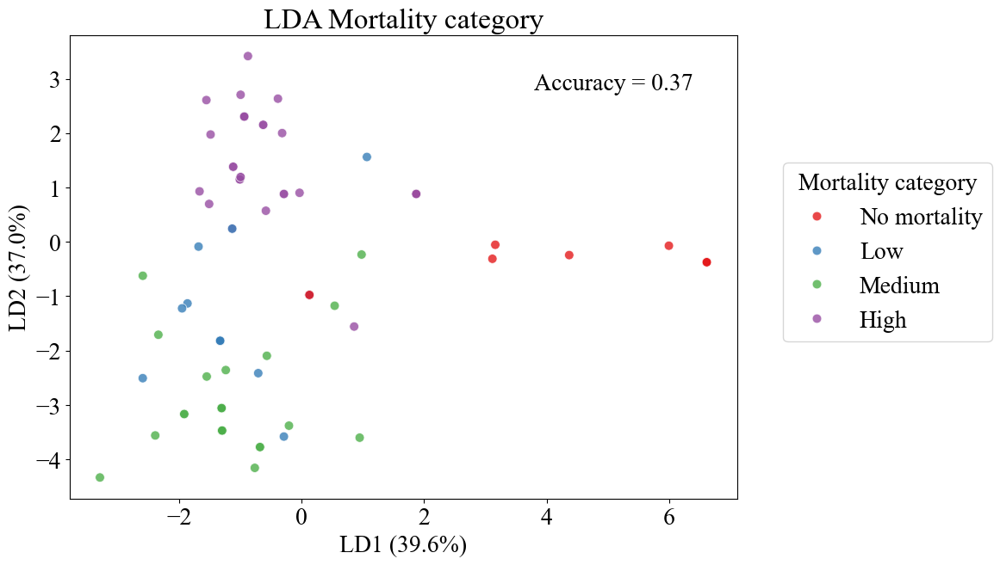

In [864]:
lda = LinearDiscriminantAnalysis(n_components=2) 
X_lda = lda.fit_transform(X, y_encoded)
df_lda = pd.DataFrame(X_lda, columns=['LD1', 'LD2'])
df_lda['Mortality category'] = y.values  

plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_lda, x='LD1', y='LD2', hue='Mortality category', palette='Set1', s=60, alpha=0.8,hue_order=['No mortality','Low','Medium','High'])
plt.text(3.8,2.8,f'Accuracy = {accuracy:.2f}')
plt.title('LDA Mortality category')
plt.xlabel(f'{ld1_label}')
plt.ylabel(f'{ld2_label}')
plt.legend(title='Mortality category',bbox_to_anchor=(1.4,0.75))
plt.show()

In [865]:
lda.fit(X_train, y_train)
accuracy = lda.score(X_test, y_test)
print(f'LDA Accuracy: {accuracy:.2f}')

LDA Accuracy: 0.37


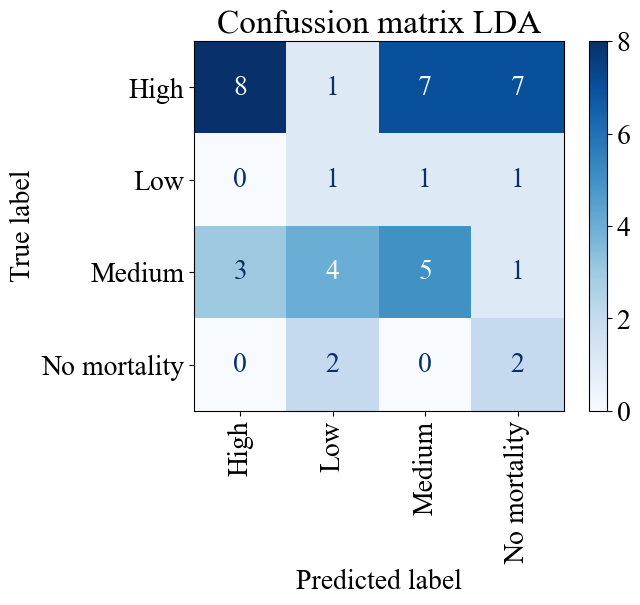

In [866]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
y_pred = lda.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.xticks(rotation=90)
plt.title('Confussion matrix LDA')
plt.show()


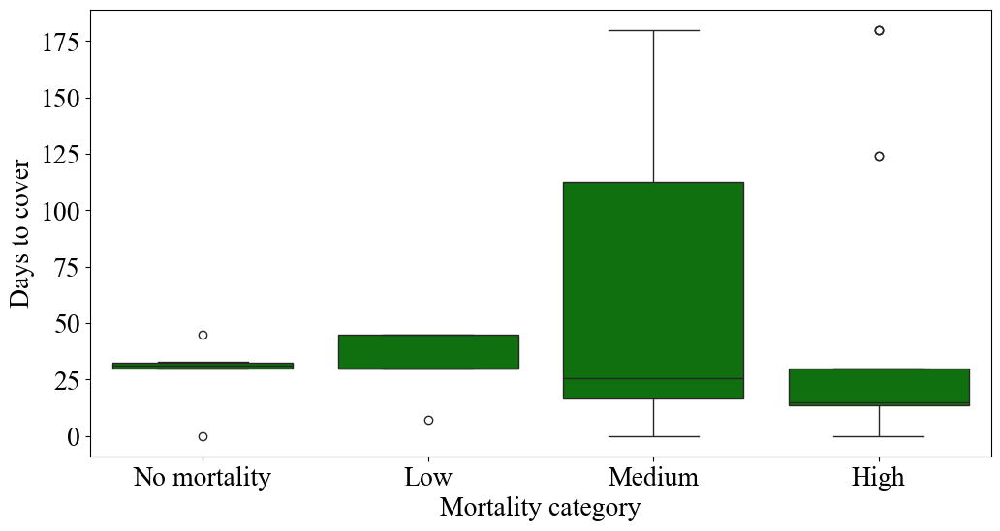

In [919]:
plt.figure(figsize=(12, 6))
sns.boxplot(x='Mortality category', y='Days to cover', data=pca2223.replace({'Without cover':np.nan}), color='Green',order=['No mortality','Low','Medium','High'])
plt.gca().invert_yaxis()
plt.show()


In [868]:
coef = lda.coef_
coef_df = pd.DataFrame(coef.T, index=X.columns, columns=[f'LD{i+1}' for i in range(coef.shape[0])]) #Peso componentes poir LD1 y LD2
coef_df

,LD1,LD2,LD3,LD4
Variety_Albion,18.858128,-0.298356,-1.306592,-53.230744
Variety_Cabrillo,18.858128,-0.298356,-1.306592,-53.230744
Variety_Camino Real,18.724382,10.370427,0.036008,-62.186554
Variety_Festival,-1.479905,18.040930,8.869095,-21.359560
Variety_Fortuna,14.138636,2.237850,6.558862,-52.909056
...,...,...,...,...
Rotative crop_Sorghum,-5.613533,-4.786036,14.600705,-2.120905
Rotative crop_Strawberry,0.000000,0.000000,0.000000,0.000000
Rotative crop_Tomate,-8.231165,55.198460,51.767931,-91.421789
Rotative crop_Tomate and onion,19.229892,-54.251833,-13.241226,0.672166


In [869]:
coef_df.sort_values(by='LD1',ascending=False).head(10) #Promedio por columna 

,LD1,LD2,LD3,LD4
Days to cover_31,35.270438,-179.429811,-17.571929,46.108975
Days to cover_120,31.762357,-55.219507,-23.050844,-20.762247
Rotative crop_Tomate and onion,19.229892,-54.251833,-13.241226,0.672166
Variety_Cabrillo,18.858128,-0.298356,-1.306592,-53.230744
Variety_Albion,18.858128,-0.298356,-1.306592,-53.230744
Variety_Camino Real,18.724382,10.370427,0.036008,-62.186554
Plant density_80000.0,18.443456,-19.004259,-6.493667,-31.371725
Technical support_Not kown,16.867376,-15.036091,-46.399431,30.388541
Plant density_57000.0,16.331923,-14.742826,-11.611260,-20.422440
Days to cover_7,16.331923,-14.742826,-11.611260,-20.422440


In [870]:
coef_df = coef_df.reset_index()
coef_df.columns = ['Group', 'LD1', 'LD2', 'LD3', 'LD4']
coef_df['Group'] = coef_df['Group'].str.extract(r'^([^_]+)')
coef_df

,Group,LD1,LD2,LD3,LD4
0,Variety,18.858128,-0.298356,-1.306592,-53.230744
1,Variety,18.858128,-0.298356,-1.306592,-53.230744
2,Variety,18.724382,10.370427,0.036008,-62.186554
3,Variety,-1.479905,18.040930,8.869095,-21.359560
4,Variety,14.138636,2.237850,6.558862,-52.909056
...,...,...,...,...,...
140,Rotative crop,-5.613533,-4.786036,14.600705,-2.120905
141,Rotative crop,0.000000,0.000000,0.000000,0.000000
142,Rotative crop,-8.231165,55.198460,51.767931,-91.421789
143,Rotative crop,19.229892,-54.251833,-13.241226,0.672166


In [871]:
coef_grouped = coef_df.groupby('Group').mean()

In [872]:
coef_grouped

,LD1,LD2,LD3,LD4
Group,,,,
Active ingredient after transplant,-6.119159,6.767784,-15.356987,36.357657
Active ingredient pre transplant,-1.229571,-1.233938,3.939760,-1.449442
Days to cover,11.178004,-28.725922,-8.560509,-0.245553
Fertilization,2.810930,34.103416,40.518373,-92.480764
Irrigation,4.210293,-19.333730,-14.225651,22.262679
Plant density,-3.837730,5.819369,4.018492,1.244779
Planting system,-5.774331,6.108450,39.716316,-46.811936
Rotative crop,1.253558,-4.493649,-1.137069,1.112660
Stage,0.267491,-21.337565,-2.685200,17.911621


<Axes: ylabel='Group'>

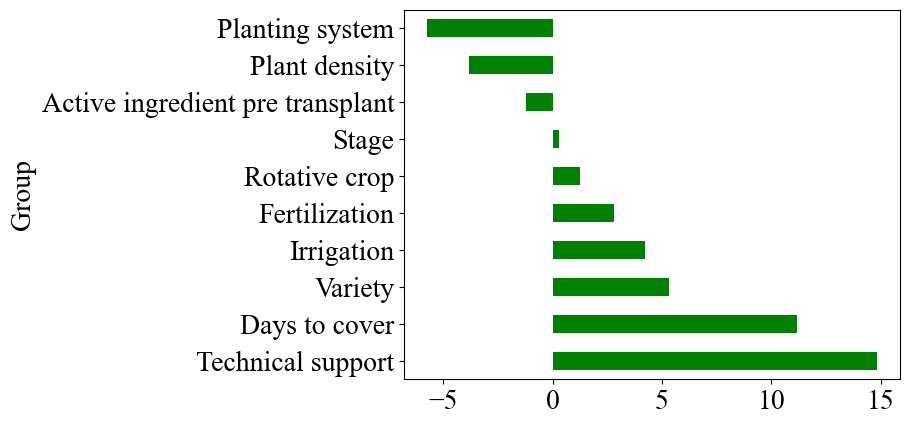

In [873]:
important_vars = coef_grouped['LD1'].sort_values(ascending=False)
important_vars.head(10).plot(kind='barh',color='green')

<Axes: ylabel='Group'>

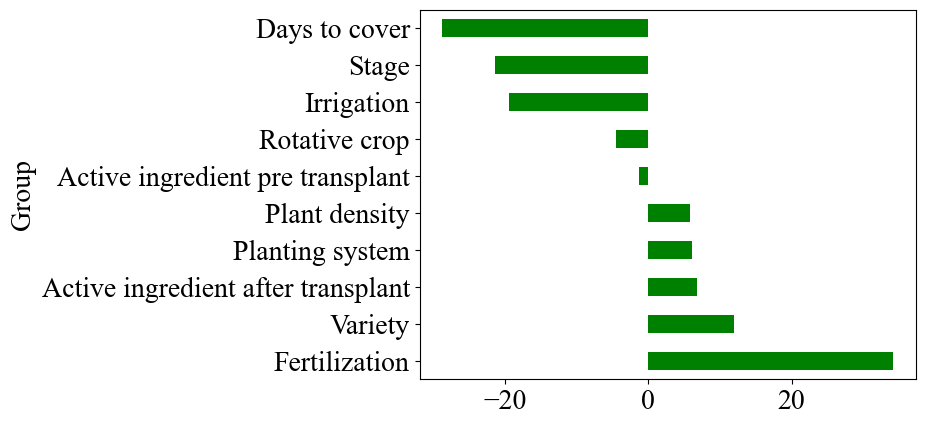

In [874]:
important_vars = coef_grouped['LD2'].sort_values(ascending=False)
important_vars.head(10).plot(kind='barh',color='green')

C:\Users\LauraValbuenaGaona\AppData\Local\Temp\ipykernel_24968\4162385830.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  texts.append(plt.text(coef_grouped['LD1'][i], coef_grouped['LD2'][i], label, fontsize=20))


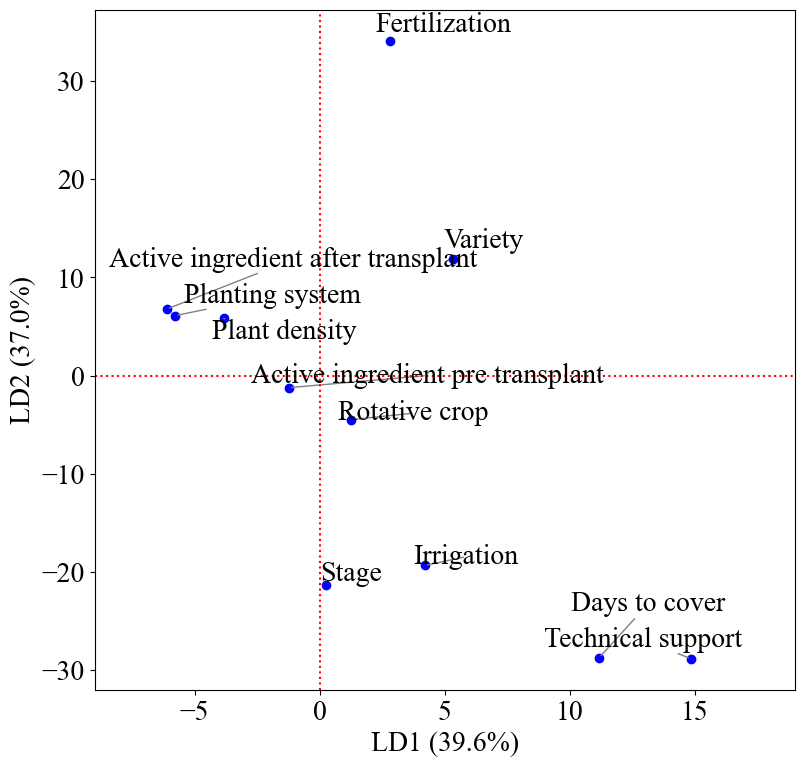

In [875]:
plt.figure(figsize=(10, 8))
plt.scatter(coef_grouped['LD1'], coef_grouped['LD2'], color='blue')
texts = []
for i, label in enumerate(coef_grouped.index):
    texts.append(plt.text(coef_grouped['LD1'][i], coef_grouped['LD2'][i], label, fontsize=20))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'))

plt.axhline(0, color='red', linestyle='dotted')
plt.axvline(0, color='red', linestyle='dotted')
plt.xlim(-9,19)

plt.xlabel(f'{ld1_label}')
plt.ylabel(f'{ld2_label}')
plt.subplots_adjust(left=0.15, right=0.85, top=0.95, bottom=0.1)
plt.show()

In [876]:
lda = LinearDiscriminantAnalysis()
sfs = SequentialFeatureSelector(lda, n_features_to_select='auto', direction='forward',cv=5,n_jobs=-1,scoring='accuracy')
sfs.fit(X, y_encoded)

selected_features = X.columns[sfs.get_support()]

c:\Users\LauraValbuenaGaona\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:516: FitFailedWarning: 
1 fits failed out of a total of 5.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\LauraValbuenaGaona\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py", line 859, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\LauraValbuenaGaona\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py", line 1363, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\LauraValbuenaGaona\AppData

In [877]:
selected_features

Index(['Variety_Cabrillo', 'Variety_Camino Real', 'Variety_Frontera',
       'Variety_Monterrey', 'Variety_No Documentado', 'Variety_Royal',
       'Variety_Santa Maria', 'Variety_Sayulita', 'Variety_Victor',
       'Variety_Warrior', 'Stage_Nursery', 'Plant density_4000.0',
       'Plant density_5000.0', 'Plant density_5800.0', 'Plant density_6000.0',
       'Plant density_10000.0', 'Plant density_11000.0',
       'Plant density_12500.0', 'Plant density_18000.0',
       'Plant density_26000.0', 'Plant density_28000.0',
       'Plant density_30000.0', 'Plant density_45000.0',
       'Plant density_70000.0', 'Plant density_75000.0',
       'Plant density_90000.0', 'Plant density_100000.0',
       'Plant density_120000.0', 'Plant density_150000.0', 'Days to cover_90',
       'Days to cover_120', 'Days to cover_12', 'Days to cover_124',
       'Days to cover_21', 'Days to cover_32', 'Days to cover_33',
       'Days to cover_45', 'Fertilization_Soil', 'Technical support_Yes',
       'Activ

In [878]:
df_selected = X[selected_features[:6]].copy()
df_selected = pd.concat([df_selected,pd.DataFrame(y)],axis=1)

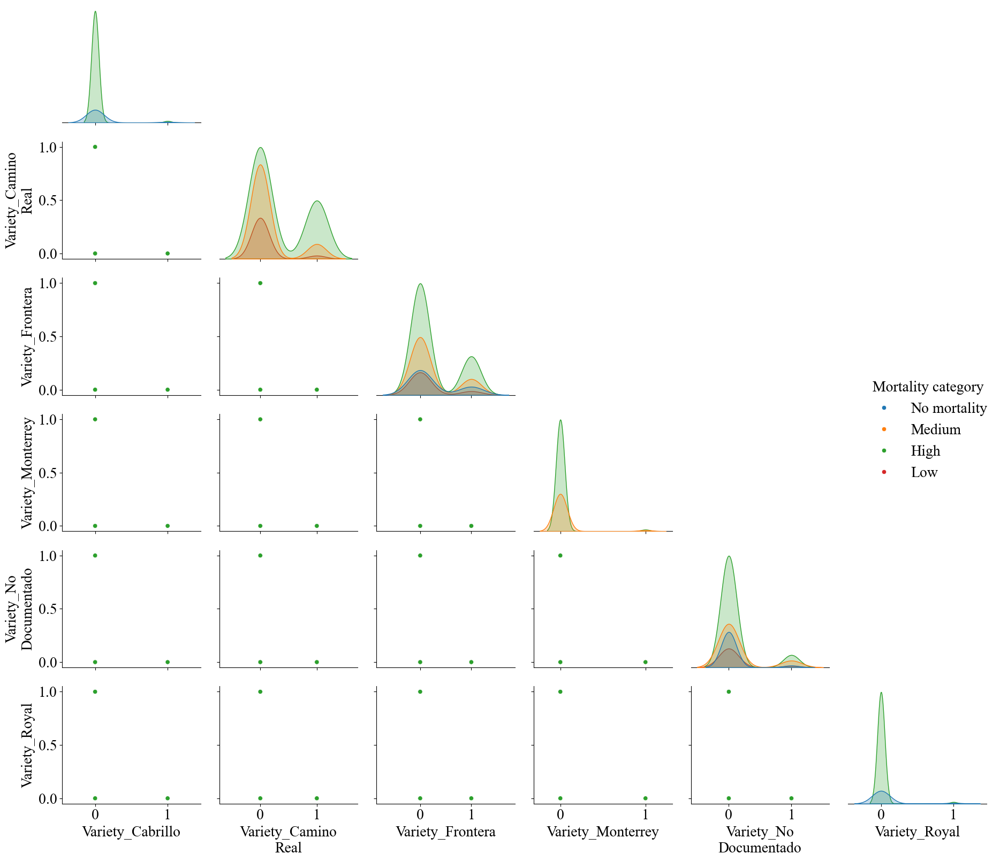

In [879]:
g = sns.pairplot(df_selected, hue='Mortality category', diag_kind='kde', corner=True, height=2.7)
plt.tight_layout()

def multiline(label, n=1):
    if isinstance(label, str):
        parts = label.split()
        return '\n'.join([' '.join(parts[i:i+n]) for i in range(0, len(parts), n)])
    return label

for ax in g.axes.flatten():
    if ax:
        xlabel = ax.get_xlabel()
        if xlabel:
            ax.set_xlabel(multiline(xlabel), fontsize=20)
        ylabel = ax.get_ylabel()
        if ylabel:
            ax.set_ylabel(multiline(ylabel), fontsize=20)

plt.show()

LDA con variables identificadas con validación cruzada

In [880]:
X = X[selected_features].copy()
X = pd.get_dummies(X, drop_first=True)
y = pca2223['Mortality category']

In [881]:
le = LabelEncoder()
y_encoded = le.fit_transform(y)
X_train, X_test, y_train, y_test = train_test_split(X, y_encoded, test_size=0.3, random_state=42)
lda = LinearDiscriminantAnalysis(n_components=2)
lda.fit(X_train, y_train)
accuracy = lda.score(X_test, y_test)
print(f'Precisión del modelo LDA: {accuracy:.2f}')
y_pred = lda.predict(X_test)

Precisión del modelo LDA: 0.58


In [882]:
lda = LinearDiscriminantAnalysis(n_components=2) 
X_lda = lda.fit_transform(X, y_encoded)
df_lda = pd.DataFrame(X_lda, columns=['LD1', 'LD2'])
df_lda['Mortality category'] = y.values  

In [883]:
explained_var = lda.explained_variance_ratio_ * 100 
ld1_label = f'LD1 ({explained_var[0]:.1f}%)'
ld2_label = f'LD2 ({explained_var[1]:.1f}%)'

In [884]:
ld1_label

'LD1 (43.4%)'

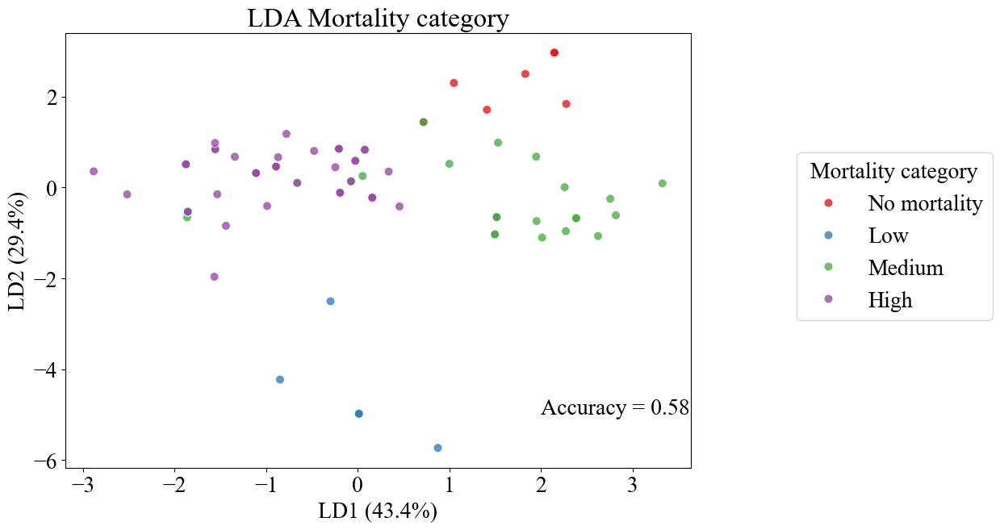

In [885]:
plt.figure(figsize=(10, 7))
sns.scatterplot(data=df_lda, x='LD1', y='LD2', hue='Mortality category', palette='Set1', s=60, alpha=0.8,hue_order=['No mortality','Low','Medium','High'])
plt.text(2,-5,f'Accuracy = {accuracy:.2f}')
plt.title('LDA Mortality category')
plt.xlabel(f'{ld1_label}')
plt.ylabel(f'{ld2_label}')
plt.legend(title='Mortality category',bbox_to_anchor=(1.5,0.75))
plt.show()

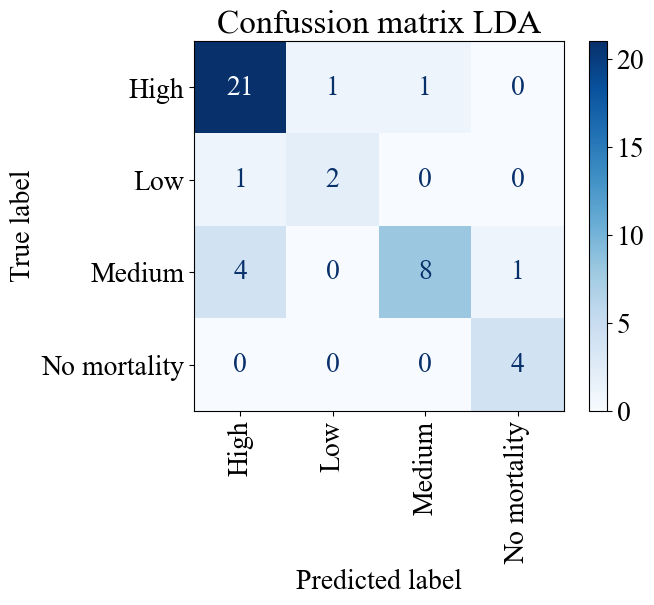

In [886]:
y_pred = lda.predict(X_test)
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=le.classes_)
disp.plot(cmap=plt.cm.Blues)
plt.xticks(rotation=90)
plt.title('Confussion matrix LDA')
plt.show()

In [887]:
coef = lda.coef_
coef_df = pd.DataFrame(coef.T, index=X.columns, columns=[f'LD{i+1}' for i in range(coef.shape[0])])

In [888]:
coef_df = coef_df.reset_index()
coef_df.columns = ['Group', 'LD1', 'LD2', 'LD3', 'LD4']
coef_df['Group'] = coef_df['Group'].str.extract(r'^([^_]+)')

In [889]:
coef_grouped = coef_df.groupby('Group').mean()

<Axes: ylabel='Group'>

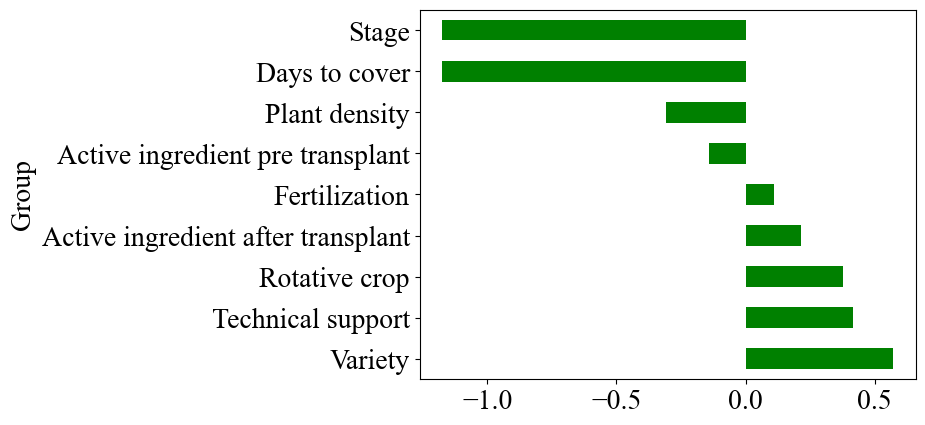

In [890]:
important_vars = coef_grouped['LD1'].sort_values(ascending=False)
important_vars.head(10).plot(kind='barh',color='green')

<Axes: ylabel='Group'>

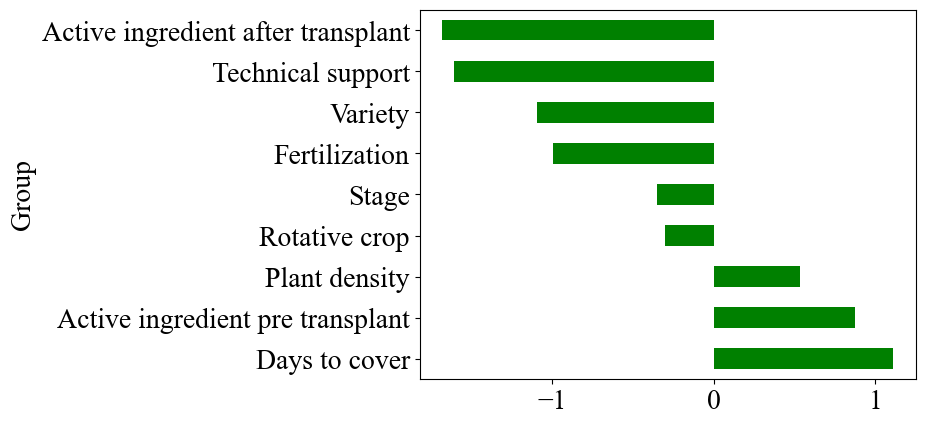

In [891]:
important_vars = coef_grouped['LD2'].sort_values(ascending=False)
important_vars.head(10).plot(kind='barh',color='green')

C:\Users\LauraValbuenaGaona\AppData\Local\Temp\ipykernel_24968\1125573998.py:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  texts.append(plt.text(coef_grouped['LD1'][i], coef_grouped['LD2'][i], label, fontsize=20))


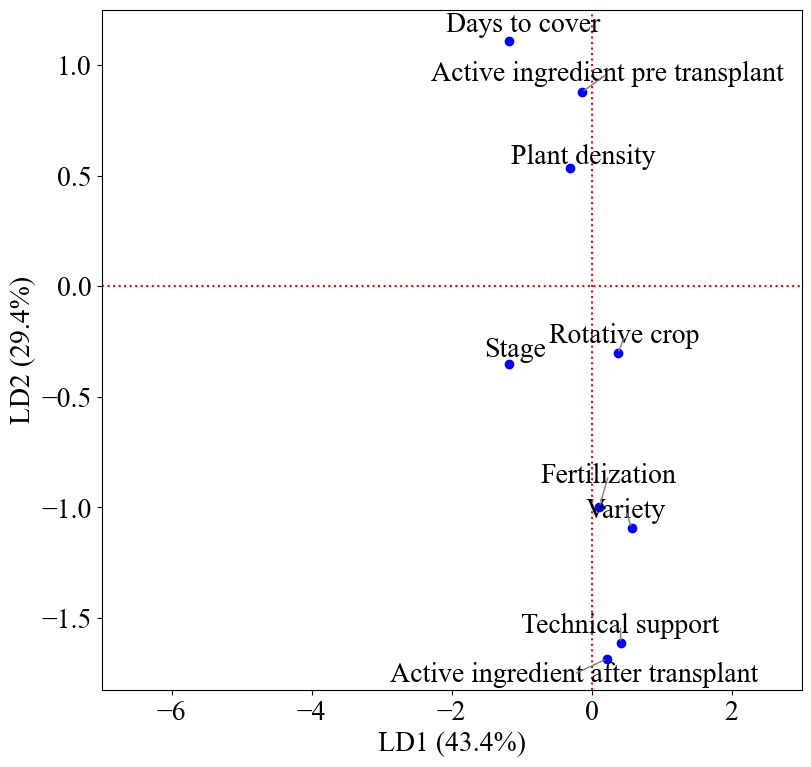

In [892]:
plt.figure(figsize=(10, 8))
plt.scatter(coef_grouped['LD1'], coef_grouped['LD2'], color='blue')
texts = []
for i, label in enumerate(coef_grouped.index):
    texts.append(plt.text(coef_grouped['LD1'][i], coef_grouped['LD2'][i], label, fontsize=20))

adjust_text(texts, arrowprops=dict(arrowstyle='-', color='gray'),expand_text=(1.2, 1.4), expand_points=(1.5, 1.5), force_text=0.8, force_points=1.0, lim=200)

plt.axhline(0, color='red', linestyle='dotted')
plt.axvline(0, color='red', linestyle='dotted')
plt.xlim(-7,3)

plt.xlabel(f'{ld1_label}')
plt.ylabel(f'{ld2_label}')
plt.subplots_adjust(left=0.15, right=0.85, top=0.95, bottom=0.1)
plt.show()

Fungicidas

In [172]:
Dcrudos_19_20.columns

Index(['No- Parcela', 'ETIQUETA', 'COORDENADAS', 'Latitud', 'Longitud',
       'MUNICIPIO', 'SUPERFICIE', 'Variety', 'CEP-R.D.',
       'LUGAR DE ORIGEN/EMPRESA', 'FECHA DE TRANSPLANTE',
       'FECHA CUBIERTACON  (PLASTICO)', 'DIAS transplante-CUBIERTA',
       'FECHA DE REPLANTE ', 'Ingrediente pre', 'Ingrediente pos',
       'Ingrediente desinfección', 'CONDICIONES DE PARCELA',
       'Plagas-FUNGUS Gnat/DUPONCHELIA', 'CULTIVO DE ROTACION ', 'mortalidad',
       '%SEVERIDAD(PLANTA)', 'SEVERIDAD EN HOJA \nPROMEDIO',
       '%SEVERIDAD HOJA  BASADO EN ESCALA De PHOMOPSIS)'],
      dtype='object')

In [173]:
entrevistas23.columns

Index(['Y', 'X', 'UNIDAD DE MUESTREO', 'NUMERO DE PARCELA',
       'NOMBRE DE PARCELA', 'VARIEDAD', 'TIPO DE PLANTACION', 'INCIDENCIA ',
       'SEVERIDAD', 'MORTALIDAD', 'FECHA DE MUESTREO', 'PRODUCTOR', 'CONTACTO',
       'CODIGO HOJA', 'SUPERFICIE', 'DENSIDAD', 'FECHA DE SIEMBRA', 'Columna1',
       'MODALIDAD', 'TEMPORADA', 'ORIGEN DE LA PLANTA', 'PUESTA DE TUNEL',
       'TIPO DE RIEGO', 'FERTILIZACION', 'ASESORIA TECNICA', 'EMPRESA',
       'ANTECEDENTES FITOPAT', 'TRATAMIENTO PRE', 'productos utilizados PRE',
       'Ingrediente pre', 'TRATAMIENTO POST', 'productos utilizados POST',
       'Ingrediente pos', 'fungus', 'Duponchelia', 'Replante', 'Perdida',
       'COSTOS EN P&E', 'CULTIVO ANTERIOR', 'TEXTURA',
       'HUMEDAD AL MUESTREO (1-5)'],
      dtype='object')

In [174]:
manejo19 = Dcrudos_19_20[['Variety','Ingrediente pre', 'Ingrediente pos', 'mortalidad']]
manejo23 = entrevistas23[['VARIEDAD','Ingrediente pre', 'Ingrediente pos', 'MORTALIDAD']]
manejo23.columns = ['Variety','Ingrediente pre', 'Ingrediente pos', 'mortalidad']

manejo19['Time period'] = '2019-2020'
manejo23['Time period'] = '2022-2023'

manejo = pd.concat([manejo19,manejo23],axis=0)
manejo

/var/folders/g1/6fhcms6n0px1d6b5mxmlwwcw0000gn/T/ipykernel_57832/630209118.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  manejo19['Time period'] = '2019-2020'
/var/folders/g1/6fhcms6n0px1d6b5mxmlwwcw0000gn/T/ipykernel_57832/630209118.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  manejo23['Time period'] = '2022-2023'


,Variety,Ingrediente pre,Ingrediente pos,mortalidad,Time period
0,Albion,NaN,NaN,2.0,2019-2020
5,Sayulita,Metalaxil-M,Tiofanato-metilo,0.0,2019-2020
10,Sayulita,NaN,NaN,0.2,2019-2020
15,Frontera,Azoxystrobin,Tiofanato-metilo and Captan,14.4,2019-2020
20,Albion,Metalaxil-M and Fluoxastrobin,Captan,30.2,2019-2020
...,...,...,...,...,...
136,Festival,Azoxistrobin and Metalaxil-M,"Azoxistrobin, Metalaxil-M, Pirimetanil and Man...",6.0,2022-2023
137,Frontera,NaN,"Azoxistrobin, Metalaxil-M and Mancozeb",24.6,2022-2023
138,Festival,Azoxistrobin and Metalaxil-M,"Azoxistrobin, Metalaxil-M, Pirimetanil, Mancoz...",39.0,2022-2023
139,Frontera,"Quintozeno, Thiram and 2-tiocianometiltio benz...",NaN,49.6,2022-2023


In [175]:
manejo['Ingrediente pre'] = manejo['Ingrediente pre'].str.replace(' and ', ',')
manejo['Ingrediente pos'] = manejo['Ingrediente pos'].str.replace(' and ', ',')

df_pre = manejo[['Time period', 'Ingrediente pre']].dropna()
df_pre = df_pre.assign(Ingrediente=df_pre['Ingrediente pre'].str.split(',')).explode('Ingrediente')
df_pre['Ingrediente'] = df_pre['Ingrediente'].str.strip()

df_pos = manejo[['Time period', 'Ingrediente pos']].dropna()
df_pos = df_pos.assign(Ingrediente=df_pos['Ingrediente pos'].str.split(',')).explode('Ingrediente')
df_pos['Ingrediente'] = df_pos['Ingrediente'].str.strip()

frecuencia_pre = df_pre.groupby(['Time period', 'Ingrediente']).size().reset_index(name='Frecuencia_pre')
frecuencia_pos = df_pos.groupby(['Time period', 'Ingrediente']).size().reset_index(name='Frecuencia_pos')

In [176]:
Dcrudos_19_20['Ingrediente desinfección'] = Dcrudos_19_20['Ingrediente desinfección'].str.replace(' and ', ',')

df_des = Dcrudos_19_20[['Ingrediente desinfección']].dropna()
df_des = df_des.assign(Ingrediente=df_des['Ingrediente desinfección'].str.split(',')).explode('Ingrediente')
df_des['Ingrediente'] = df_des['Ingrediente'].str.strip()

frecuencia_des = df_des.groupby(['Ingrediente']).size().reset_index(name='Frecuencia_desin')

Text(0.5, 0, 'Frequency')

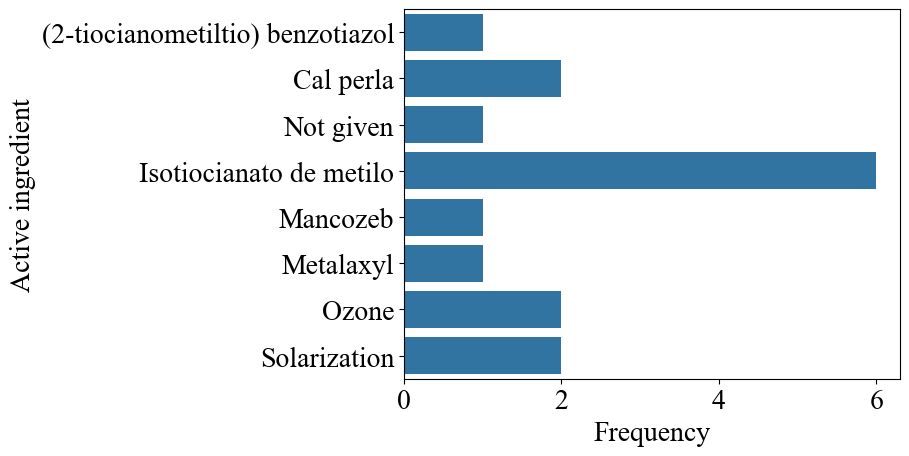

In [177]:
frecuencia_des['Ingrediente'] = frecuencia_des['Ingrediente'].replace({'Fungicides':'Not given'})
sns.barplot(data=frecuencia_des,x='Frecuencia_desin',y='Ingrediente')
plt.ylabel('Active ingredient')
plt.xlabel('Frequency')

Text(0.5, 0, 'Frequency')

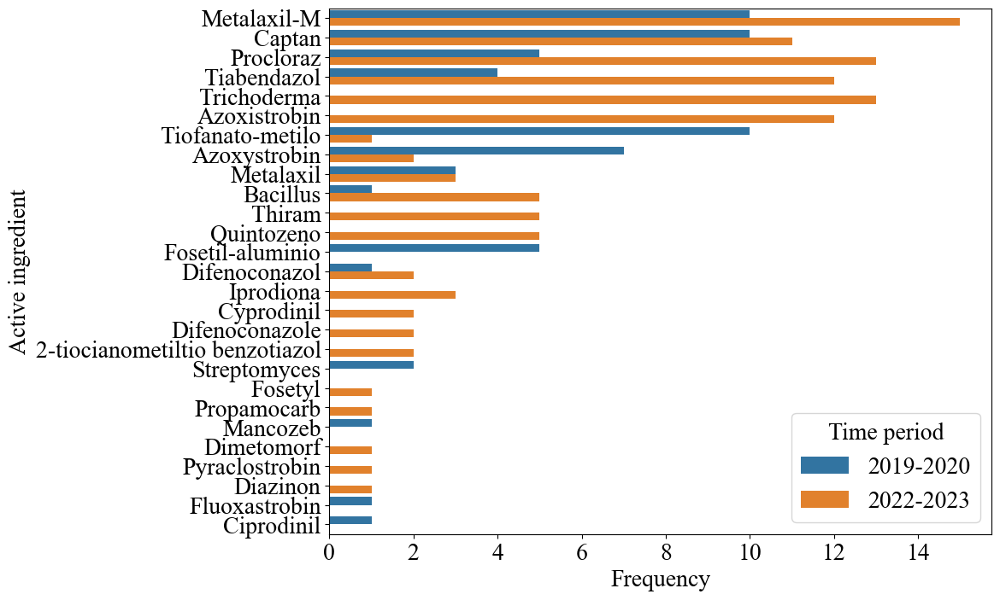

In [178]:
orden_pre = df_pre['Ingrediente'].value_counts().index
plt.figure(figsize=(10,8))
sns.barplot(data=frecuencia_pre,x='Frecuencia_pre',y='Ingrediente',hue='Time period',order=orden_pre)
plt.ylabel('Active ingredient')
plt.xlabel('Frequency')

Text(0.5, 0, 'Frequency')

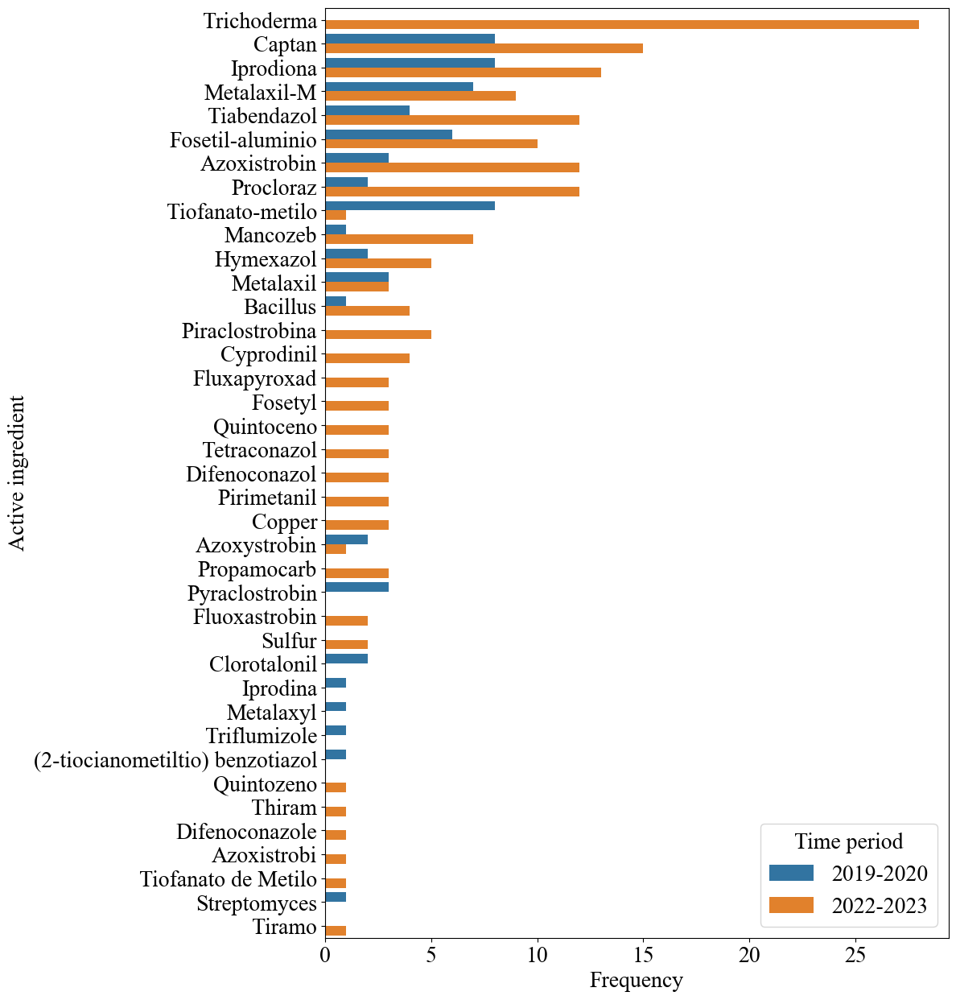

In [179]:
orden_pos = df_pos['Ingrediente'].value_counts().index
plt.figure(figsize=(10,15))
sns.barplot(data=frecuencia_pos,x='Frecuencia_pos',y='Ingrediente',hue='Time period',order=orden_pos)
plt.ylabel('Active ingredient')
plt.xlabel('Frequency')

In [180]:
df_des_mort = Dcrudos_19_20[['Ingrediente desinfección', 'mortalidad']].dropna()
df_des_mort = df_des_mort.assign(Ingrediente=df_des_mort['Ingrediente desinfección'].str.replace(' and ', ',').str.split(','))
df_des_mort = df_des_mort.explode('Ingrediente')
df_des_mort['Ingrediente'] = df_des_mort['Ingrediente'].str.strip()
mort_des = df_des_mort.groupby(['Ingrediente'])['mortalidad'].mean().reset_index()

In [181]:
mort_des['Ingrediente'] = mort_des['Ingrediente'].replace({'Cal perla':'Calcium hidroxyde',
                                                           '(2-tiocianometiltio) benzotiazol':'2-tiocianometiltio benzotiazol'})

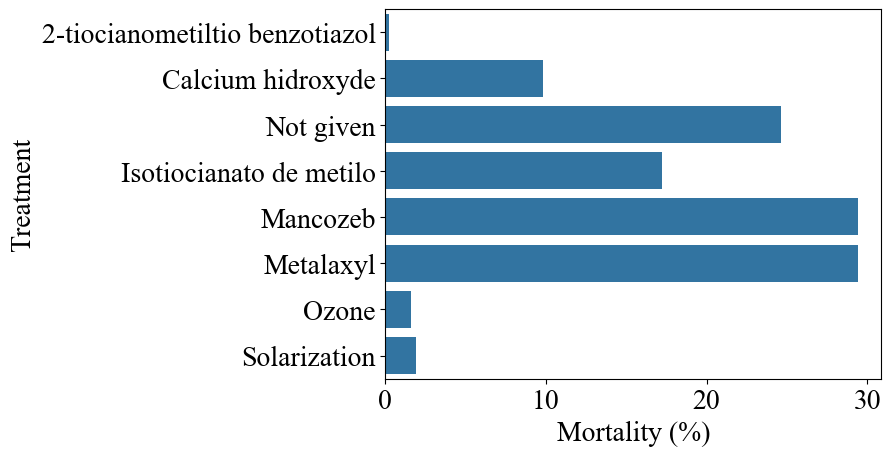

In [182]:
mort_des['Ingrediente'] = mort_des['Ingrediente'].replace({'Fungicides':'Not given'})
sns.barplot(data = mort_des, x='mortalidad', y='Ingrediente')
plt.xlabel('Mortality (%)')
plt.ylabel('Treatment')
plt.show()

In [183]:
df_pre_mort = manejo[['Time period', 'Ingrediente pre', 'mortalidad']].dropna()
df_pre_mort = df_pre_mort.assign(Ingrediente=df_pre_mort['Ingrediente pre'].str.replace(' and ', ',').str.split(','))
df_pre_mort = df_pre_mort.explode('Ingrediente')
df_pre_mort['Ingrediente'] = df_pre_mort['Ingrediente'].str.strip()

df_pos_mort = manejo[['Time period', 'Ingrediente pos', 'mortalidad']].dropna()
df_pos_mort = df_pos_mort.assign(Ingrediente=df_pos_mort['Ingrediente pos'].str.replace(' and ', ',').str.split(','))
df_pos_mort = df_pos_mort.explode('Ingrediente')
df_pos_mort['Ingrediente'] = df_pos_mort['Ingrediente'].str.strip()
mort_pre = df_pre_mort.groupby(['Ingrediente', 'Time period'])['mortalidad'].mean().reset_index()
mort_pos = df_pos_mort.groupby(['Ingrediente', 'Time period'])['mortalidad'].mean().reset_index()


In [184]:
time_period_order = ['2019-2020', '2022-2023']
mort_pre['Time period'] = pd.Categorical(mort_pre['Time period'], categories=time_period_order, ordered=True)

In [185]:
mort_pos['Ingrediente'].unique()

array(['(2-tiocianometiltio) benzotiazol', 'Azoxistrobi', 'Azoxistrobin',
       'Azoxystrobin', 'Bacillus', 'Captan', 'Clorotalonil', 'Copper',
       'Cyprodinil', 'Difenoconazol', 'Difenoconazole', 'Fluoxastrobin',
       'Fluxapyroxad', 'Fosetil-aluminio', 'Fosetyl', 'Hymexazol',
       'Iprodina', 'Iprodiona', 'Mancozeb', 'Metalaxil', 'Metalaxil-M',
       'Metalaxyl', 'Piraclostrobina', 'Pirimetanil', 'Procloraz',
       'Propamocarb', 'Pyraclostrobin', 'Quintoceno', 'Quintozeno',
       'Streptomyces', 'Sulfur', 'Tetraconazol', 'Thiram', 'Tiabendazol',
       'Tiofanato de Metilo', 'Tiofanato-metilo', 'Tiramo', 'Trichoderma',
       'Triflumizole'], dtype=object)

In [186]:
mort_pre['Ingrediente'].unique()

array(['2-tiocianometiltio benzotiazol', 'Azoxistrobin', 'Azoxystrobin',
       'Bacillus', 'Captan', 'Ciprodinil', 'Cyprodinil', 'Diazinon',
       'Difenoconazol', 'Difenoconazole', 'Dimetomorf', 'Fluoxastrobin',
       'Fosetil-aluminio', 'Fosetyl', 'Iprodiona', 'Mancozeb',
       'Metalaxil', 'Metalaxil-M', 'Procloraz', 'Propamocarb',
       'Pyraclostrobin', 'Quintozeno', 'Streptomyces', 'Thiram',
       'Tiabendazol', 'Tiofanato-metilo', 'Trichoderma'], dtype=object)

In [187]:
mort_pre=mort_pre[mort_pre['Ingrediente']!='Diazinon']

In [197]:
mort_pre['Ingrediente'] = mort_pre['Ingrediente'].replace({'Ciprodinil':'Cyprodinil+fludioxonil','Difenoconazol':'Difenoconazole',
                                                           'Metalaxil-M':'Metalaxyl','Metalaxil':'Metalaxyl','Azoxitrobin':'Azoxytrobin',
                                                           'Tiofanato-metilo':'Thiophanate-methyl','Fosetyl':'Fosetyl-Al','Fosetil-aluminio':'Fosetyl-Al'})

In [200]:
mort_pos['Ingrediente'] = mort_pos['Ingrediente'].replace({'Ciprodinil':'Cyprodinil+fludioxonil','Difenoconazol':'Difenoconazole',
                                                           'Azoxistrobi':'Azoxystrobin','Tiofanato de Metilo':'Tiofanato-metilo',
                                                           'Azoxistrobin':'Azoxystrobin','Metalaxil-M':'Metalaxyl','Metalaxil':'Metalaxyl',
                                                           '(2-tiocianometiltio) benzotiazol':'2-tiocianometiltio benzotiazol',
                                                           'Tiramo':'Thiram','Iprodina': 'Iprodione','Iprodiona': 'Iprodione',
                                                           'Piraclostrobina': 'Pyraclostrobin','Pyraclostrobin': 'Pyraclostrobin',
                                                           'Fosetyl': 'Fosetyl-Al','Fosetil-aluminio': 'Fosetyl-Al','Fosetyl-Aluminio': 'Fosetyl-Al',
                                                           'Quintoceno': 'Quintozene','Quintozeno': 'Quintozene','Tiofanato-metilo': 'Thiophanate-methyl',})

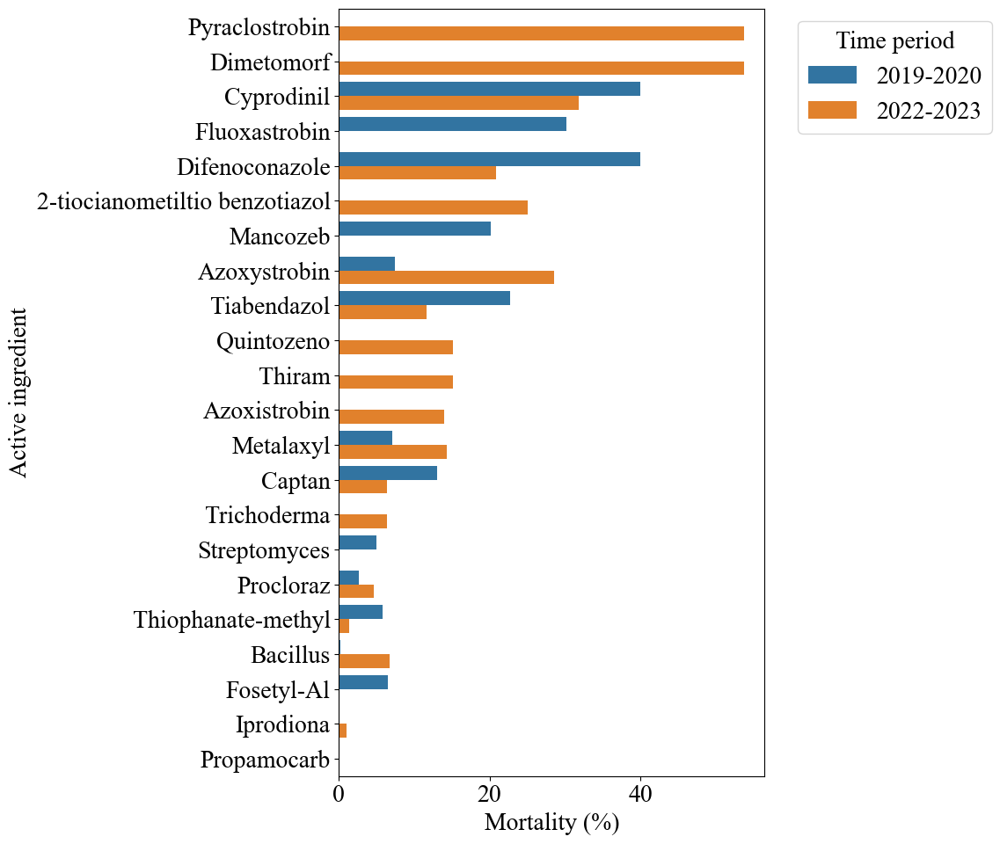

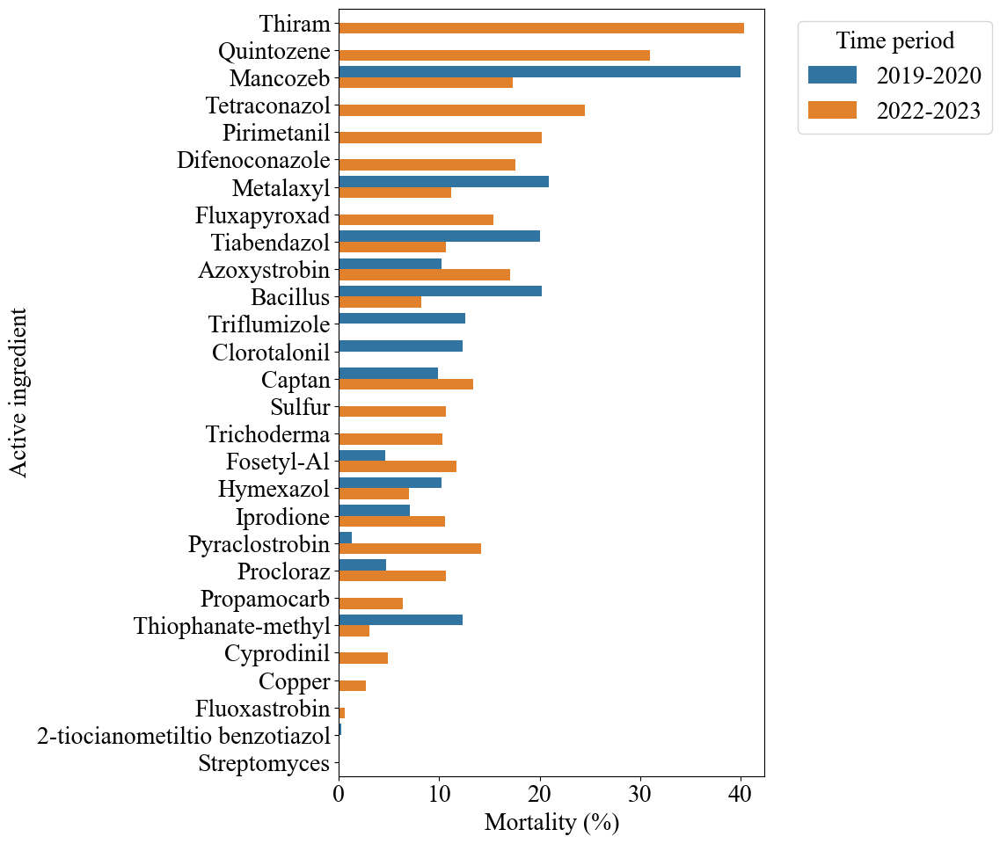

In [201]:
plt.figure(figsize=(12, 10))
orden_mort_pre = mort_pre.groupby('Ingrediente')['mortalidad'].mean().sort_values(ascending=False).index

sns.barplot(
    data=mort_pre,
    x='mortalidad',
    y='Ingrediente',
    hue='Time period',
    order=orden_mort_pre,
    errorbar=None
)
plt.xlabel('Mortality (%)')
plt.ylabel('Active ingredient')
plt.legend(title='Time period', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()


plt.figure(figsize=(12, 10))
orden_mort_pos = mort_pos.groupby('Ingrediente')['mortalidad'].mean().sort_values(ascending=False).index

sns.barplot(
    data=mort_pos,
    x='mortalidad',
    y='Ingrediente',
    hue='Time period',
    order=orden_mort_pos,
    errorbar=None
)
plt.xlabel('Mortality (%)')
plt.ylabel('Active ingredient')
plt.legend(title='Time period', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

In [906]:
manejo['cantidad ingredientes pre'] = manejo['Ingrediente pre'].str.split(',').str.len().fillna(0).astype(int)
manejo['cantidad de ingredientes pos'] = manejo['Ingrediente pos'].str.split(',').str.len().fillna(0).astype(int)

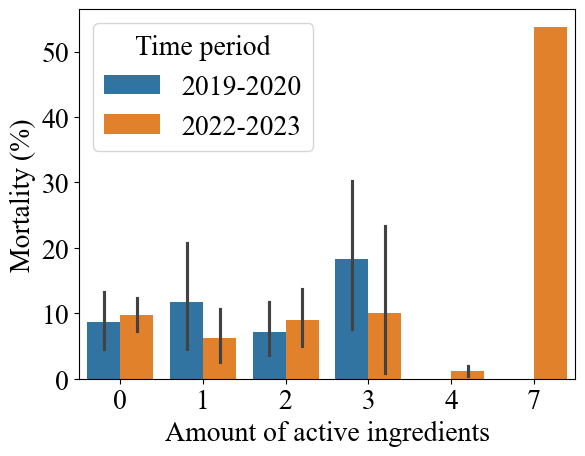

In [907]:
sns.barplot(data=manejo, y='mortalidad', x='cantidad ingredientes pre', hue='Time period')
plt.ylabel('Mortality (%)')
plt.xlabel('Amount of active ingredients')
plt.legend(title='Time period')
plt.show()

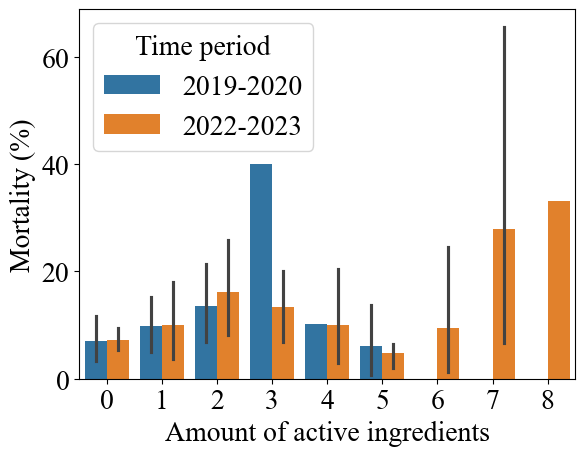

In [908]:
sns.barplot(data=manejo, y='mortalidad', x='cantidad de ingredientes pos', hue='Time period')
plt.ylabel('Mortality (%)')
plt.xlabel('Amount of active ingredients')
plt.legend(title='Time period')
plt.show()

Meta análisis (R)

In [76]:
Dcrudos_19_20.columns

Index(['No- Parcela', 'ETIQUETA', 'COORDENADAS', 'Latitud', 'Longitud',
       'MUNICIPIO', 'SUPERFICIE', 'Variety', 'CEP-R.D.',
       'LUGAR DE ORIGEN/EMPRESA', 'FECHA DE TRANSPLANTE',
       'FECHA CUBIERTACON  (PLASTICO)', 'DIAS transplante-CUBIERTA',
       'FECHA DE REPLANTE ', 'Ingrediente pre', 'Ingrediente pos',
       'Ingrediente desinfección', 'CONDICIONES DE PARCELA',
       'Plagas-FUNGUS Gnat/DUPONCHELIA', 'CULTIVO DE ROTACION ', 'mortalidad',
       '%SEVERIDAD(PLANTA)', 'SEVERIDAD EN HOJA \nPROMEDIO',
       '%SEVERIDAD HOJA  BASADO EN ESCALA De PHOMOPSIS)'],
      dtype='object')

In [77]:
data_meta19 = Dcrudos_19_20[['Latitud', 'Longitud','MUNICIPIO', 'Variety', 'CEP-R.D.',
                             'DIAS transplante-CUBIERTA','Ingrediente pre', 'Ingrediente pos','Ingrediente desinfección',
                             'CONDICIONES DE PARCELA','CULTIVO DE ROTACION ', 'mortalidad']]

In [78]:
data_meta19.columns = ['Latitude', 'Longitude','Municipality', 'Variety', 'Planting system',
                        'Days to cover','Pre active ingredient', 'Pos active ingredient','Desinfection active ingredient',
                        'Field conditions','Rotative crop', 'Mortality (%)']

In [80]:
data_meta19.loc[:, 'Field conditions'] = data_meta19['Field conditions'].replace({'INUNDADO': 'flooded',
                                                                          np.nan: 'Not Known',
                                                                          'RESIDUOS DE COSECHA': 'Harvest residues',
                                                                          'SINTOMAS DE PESTALOTIA EN HOJAS VIEJAS': 'Pestalotia symptoms on old leaves',
                                                                          'CUBIERTA Y ACOLCHADO': 'Cover and mulching',
                                                                          'INCORPORACION DE REPOLLO': 'Cabbage incorporation',
                                                                          'ACOLCHADO GRIS': 'Plastic mulching',
                                                                          'CAL AGRICOLA ': 'Agricultural lime',
                                                                          'RESIDUOS DE MAIZ': 'Harvest residues',
                                                                          'RESIDUOS DE MAIZ\nPARCELA DE SEGUNDA TEMPORADA ': 'Harvest residues',
                                                                          'RESIDUOS DE TRIGO': 'Harvest residues',
                                                                          'LOS SINTOMAS SE OBSEVAN EN LOS PECIOLOS Y HOJAS EXTERNAS A LA CORONA ': 'Symptoms',
                                                                          'SE HA HECHO POCO REPLANTE CON RAIGON': 'Replanting with cobalt, molybdenum and phytohormones',
                                                                          'FRONTERA ESTA SOBREVIVIENDO MAS ': 'Not Known',
                                                                          'LA MITAD ESTA SIN PLASTICO': 'Half without plastic',
                                                                          'CUBIERTA COMPLETA': 'Complete cover',
                                                                          'FUNGUS SE OBSERVO A LOS 15 DIAS DESPUES DE TRSPLANTE': 'Symptoms',
                                                                          'LA PLANTA NO PRENDIO ': 'Plant was not established',
                                                                          'REEMPLAZO LAS PLANTAS DEL VIVERO AL 100%': 'Replaced nursery plants 100%',
                                                                          'SE ESTA LLEVANDO A CABO EL REPLANTE TOTAL ': 'Replaced nursery plants 100%',
                                                                          'PARA REPLANTE SE COMPRO DE PLANASA': 'Replaced nursery plants',
                                                                          'MUCHAS PLANTAS MUERTAS Y GALLINA CIEGA ': 'Pests'})
data_meta19.loc[:, 'Rotative crop'] = data_meta19['Rotative crop'].replace({'MAIZ':'Corn', 
                                                                    'NO':'Without rotation', 
                                                                    np.nan:'Not known', 
                                                                    'VIVERO':'Nursery', 
                                                                    '2 AÑOS SIN NADA':'Without rotation', 
                                                                    'BROCOLI':'Brocoli', 
                                                                    'MAÍZ':'Corn',
                                                                    'TRIGO':'Wheat', 
                                                                    'JITOMATE':'Tomate', 
                                                                    'GARBANZA':'Chickpea', 
                                                                    'REPOLLO':'Cabbage', 
                                                                    'PEPINO-CALABAZA':'Cucumber and cabbage',
                                                                    'AÑO DE DESCANSO':'Without rotation'})

<Axes: xlabel='Mortality (%)', ylabel='Field conditions'>

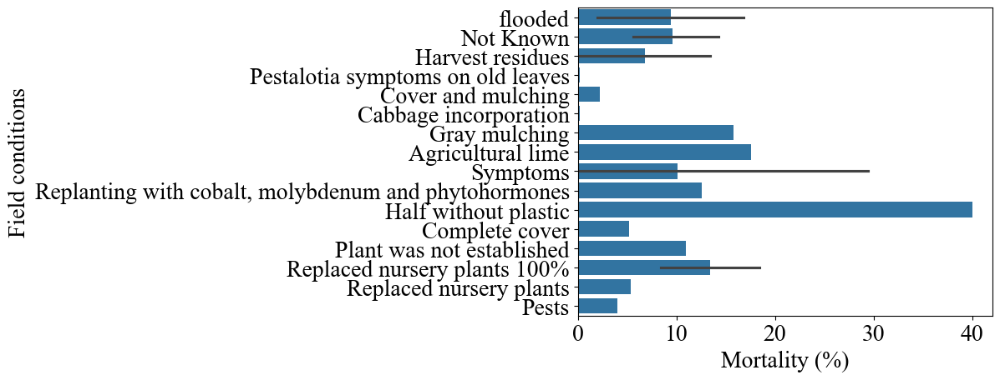

In [81]:
sns.barplot(data= data_meta19, y='Field conditions',x='Mortality (%)')


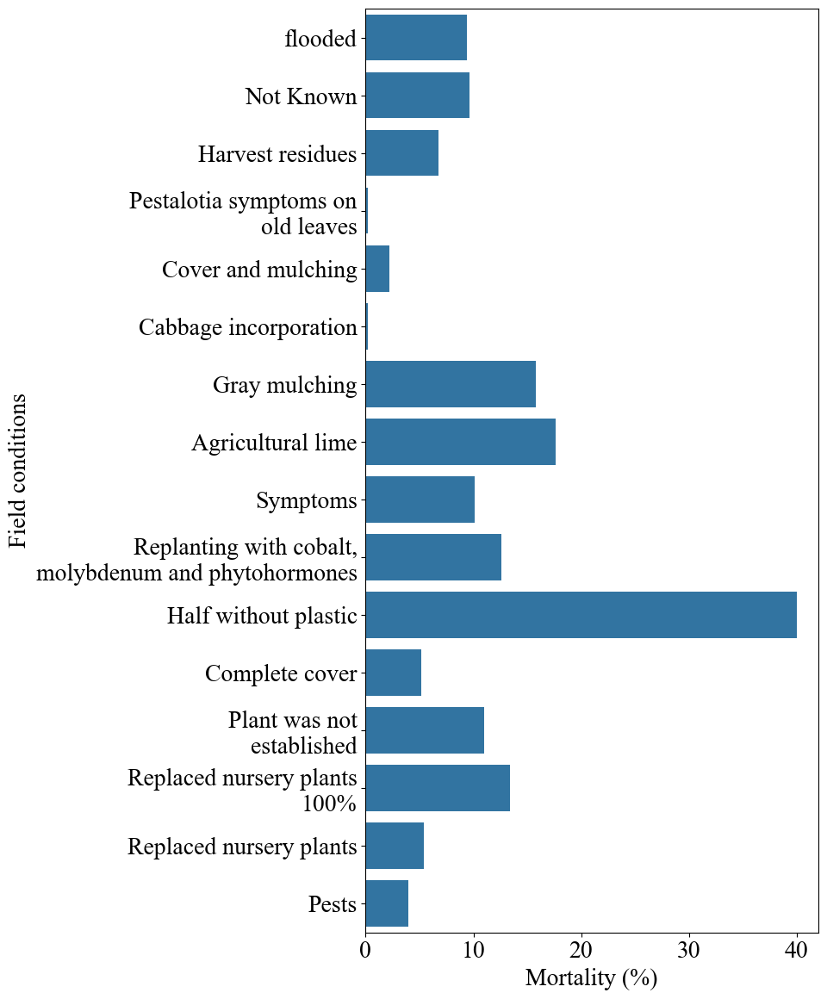

In [82]:
def split_label(label, max_words=3):
    words = label.split()
    if len(words) <= max_words:
        return label
    return '\n'.join([' '.join(words[i:i+max_words]) for i in range(0, len(words), max_words)])

data_plot = data_meta19.copy()
data_plot['Field conditions'] = data_plot['Field conditions'].apply(split_label)

plt.figure(figsize=(10, 12))
sns.barplot(data=data_plot, y='Field conditions', x='Mortality (%)',errorbar=None)
plt.xlabel("Mortality (%)")
plt.ylabel("Field conditions")
plt.tight_layout()
plt.show()


In [930]:
entrevistas23.columns

Index(['Y', 'X', 'UNIDAD DE MUESTREO', 'NUMERO DE PARCELA',
       'NOMBRE DE PARCELA', 'VARIEDAD', 'TIPO DE PLANTACION', 'INCIDENCIA ',
       'SEVERIDAD', 'MORTALIDAD', 'FECHA DE MUESTREO', 'PRODUCTOR', 'CONTACTO',
       'CODIGO HOJA', 'SUPERFICIE', 'DENSIDAD', 'FECHA DE SIEMBRA', 'Columna1',
       'MODALIDAD', 'TEMPORADA', 'ORIGEN DE LA PLANTA', 'PUESTA DE TUNEL',
       'TIPO DE RIEGO', 'FERTILIZACION', 'ASESORIA TECNICA', 'EMPRESA',
       'ANTECEDENTES FITOPAT', 'TRATAMIENTO PRE', 'productos utilizados PRE',
       'Ingrediente pre', 'TRATAMIENTO POST', 'productos utilizados POST',
       'Ingrediente pos', 'fungus', 'Duponchelia', 'Replante', 'Perdida',
       'COSTOS EN P&E', 'CULTIVO ANTERIOR', 'TEXTURA',
       'HUMEDAD AL MUESTREO (1-5)'],
      dtype='object')

In [931]:
data_meta23 = entrevistas23[['Y', 'X','UNIDAD DE MUESTREO','VARIEDAD','MORTALIDAD','MODALIDAD','PUESTA DE TUNEL',
                             'TIPO DE RIEGO', 'FERTILIZACION', 'ASESORIA TECNICA','Ingrediente pre','Ingrediente pos',
                             'CULTIVO ANTERIOR']]

In [932]:
data_meta23.columns = ['Latitude', 'Longitude','Municipality','Variety','Mortality (%)','Planting system','Days to cover',
                        'Irrigation', 'Fertilization', 'Technical assistance','Pre active ingredient','Pos active ingredient',
                        'Rotative crop']

data_meta23.loc[:, 'Days to cover'] = data_meta23['Days to cover'].replace({'NO TUNEL':'Without cover', 
                                                                    ' NO TUNEL':'Without cover', 
                                                                    np.nan:'Without cover', 
                                                                    'SEPTIEMBRE':180, 
                                                                    '07. NOVIEMBRE. 2022':'124',
                                                                    'AGOSTO':120, 
                                                                    'OCTUBRE':180, 
                                                                    ' DDP':'', 
                                                                    'NOVIEMBRE':90, 
                                                                    '04. ABRIL. 2022':0,
                                                                    'DAP':0},regex=True)
data_meta23.loc[:, 'Irrigation'] = data_meta23['Irrigation'].replace({'RODADO':'Gravity fed',
                                                              'GOTEO':'Drip',
                                                              np.nan:'Without irrigation', 
                                                              'ASPERSION':'Sprinkler'})
data_meta23.loc[:, 'Fertilization'] = data_meta23['Fertilization'].replace({np.nan:'Not known', 
                                                                    'RIEGO':'Fertigation', 
                                                                    'DIRIGIDO':'Soil'})
data_meta23.loc[:, 'Technical assistance'] = data_meta23['Technical assistance'].replace({'SI':'Yes', 
                                                                            np.nan:'Not kown', 
                                                                            'SI ':'Yes', 
                                                                            'NO':'No'})
data_meta23.loc[:, 'Rotative crop'] = data_meta23['Rotative crop'].replace({'MAIZ':'Corn', 
                                                                    np.nan:'Not known', 
                                                                    'TOMATE':'Tomate', 
                                                                    'CILANTRO':'Cilantro', 
                                                                    'EJOTE':'Bean', 
                                                                    'SORGO':'Sorghum', 
                                                                    'MAIZ TRIGO':'Corn and wheat',
                                                                    'FRESA':'Strawberry', 
                                                                    'HABAS Y MAIZ':'Fava bean and corn', 
                                                                    'JITOMATE, CEBOLLA':'Tomate and onion', 
                                                                    'CALABAZA':'Pumpkin', 
                                                                    'TRIGO':'Wheat'})

<Axes: xlabel='Mortality (%)', ylabel='Irrigation'>

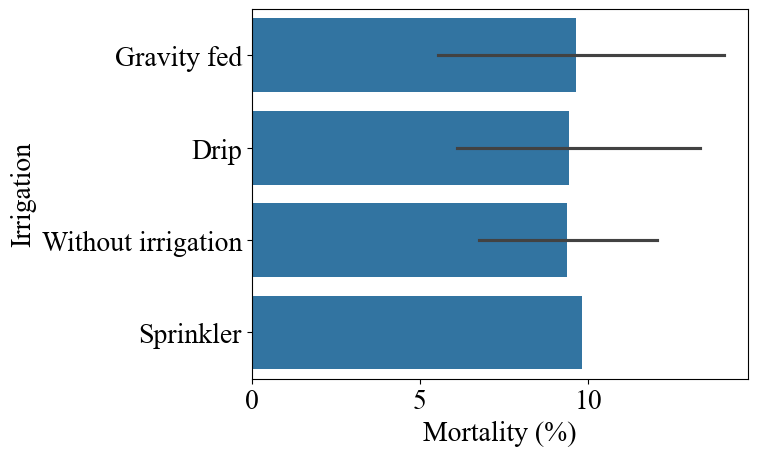

In [983]:
sns.barplot(data=data_meta23,x='Mortality (%)',y='Irrigation')

<Axes: xlabel='Mortality (%)', ylabel='Technical assistance'>

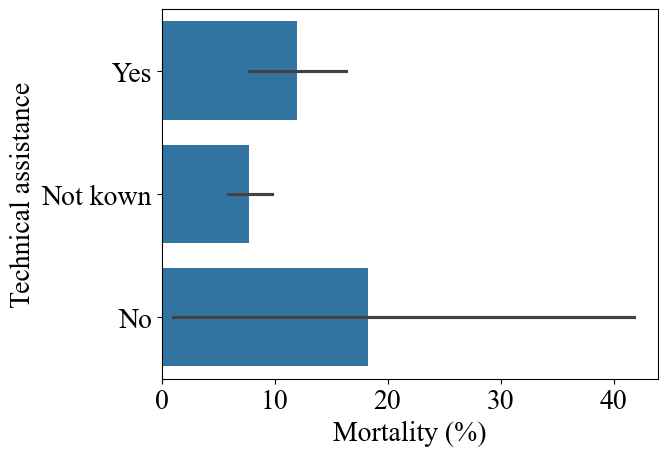

In [982]:
sns.barplot(data=data_meta23,x='Mortality (%)',y='Technical assistance')

In [933]:
data_meta19 = data_meta19.fillna('Not given')
data_meta23 = data_meta23.fillna('Not given')

In [934]:
data_meta19.to_csv('./data_meta19.csv')
data_meta23.to_csv('./data_meta23.csv')